In [26]:
import numpy as np
import pandas as pd
import pickle as pkl
import scanpy as sc
import torch 
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from omegaconf import OmegaConf
from matplotlib import rcParams
from IMPA.dataset.data_loader import CellDataLoader
from IMPA.solver import IMPAmodule

FIGSIZE=(3,3)
rcParams['figure.figsize']=FIGSIZE
import warnings
warnings.filterwarnings('ignore')

In [27]:
def plot_umap_by_X_value(adata, column, selected):
    condition = (adata.obs[column] == selected)
    adata.obs['gene_selection'] = 'others'  # Set default color to gray
    adata.obs.loc[condition, 'gene_selection'] = selected
    plt.figure(figsize=(5,5))
    sc.pl.umap(adata, color=['gene_selection'], groups=selected, show=False, alpha=0.8)  # Adjust the palette as needed
    plt.show()

In [28]:
metadata_cpg0000 = pd.read_csv("/lustre/groups/ml01/datasets/projects/cpg0000_alessandro/metadata/metadata_large_gene2vec.csv",
                              index_col=0)
metadata_cpg0000_trt = metadata_cpg0000.loc[metadata_cpg0000.STATE=="trt"]

In [29]:
metadata_cpg0000_cpd = metadata_cpg0000_trt.drop_duplicates(subset="BROAD_SAMPLE", keep="last").sort_values(by="BROAD_SAMPLE")

In [30]:
gene_unique = np.unique(metadata_cpg0000_cpd.GENE)

In [31]:
metadata_cpg0000_cpd = metadata_cpg0000_cpd.set_index("BROAD_SAMPLE")

Collect embeddings

In [32]:
pert_embeddings_path = "/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/experiments/20240313_64a0a900-f016-4398-825d-9426edaff962_cpg0000_multimodal_condition_emb/checkpoint/000047_embeddings.ckpt"
cond_embeddings_path = "/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/experiments/20240313_64a0a900-f016-4398-825d-9426edaff962_cpg0000_multimodal_condition_emb/checkpoint/000047_condition_embeddings.ckpt"

In [33]:
pert_embeddings = torch.load(pert_embeddings_path)
cond_embeddings = torch.load(cond_embeddings_path)

embeddings here are frozen

In [34]:
print(pert_embeddings["embedding_matrix"]['0.weight'].shape)
print(pert_embeddings["embedding_matrix"]['1.weight'].shape)
print(pert_embeddings["embedding_matrix"]['2.weight'].shape)

torch.Size([296, 328])
torch.Size([296, 1224])
torch.Size([155, 456])


## Initialize model 

In [35]:
import yaml

with open("/home/icb/alessandro.palma/environment/IMPA/IMPA/config_hydra/config/cpg0000_multimodal_condition_emb.yaml", "r") as file:
    config = yaml.safe_load(file)

args = OmegaConf.create(config)

dest_dir = "/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/experiments/20240313_64a0a900-f016-4398-825d-9426edaff962_cpg0000_multimodal_condition_emb"

In [36]:
dataloader = CellDataLoader(args)
solver = IMPAmodule(args, dest_dir, dataloader)
solver._load_checkpoint(47)
solver = solver.cuda()

{'CRISPR': 328, 'Compound': 1224, 'ORF': 456}
Number of parameters in generator: 24102789
Number of parameters in style_encoder: 14314208
Number of parameters in discriminator: 14681003
Number of parameters in mapping_network: 67232
Initializing embedding_matrix...
Initializing condition_embedding_matrix...
Initializing generator...
Initializing style_encoder...
Initializing discriminator...
Initializing mapping_network...
IMPAmodule(
  (embedding_matrix): ModuleList(
    (0): Embedding(296, 328)
    (1): Embedding(296, 1224)
    (2): Embedding(155, 456)
  )
  (condition_embedding_matrix): Embedding(3, 10)
  (generator): DataParallel(
    (module): Generator(
      (from_rgb): Conv2d(5, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (encode): ModuleList(
        (0): ResBlk(
          (actv): LeakyReLU(negative_slope=0.2)
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (conv2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1

## CREATE THE OBS IN THE ANNDATA

In [37]:
mol2id = dataloader.mol2id

In [38]:
metadata_cpg0000_cpd

,SAMPLE_KEY,PLATE,WELL,PERT_TYPE,CPD_NAME,STATE,ANNOT,GENE,SEQUENCE,SPLIT
BROAD_SAMPLE,,,,,,,,,,
BRD-A00827783-001-24-6,BR00117012_F08_7_69,BR00117012,F08,Compound,dyphylline,trt,Compound,PDE7A,Cn1c2ncn(CC(O)CO)c2c(=O)n(C)c1=O,train
BRD-A01078468-001-14-8,BR00117013_A04_4_10,BR00117013,A04,Compound,hexestrol,trt,Compound,AKR1C1,CCC(C(CC)c1ccc(O)cc1)c1ccc(O)cc1,train
BRD-A07207424-001-14-0,BR00117010_O13_3_47,BR00117010,O13,Compound,Ro-20-1724,trt,Compound,PDE3A,CCCCOc1cc(CC2CNC(=O)N2)ccc1OC,train
BRD-A08187463-001-12-9,BR00117010_F14_1_32,BR00117010,F14,Compound,racecadotril,trt,Compound,MME,CC(=O)SCC(Cc1ccccc1)C(=O)NCC(=O)OCc1ccccc1,test
BRD-A09722536-002-18-0,BR00117012_P14_8_71,BR00117012,P14,Compound,cyclophosphamide,trt,Compound,CYP2A6,ClCCN(CCCl)P1(=O)NCCCO1,train
...,...,...,...,...,...,...,...,...,...,...
ccsbBroad304_14931,BR00118039_M12_6_36,BR00118039,M12,ORF,DYRK1B,trt,ORF,DYRK1B,atggccgtcccaccgggccatggtcccttctctggcttcccagggc...,train
ccsbBroad304_14932,BR00118040_L19_1_49,BR00118040,L19,ORF,AURKB,trt,ORF,AURKB,atggcccagaaggagaactcctacccctggccctacggccgacaga...,train
ccsbBroad304_14989,BR00118040_F07_1_55,BR00118040,F07,ORF,CHEK2,trt,ORF,CHEK2,atgtctcgggagtcggatgttgaggctcagcagtctcatggcagca...,train


In [39]:
solver.condition_embedding_matrix

Embedding(3, 10)

In [40]:
annot = {"PERT_NAME": [],
         "PERT_TYPE": [], 
         "GENE": []}

X_embeddings = []

# Common latent observation
z_common = torch.randn(1, 1000, args.z_dimension).mean(1).cuda()
with torch.no_grad():
    # Iterate over type of perturbation and its id
    for i, pert_type in enumerate(mol2id):
        # Iterate over mols
        for mol in mol2id[pert_type]:
            annot["PERT_TYPE"].append(pert_type)
            annot["PERT_NAME"].append(mol)
            annot["GENE"].append(metadata_cpg0000_cpd.loc[mol, "GENE"])
            
            emb =  solver.embedding_matrix[i](torch.tensor(mol2id[pert_type][mol]).cuda()).unsqueeze(0)
            cond_emb = solver.condition_embedding_matrix(torch.tensor(i).cuda()).unsqueeze(0)
            concat_emb = torch.cat([emb,cond_emb,z_common], dim=1)
            with torch.no_grad():
                pert_emb = solver.mapping_network(concat_emb, None,i)
            X_embeddings.append(pert_emb)

X_embeddings = torch.cat(X_embeddings, dim=0)
annot = pd.DataFrame(annot)

In [41]:
X_embeddings

tensor([[ 0.6453, -0.9389,  0.4702,  ...,  0.9756, -0.8715, -0.5397],
        [ 0.7125, -0.8584,  0.4057,  ...,  0.9952, -0.9718, -0.4950],
        [ 0.7244, -0.8856,  0.4828,  ...,  0.9971, -0.9497, -0.4799],
        ...,
        [ 0.3763, -1.3418,  0.4290,  ...,  0.8699, -0.7282, -0.7077],
        [ 0.4203, -1.2660,  0.3098,  ...,  0.8089, -0.8049, -0.6090],
        [ 0.3757, -1.3199,  0.3955,  ...,  0.8670, -0.7597, -0.7186]],
       device='cuda:0')

In [42]:
adata = sc.AnnData(X=X_embeddings.detach().cpu().numpy(), 
                  obs=annot)

In [43]:
sc.tl.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

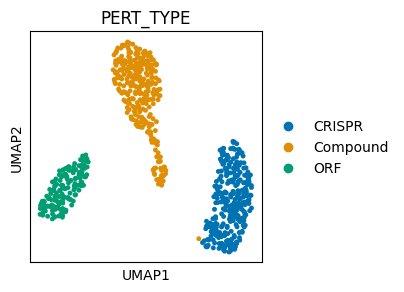

In [44]:
sc.pl.umap(adata, color="PERT_TYPE", s=50, palette=sns.color_palette("colorblind"))

In [45]:
# adata.write_h5ad("/home/icb/alessandro.palma/environment/IMPA/IMPA/project_folder/jump_experiments/perturbation_anndata.h5ad")

In [46]:
unique_genes = np.unique(adata.obs.GENE)

['ABL1_CRISPR_BRDN0001145303', 'ABL1_CRISPR_BRDN0001147538', 'ABL1_Compound_BRD-K59831625-001-03-9', 'ABL1_Compound_BRD-K87632963-001-03-0', 'ABL1_ORF_ccsbBroad304_14525']


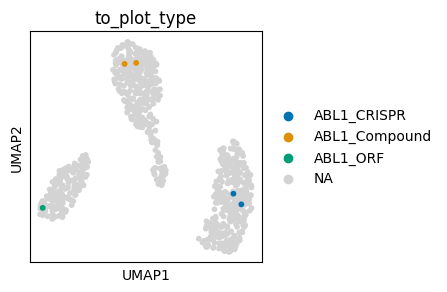

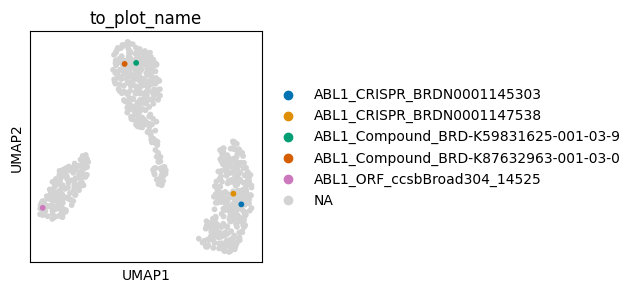

['ADA_CRISPR_BRDN0001479710', 'ADA_CRISPR_BRDN0001486925', 'ADA_Compound_BRD-K66788707-001-14-3', 'ADA_Compound_BRD-K91543828-001-02-0', 'ADA_ORF_ccsbBroad304_00023']


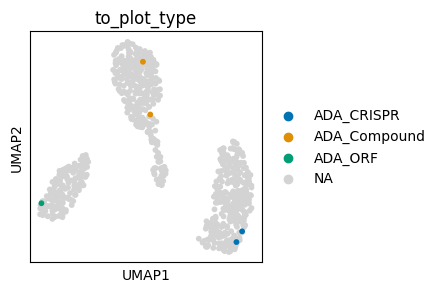

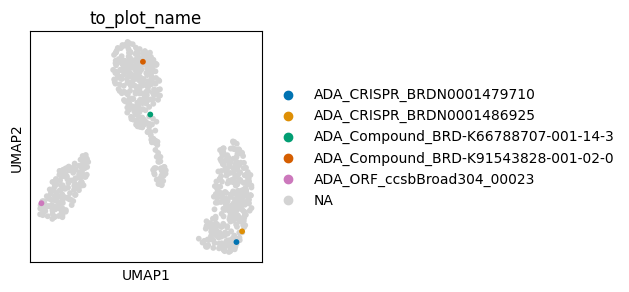

['ADH1C_CRISPR_BRDN0001479262', 'ADH1C_CRISPR_BRDN0001483052', 'ADH1C_Compound_BRD-K55567017-001-12-3', 'ADH1C_Compound_BRD-K56810756-003-07-7', 'ADH1C_ORF_ccsbBroad304_05777']


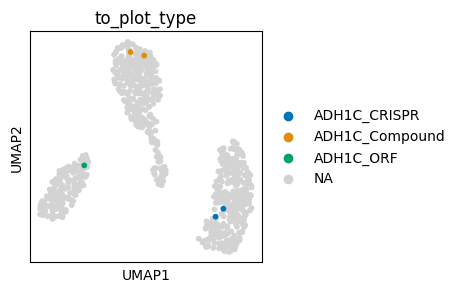

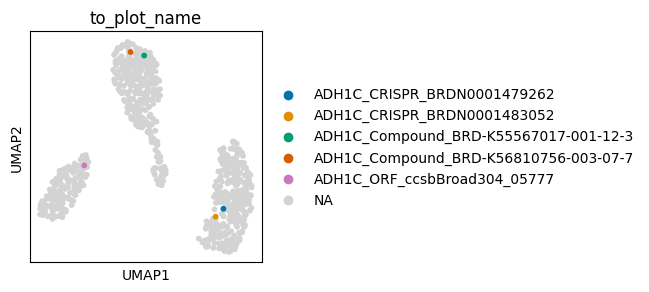

['ADORA2A_CRISPR_BRDN0001061130', 'ADORA2A_CRISPR_BRDN0001061132', 'ADORA2A_Compound_BRD-A10739734-003-09-8', 'ADORA2A_Compound_BRD-K31170746-001-01-6', 'ADORA2A_ORF_ccsbBroad304_05782']


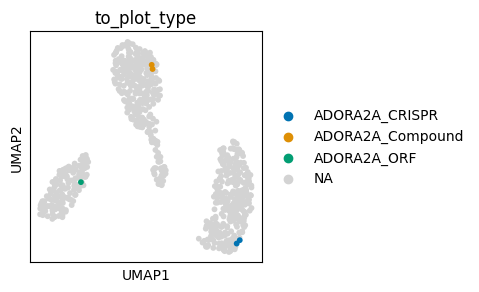

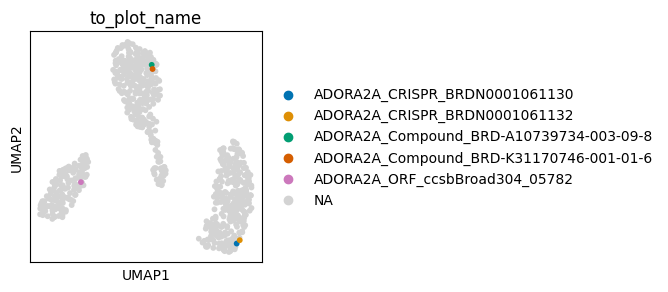

['ADRA2B_CRISPR_BRDN0001481097', 'ADRA2B_CRISPR_BRDN0001482955', 'ADRA2B_Compound_BRD-A65597028-003-08-1', 'ADRA2B_Compound_BRD-A72483914-001-03-7', 'ADRA2B_ORF_ccsbBroad304_05785']


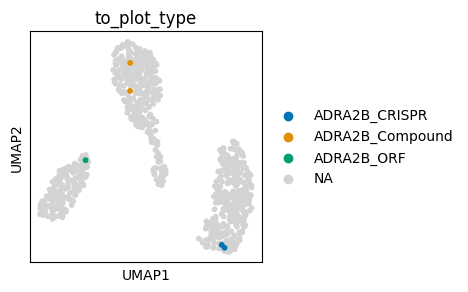

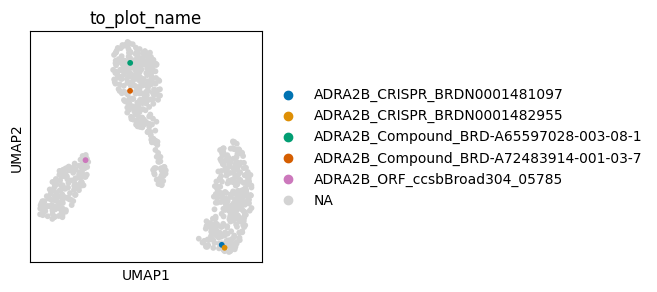

['AGER_CRISPR_BRDN0000581508', 'AGER_CRISPR_BRDN0001490543', 'AGER_Compound_BRD-K51899933-001-02-6', 'AGER_Compound_BRD-K87691185-001-01-2', 'AGER_ORF_ccsbBroad304_00037']


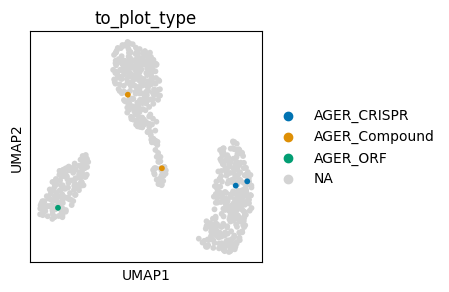

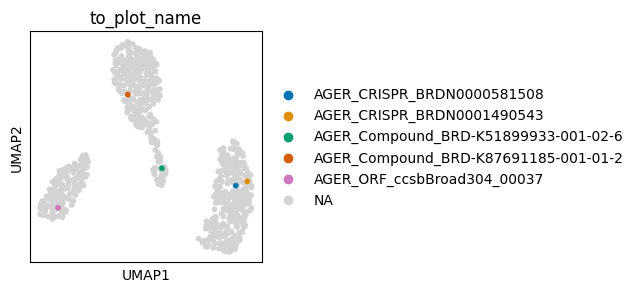

['AKR1B1_CRISPR_BRDN0001480913', 'AKR1B1_CRISPR_BRDN0001484659', 'AKR1B1_Compound_BRD-A89164055-001-03-3', 'AKR1B1_Compound_BRD-K35498378-001-06-1', 'AKR1B1_ORF_ccsbBroad304_00055']


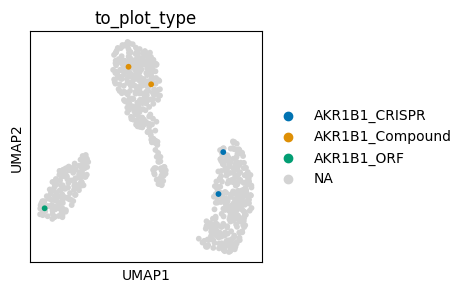

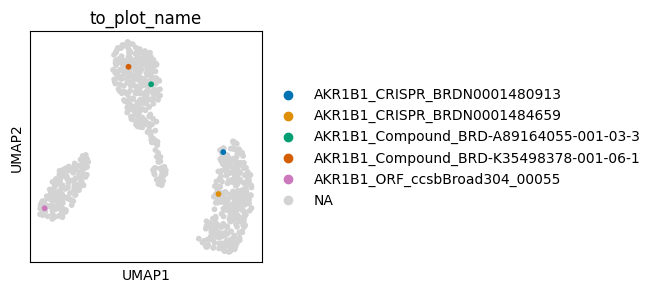

['AKR1C1_CRISPR_BRDN0001485957', 'AKR1C1_Compound_BRD-A01078468-001-14-8', 'AKR1C1_Compound_BRD-K93632104-001-17-2', 'AKR1C1_ORF_ccsbBroad304_06088']


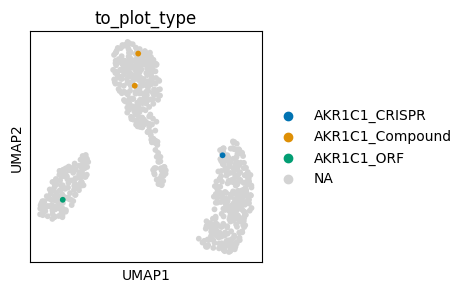

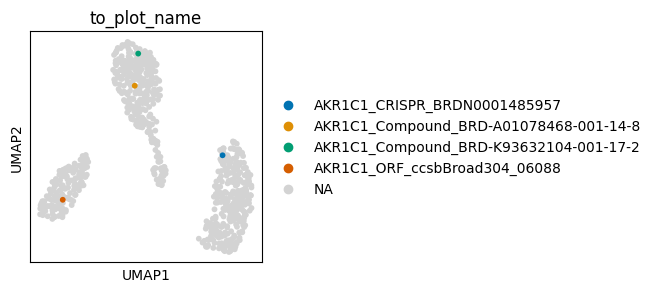

['AKT1_CRISPR_BRDN0000562836', 'AKT1_CRISPR_BRDN0001054985', 'AKT1_Compound_BRD-K25412176-001-01-9', 'AKT1_ORF_ccsbBroad304_14538']


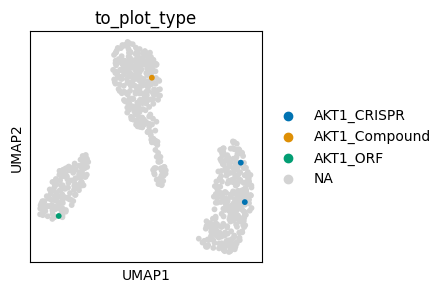

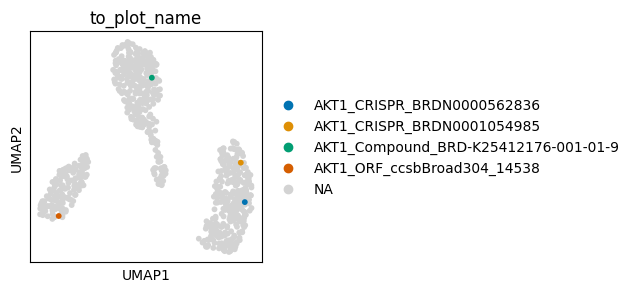

['ALDH2_CRISPR_BRDN0001479055', 'ALDH2_CRISPR_BRDN0001486449', 'ALDH2_Compound_BRD-K06890060-001-09-1', 'ALDH2_Compound_BRD-K60659193-001-01-0', 'ALDH2_ORF_ccsbBroad304_00049']


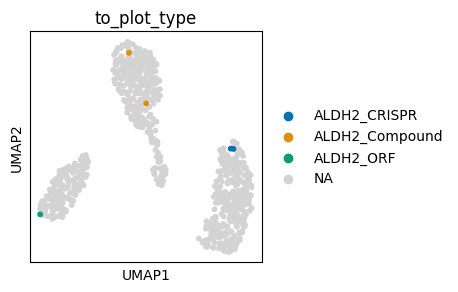

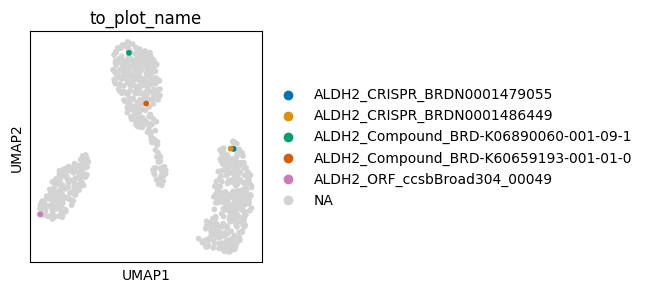

['ALK_CRISPR_BRDN0001147509', 'ALK_Compound_BRD-A23124853-001-01-4', 'ALK_Compound_BRD-K22149900-001-06-2', 'ALK_ORF_ccsbBroad304_14540']


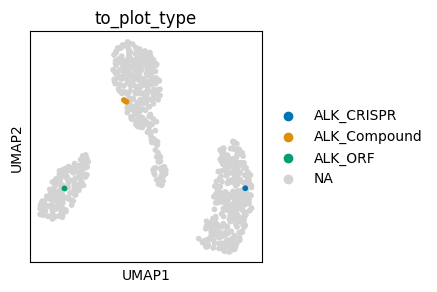

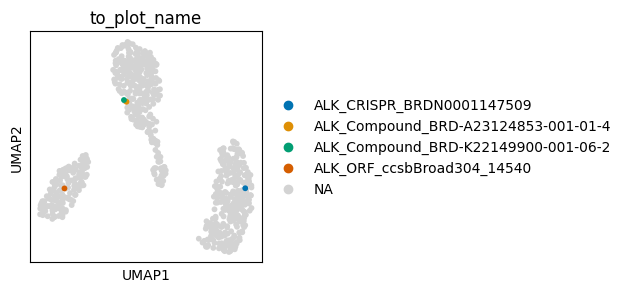

['ANXA1_CRISPR_BRDN0001483788', 'ANXA1_CRISPR_BRDN0001486382', 'ANXA1_Compound_BRD-A10188456-001-04-9', 'ANXA1_Compound_BRD-K38775274-001-22-1', 'ANXA1_ORF_ccsbBroad304_05821']


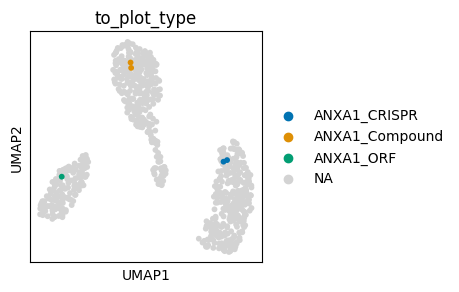

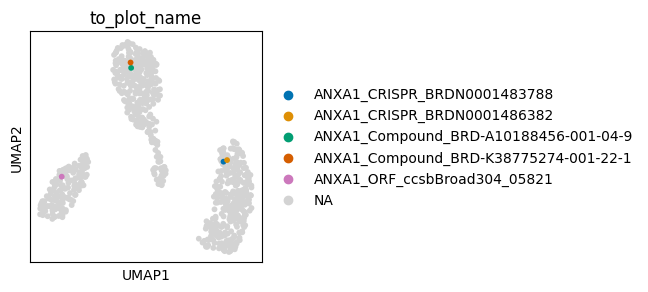

['ASIC1_CRISPR_BRDN0001480309', 'ASIC1_CRISPR_BRDN0001485349', 'ASIC1_Compound_BRD-K06674495-334-04-0', 'ASIC1_Compound_BRD-K97181089-003-24-7', 'ASIC1_ORF_ccsbBroad304_00008']


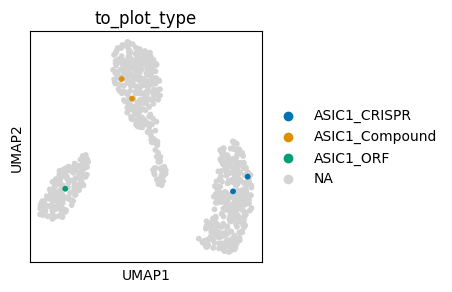

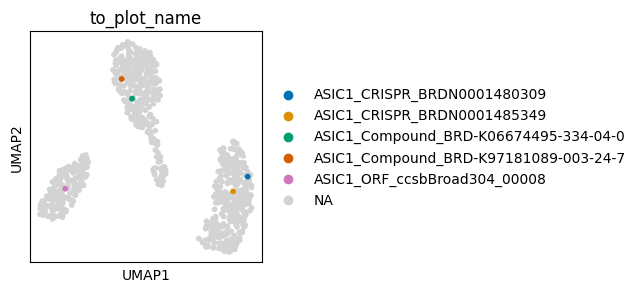

['ATM_CRISPR_BRDN0001149033', 'ATM_CRISPR_BRDN0001149518', 'ATM_Compound_BRD-K25311561-001-10-7', 'ATM_Compound_BRD-K36016295-001-05-2', 'ATM_ORF_ccsbBroad304_10688']


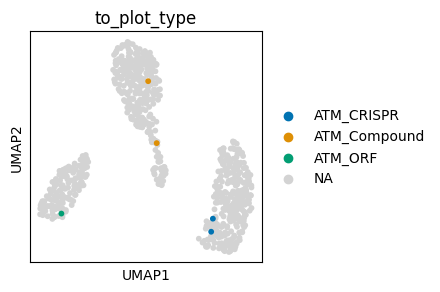

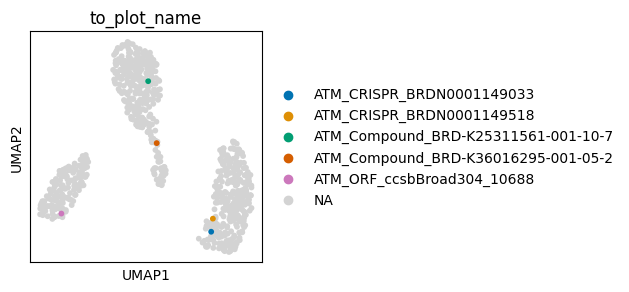

['AURKB_CRISPR_BRDN0000562944', 'AURKB_CRISPR_BRDN0001054845', 'AURKB_Compound_BRD-K21728777-001-02-3', 'AURKB_Compound_BRD-K55966568-001-09-6', 'AURKB_ORF_ccsbBroad304_14932']


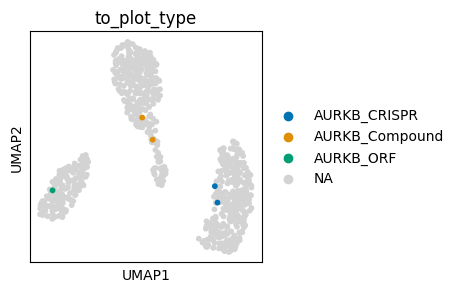

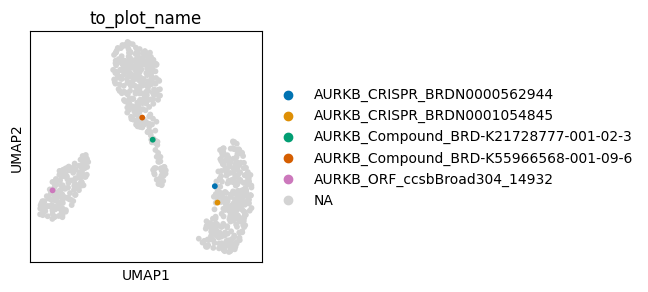

['AVPR1A_CRISPR_BRDN0001485604', 'AVPR1A_CRISPR_BRDN0001490153', 'AVPR1A_Compound_BRD-K25243230-001-01-2', 'AVPR1A_Compound_BRD-K37385792-003-02-1', 'AVPR1A_ORF_ccsbBroad304_00142']


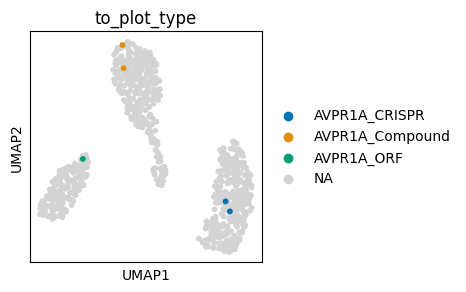

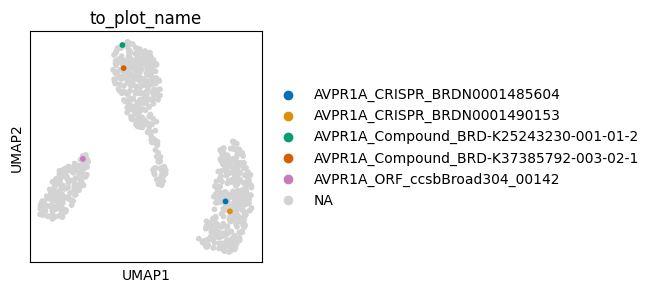

['BAX_CRISPR_BRDN0000563764', 'BAX_CRISPR_BRDN0000564018', 'BAX_Compound_BRD-A18763547-300-06-3', 'BAX_Compound_BRD-K07442505-001-03-6', 'BAX_ORF_ccsbBroad304_00150']


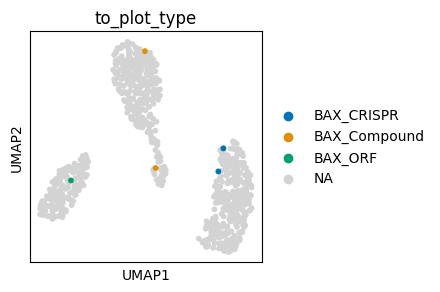

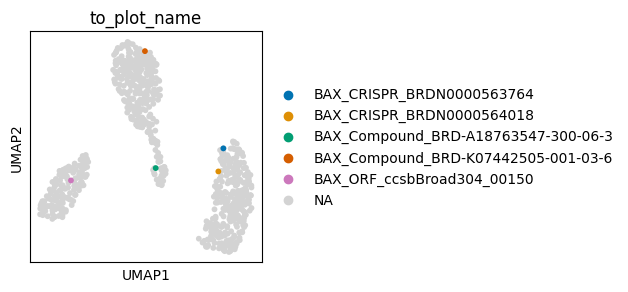

['BRAF_CRISPR_BRDN0000562882', 'BRAF_CRISPR_BRDN0001054801', 'BRAF_Compound_BRD-K62810658-001-11-4', 'BRAF_Compound_BRD-K73789395-001-09-9', 'BRAF_ORF_ccsbBroad304_16175']


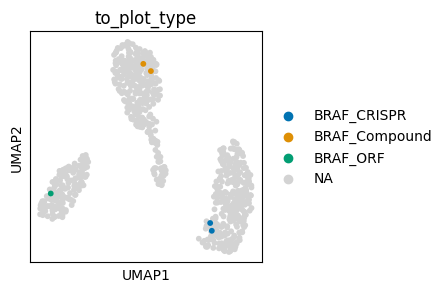

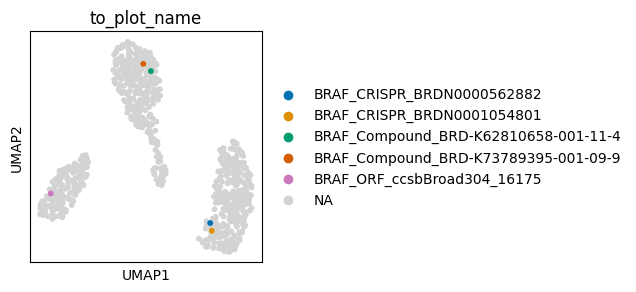

['BRD4_CRISPR_BRDN0000733514', 'BRD4_CRISPR_BRDN0001146786', 'BRD4_Compound_BRD-K12502280-001-11-4', 'BRD4_Compound_BRD-K13094524-001-04-2', 'BRD4_ORF_ccsbBroad304_11738']


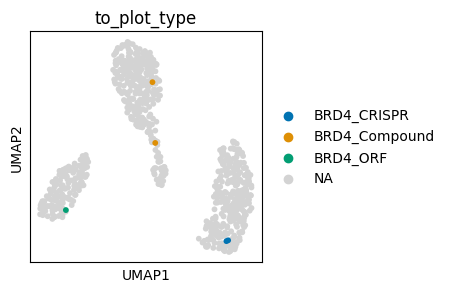

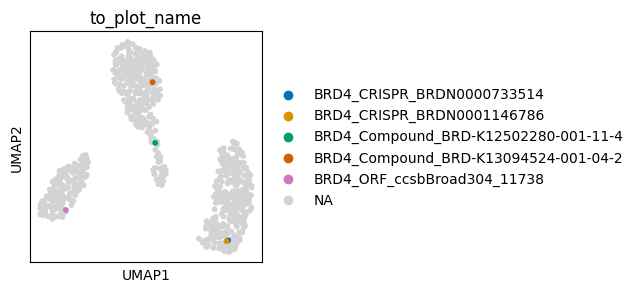

['BTK_CRISPR_BRDN0001144958', 'BTK_CRISPR_BRDN0001149473', 'BTK_Compound_BRD-K64034691-001-01-9', 'BTK_Compound_BRD-K87782578-001-01-4', 'BTK_ORF_ccsbBroad304_14554']


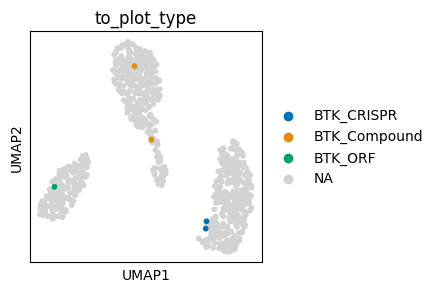

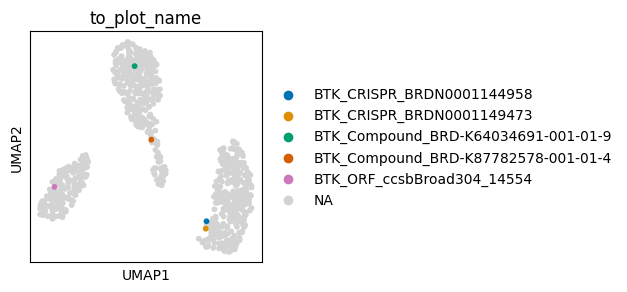

['CA14_CRISPR_BRDN0001487815', 'CA14_CRISPR_BRDN0001489794', 'CA14_Compound_BRD-K09295674-001-09-8', 'CA14_Compound_BRD-K23913458-001-20-7', 'CA14_ORF_ccsbBroad304_02813']


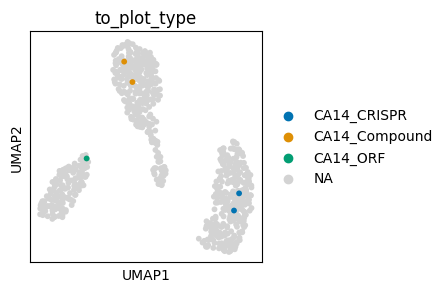

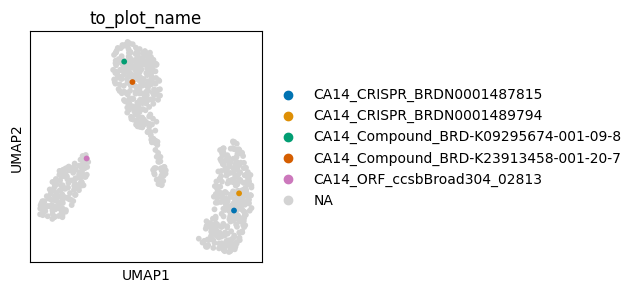

['CA5A_CRISPR_BRDN0001485334', 'CA5A_CRISPR_BRDN0001486451', 'CA5A_Compound_BRD-K18131774-001-18-4', 'CA5A_Compound_BRD-K74913225-001-14-0', 'CA5A_ORF_ccsbBroad304_05921']


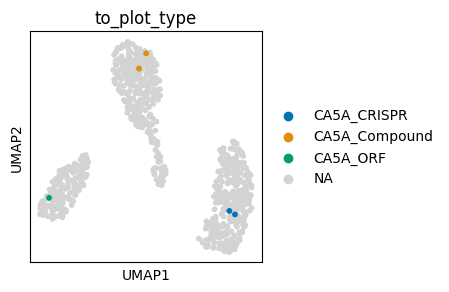

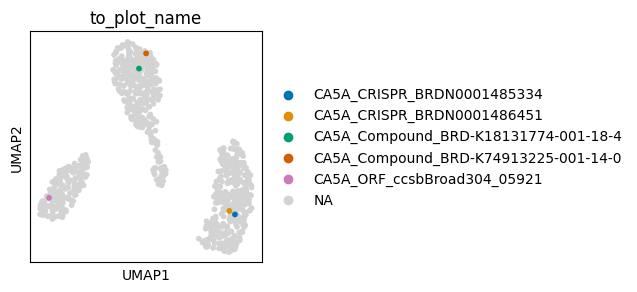

['CACNA2D3_CRISPR_BRDN0001481578', 'CACNA2D3_CRISPR_BRDN0001485608', 'CACNA2D3_Compound_BRD-A22032524-074-09-9', 'CACNA2D3_Compound_BRD-A84687895-001-03-2', 'CACNA2D3_ORF_ccsbBroad304_08590']


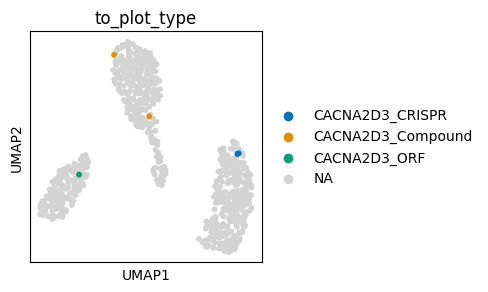

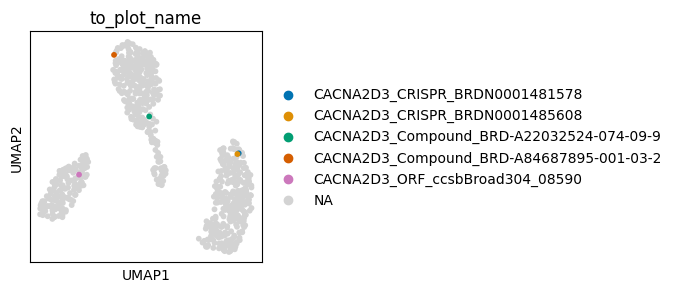

['CACNB4_CRISPR_BRDN0001487247', 'CACNB4_CRISPR_BRDN0001487328', 'CACNB4_Compound_BRD-A58048407-001-20-4', 'CACNB4_Compound_BRD-A86665761-001-01-1', 'CACNB4_ORF_ccsbBroad304_00202']


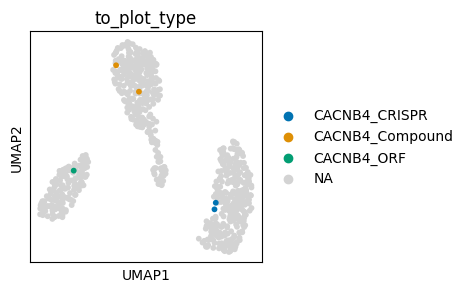

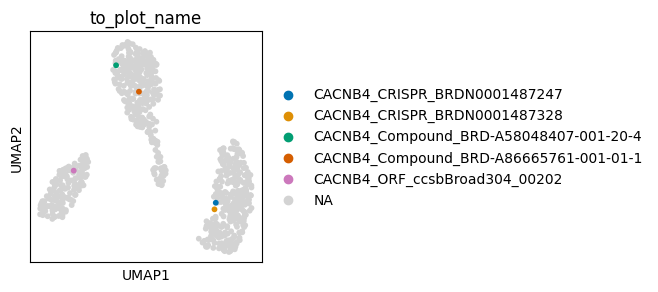

['CACNG1_CRISPR_BRDN0001479791', 'CACNG1_CRISPR_BRDN0001480256', 'CACNG1_Compound_BRD-A18992208-003-02-7', 'CACNG1_Compound_BRD-A69636825-003-04-7', 'CACNG1_ORF_ccsbBroad304_05926']


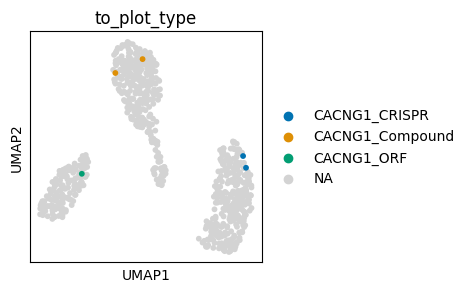

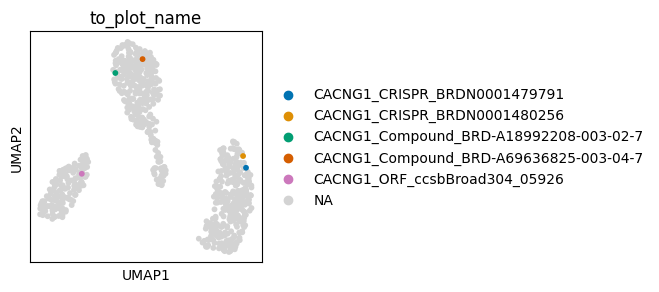

['CASP3_CRISPR_BRDN0001484045', 'CASP3_CRISPR_BRDN0001488073', 'CASP3_Compound_BRD-A93477898-001-04-2', 'CASP3_Compound_BRD-K61918008-001-07-1', 'CASP3_ORF_ccsbBroad304_00221']


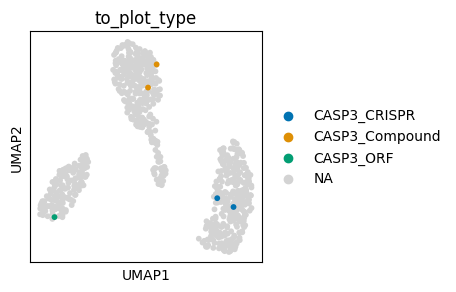

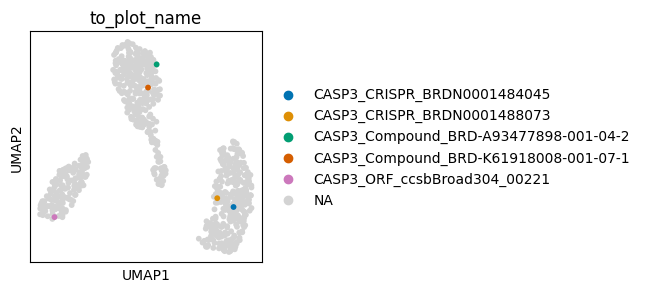

['CCND1_CRISPR_BRDN0001066064', 'CCND1_CRISPR_BRDN0001066250', 'CCND1_Compound_BRD-K05531427-001-01-7', 'CCND1_Compound_BRD-K72726508-001-02-1', 'CCND1_ORF_ccsbBroad304_00155']


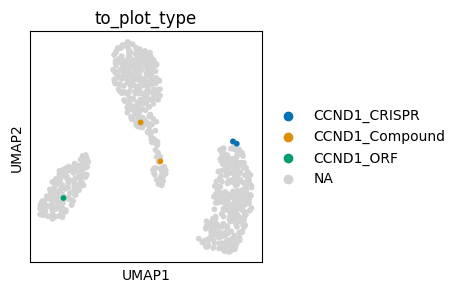

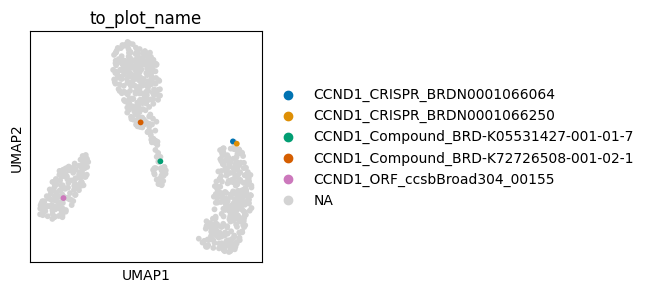

['CCR1_CRISPR_BRDN0001480476', 'CCR1_CRISPR_BRDN0001485965', 'CCR1_Compound_BRD-K68982262-001-01-4', 'CCR1_Compound_BRD-K91825936-001-03-9', 'CCR1_ORF_ccsbBroad304_00331']


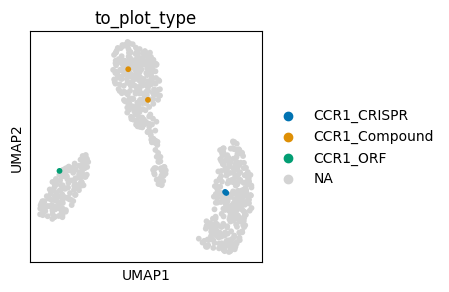

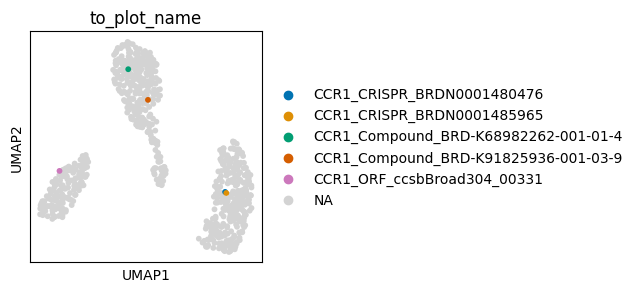

['CDC25A_CRISPR_BRDN0001482005', 'CDC25A_CRISPR_BRDN0001485726', 'CDC25A_Compound_BRD-K03109492-001-02-2', 'CDC25A_Compound_BRD-K68143200-001-11-7', 'CDC25A_ORF_ccsbBroad304_00272']


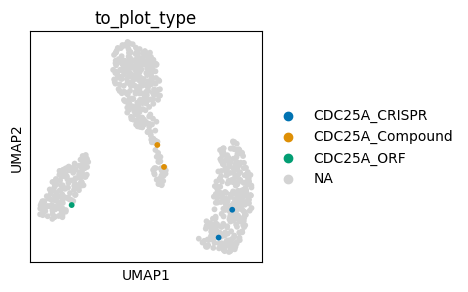

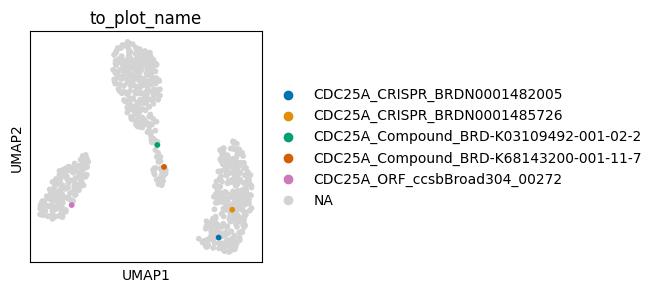

['CDK2_CRISPR_BRDN0001147786', 'CDK2_CRISPR_BRDN0001148950', 'CDK2_Compound_BRD-K07762753-001-05-1', 'CDK2_Compound_BRD-K50836978-001-03-3', 'CDK2_ORF_ccsbBroad304_14572']


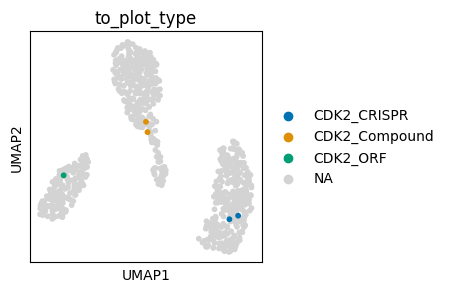

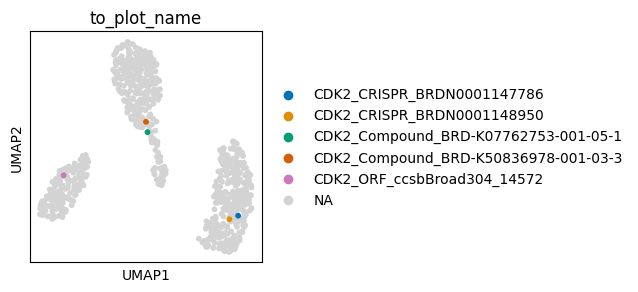

['CDK4_CRISPR_BRDN0001053816', 'CDK4_CRISPR_BRDN0001493988', 'CDK4_Compound_BRD-K06426971-001-02-7', 'CDK4_Compound_BRD-K62949423-001-03-1', 'CDK4_ORF_ccsbBroad304_00277']


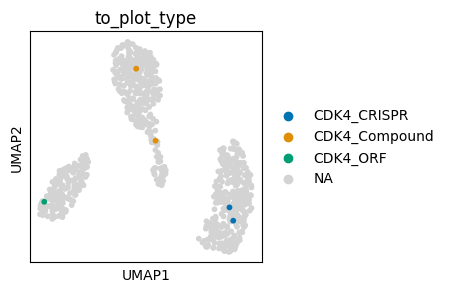

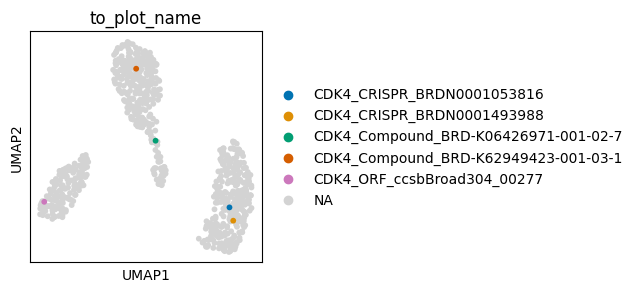

['CDK7_CRISPR_BRDN0001147450', 'CDK7_CRISPR_BRDN0001162216', 'CDK7_Compound_BRD-K64800655-001-09-0', 'CDK7_ORF_ccsbBroad304_00280']


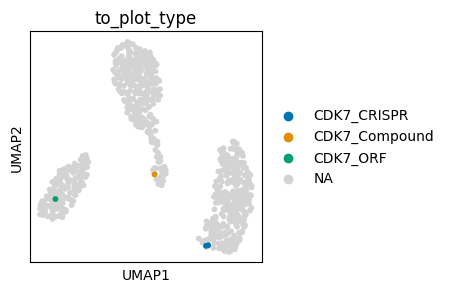

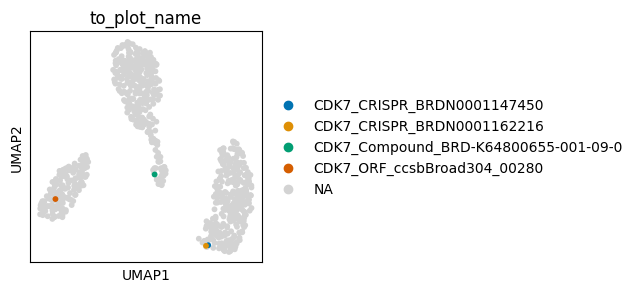

['CDK9_CRISPR_BRDN0001162576', 'CDK9_CRISPR_BRDN0001480501', 'CDK9_Compound_BRD-K14560436-001-01-4', 'CDK9_Compound_BRD-K20986415-001-02-6', 'CDK9_ORF_ccsbBroad304_14579']


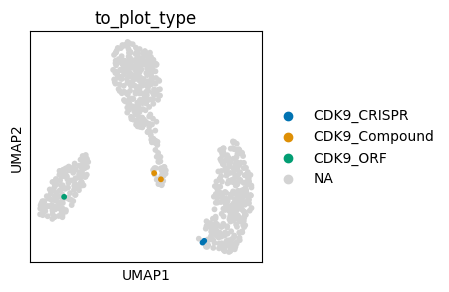

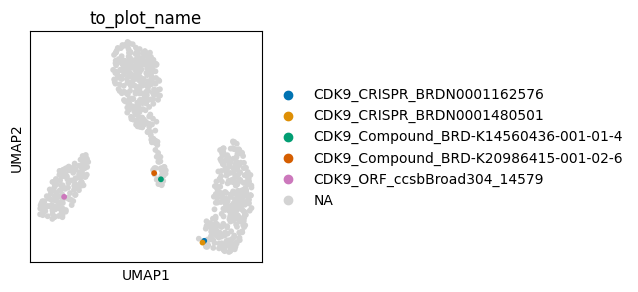

['CHEK2_CRISPR_BRDN0000585854', 'CHEK2_CRISPR_BRDN0001145610', 'CHEK2_Compound_BRD-K86525559-001-07-8', 'CHEK2_ORF_ccsbBroad304_14989']


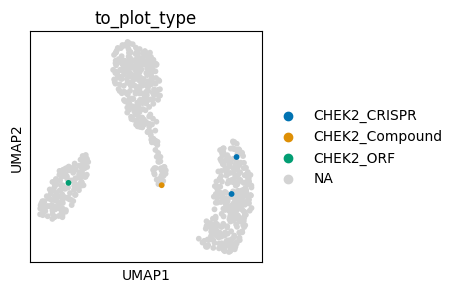

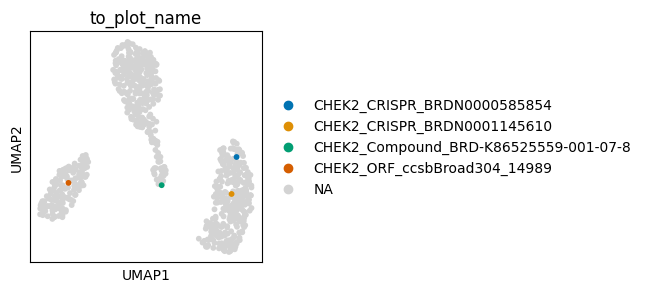

['CHRM2_CRISPR_BRDN0001482877', 'CHRM2_CRISPR_BRDN0001486606', 'CHRM2_Compound_BRD-K18895904-001-16-1', 'CHRM2_Compound_BRD-K72815923-034-02-0', 'CHRM2_ORF_ccsbBroad304_00304']


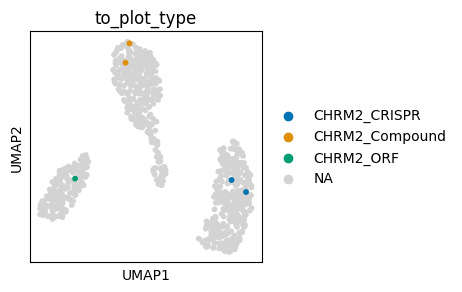

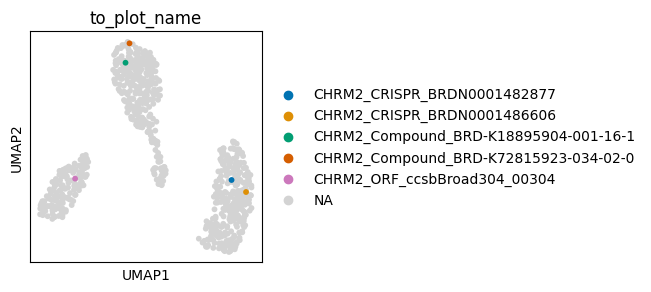

['CHRM3_CRISPR_BRDN0001480921', 'CHRM3_CRISPR_BRDN0001484703', 'CHRM3_Compound_BRD-A48180038-003-24-3', 'CHRM3_Compound_BRD-K80451230-051-02-6', 'CHRM3_ORF_ccsbBroad304_00305']


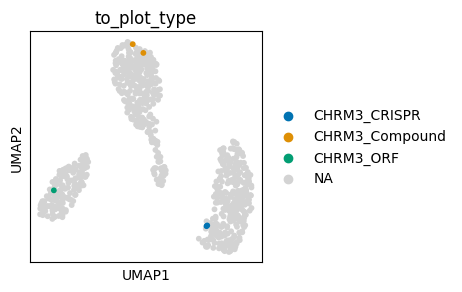

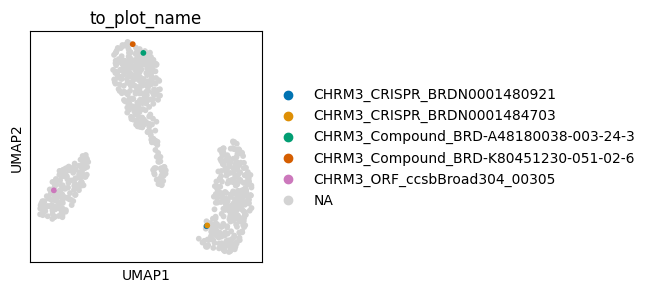

['CLK1_CRISPR_BRDN0001146512', 'CLK1_CRISPR_BRDN0001147209', 'CLK1_Compound_BRD-K66430217-001-03-8', 'CLK1_Compound_BRD-K97072811-001-11-4', 'CLK1_ORF_ccsbBroad304_00326']


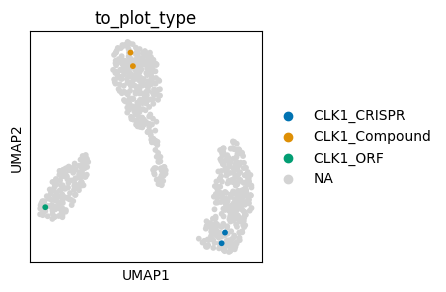

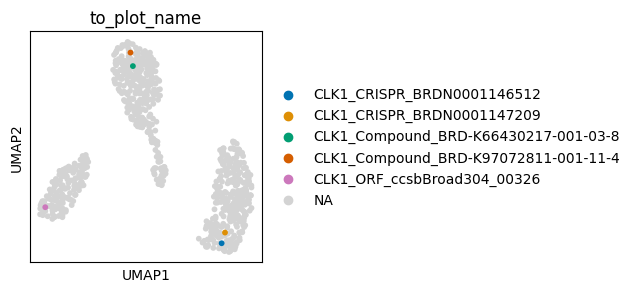

['COMT_CRISPR_BRDN0001487915', 'COMT_CRISPR_BRDN0001488371', 'COMT_Compound_BRD-K08953028-001-09-6', 'COMT_Compound_BRD-K12102668-001-25-5', 'COMT_ORF_ccsbBroad304_06018']


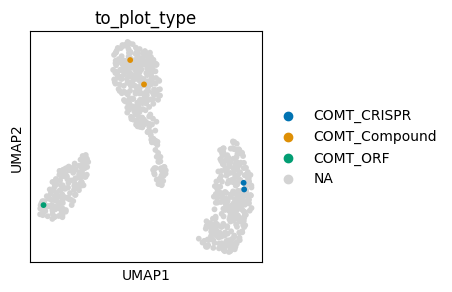

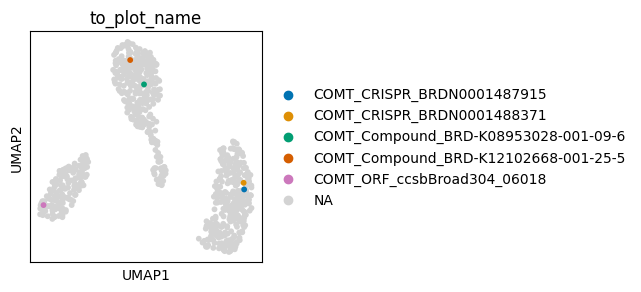

['CSF1R_CRISPR_BRDN0001146892', 'CSF1R_CRISPR_BRDN0001146959', 'CSF1R_Compound_BRD-K15819326-001-01-6', 'CSF1R_Compound_BRD-K86930074-001-05-0', 'CSF1R_ORF_ccsbBroad304_14597']


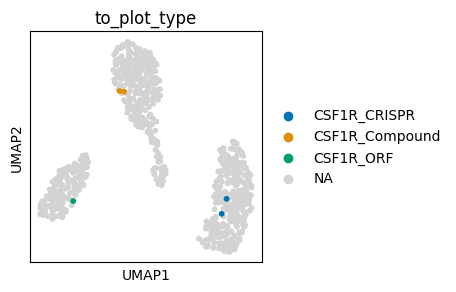

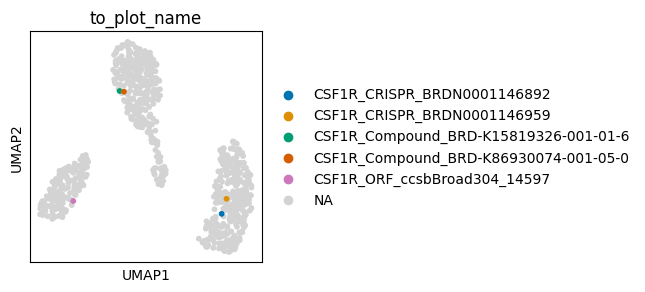

['CSK_CRISPR_BRDN0000987760', 'CSK_CRISPR_BRDN0001144968', 'CSK_Compound_BRD-K25244359-066-02-6', 'CSK_Compound_BRD-K50495309-001-02-0', 'CSK_ORF_ccsbBroad304_00376']


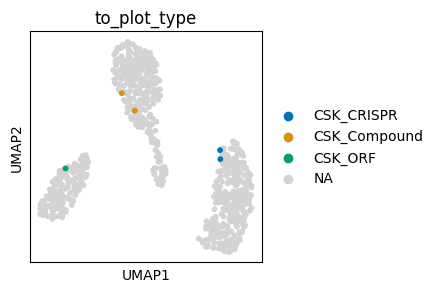

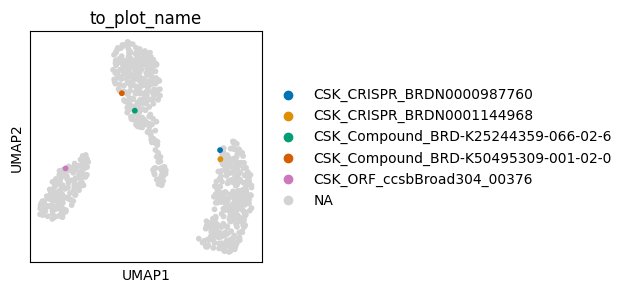

['CTSG_CRISPR_BRDN0001483527', 'CTSG_CRISPR_BRDN0001489120', 'CTSG_Compound_BRD-K59325863-001-04-4', 'CTSG_Compound_BRD-K91188791-001-17-5', 'CTSG_ORF_ccsbBroad304_00396']


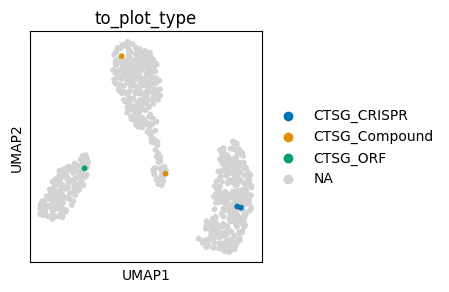

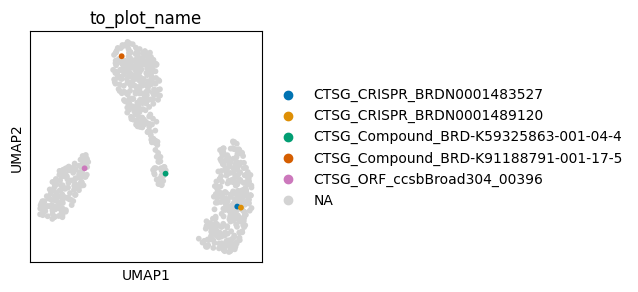

['CYP1A2_CRISPR_BRDN0001485385', 'CYP1A2_CRISPR_BRDN0001487249', 'CYP1A2_Compound_BRD-K01825690-065-01-9', 'CYP1A2_Compound_BRD-K63430059-001-16-4', 'CYP1A2_ORF_ccsbBroad304_00407']


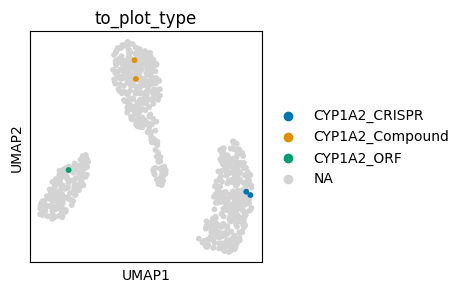

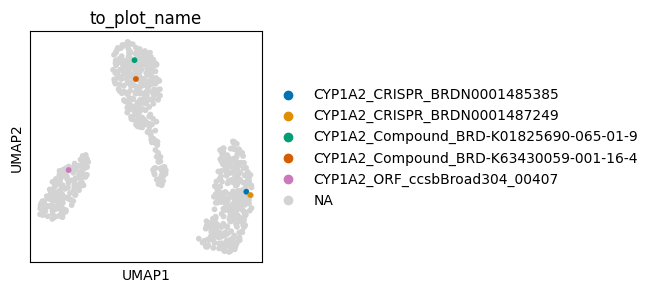

['CYP2A6_CRISPR_BRDN0001479298', 'CYP2A6_Compound_BRD-A09722536-002-18-0', 'CYP2A6_Compound_BRD-K15502390-001-20-9', 'CYP2A6_ORF_ccsbBroad304_06071']


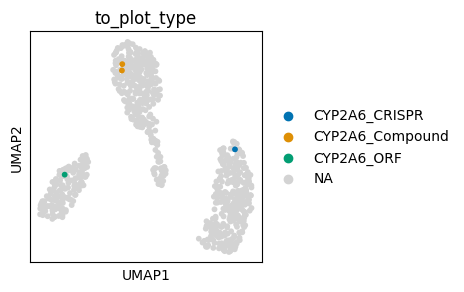

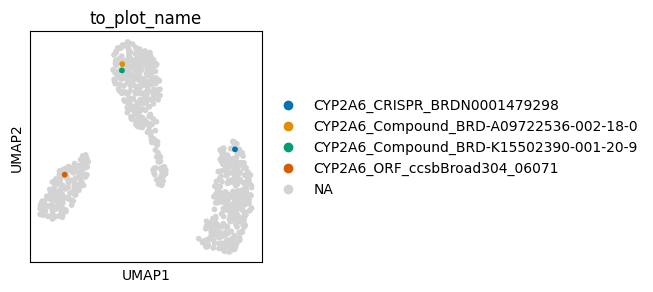

['CYP3A4_CRISPR_BRDN0001481569', 'CYP3A4_CRISPR_BRDN0001482043', 'CYP3A4_Compound_BRD-K36740062-001-06-6', 'CYP3A4_Compound_BRD-K97010173-001-04-1', 'CYP3A4_ORF_ccsbBroad304_00411']


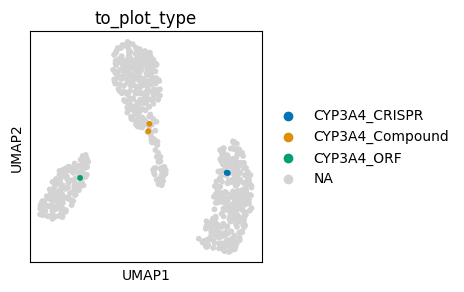

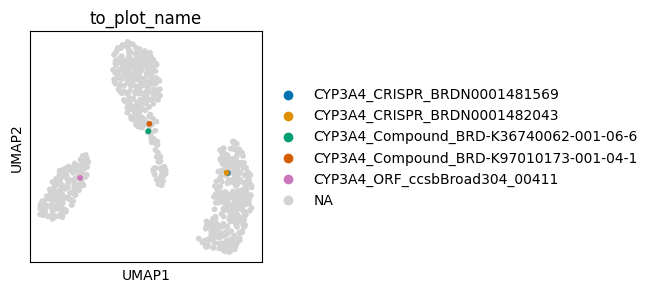

['DCK_CRISPR_BRDN0001148859', 'DCK_CRISPR_BRDN0001487070', 'DCK_Compound_BRD-K71106091-001-09-5', 'DCK_Compound_BRD-K91822704-003-07-2', 'DCK_ORF_ccsbBroad304_06085']


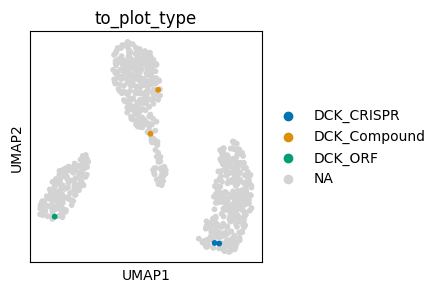

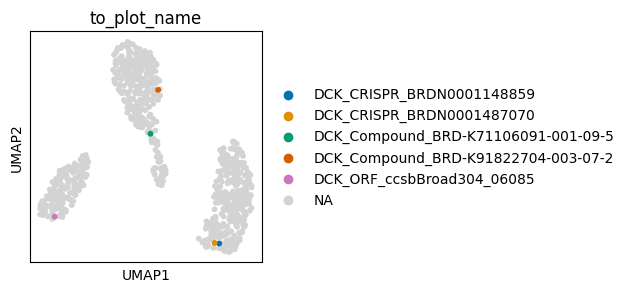

['DDR2_CRISPR_BRDN0001147364', 'DDR2_CRISPR_BRDN0001147906', 'DDR2_Compound_BRD-K16730910-001-07-3', 'DDR2_Compound_BRD-K61845293-300-01-9', 'DDR2_ORF_ccsbBroad304_14724']


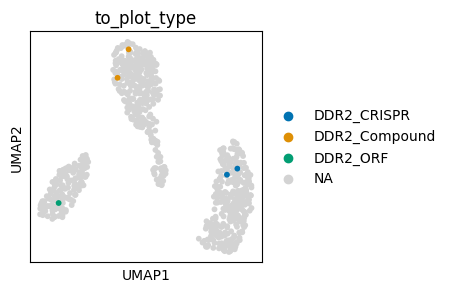

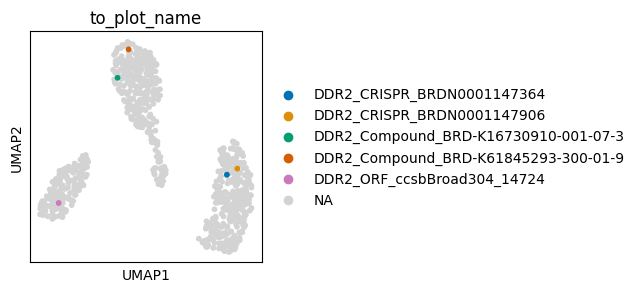

['DHH_CRISPR_BRDN0001481027', 'DHH_CRISPR_BRDN0001485023', 'DHH_Compound_BRD-K50498985-001-03-3', 'DHH_Compound_BRD-K51265828-001-01-0', 'DHH_ORF_ccsbBroad304_03155']


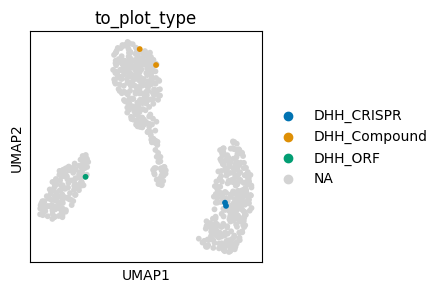

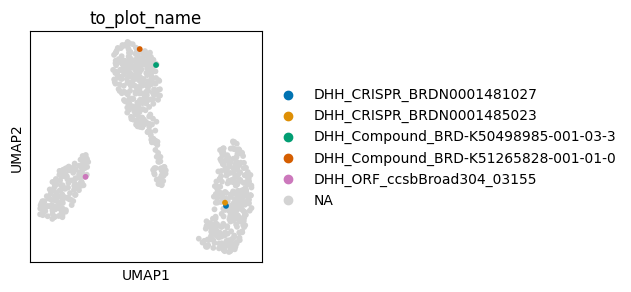

['DNMT3A_CRISPR_BRDN0001066751', 'DNMT3A_CRISPR_BRDN0001066838', 'DNMT3A_Compound_BRD-K03406345-001-21-1', 'DNMT3A_ORF_ccsbBroad304_00454']


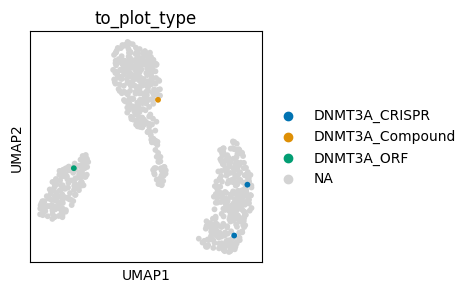

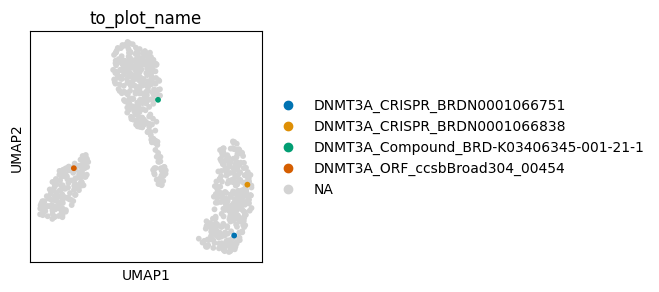

['DYRK1B_CRISPR_BRDN0001149418', 'DYRK1B_CRISPR_BRDN0001149482', 'DYRK1B_Compound_BRD-K80935598-001-01-1', 'DYRK1B_Compound_BRD-K89517477-001-01-4', 'DYRK1B_ORF_ccsbBroad304_14931']


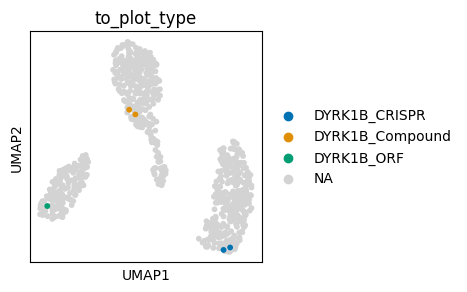

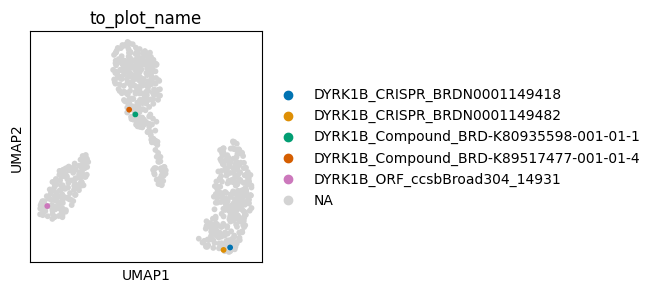

['EDNRB_CRISPR_BRDN0001486852', 'EDNRB_CRISPR_BRDN0001489609', 'EDNRB_Compound_BRD-K02490038-236-03-8', 'EDNRB_Compound_BRD-K98357249-001-02-9', 'EDNRB_ORF_ccsbBroad304_06138']


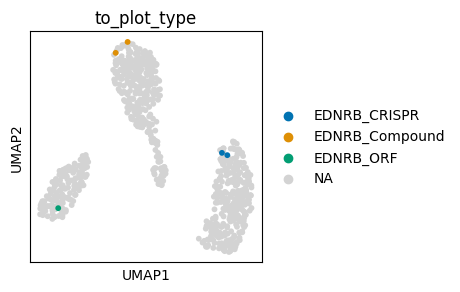

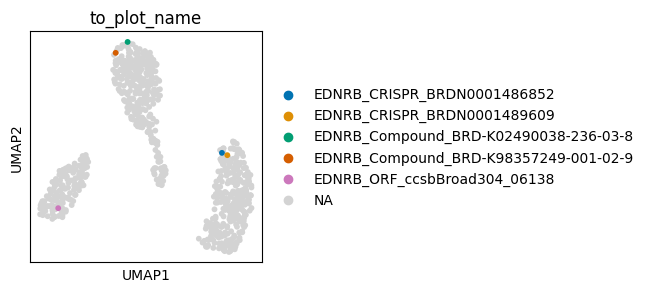

['ELANE_CRISPR_BRDN0001482390', 'ELANE_CRISPR_BRDN0001483830', 'ELANE_Compound_BRD-K31476763-001-01-5', 'ELANE_Compound_BRD-K37864785-001-01-0', 'ELANE_ORF_ccsbBroad304_00494']


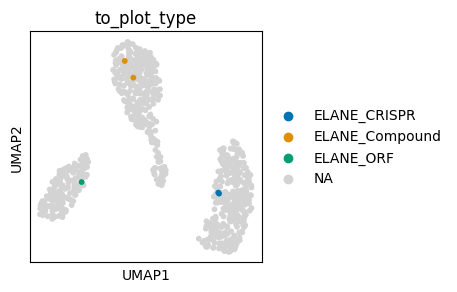

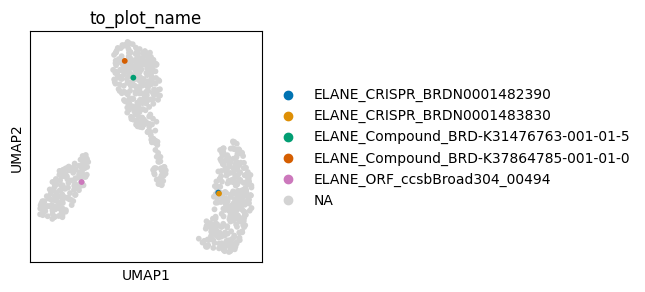

['ERBB2_CRISPR_BRDN0000579738', 'ERBB2_CRISPR_BRDN0001148320', 'ERBB2_Compound_BRD-K61642990-001-01-0', 'ERBB2_Compound_BRD-K76908866-001-07-6', 'ERBB2_ORF_ccsbBroad304_14631']


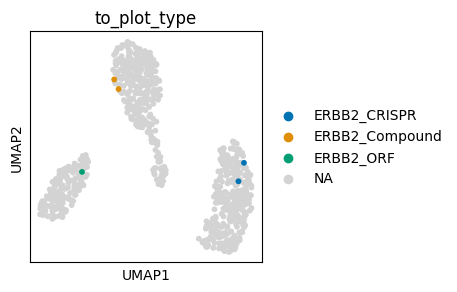

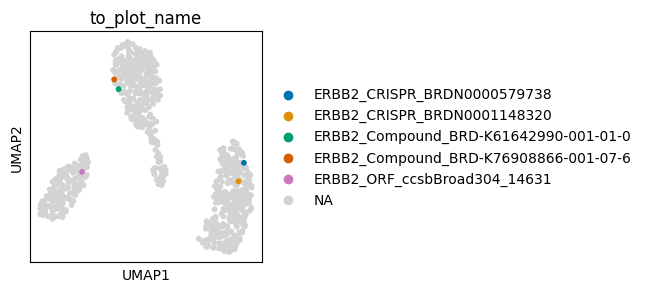

['EZH2_CRISPR_BRDN0001057455', 'EZH2_Compound_BRD-K26989966-001-04-3', 'EZH2_Compound_BRD-K91535048-001-01-2', 'EZH2_ORF_ccsbBroad304_00526']


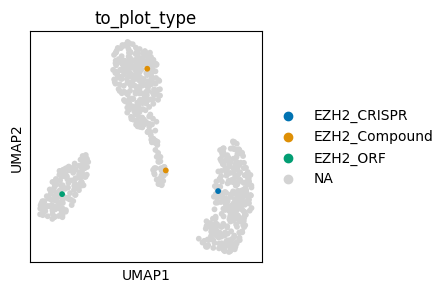

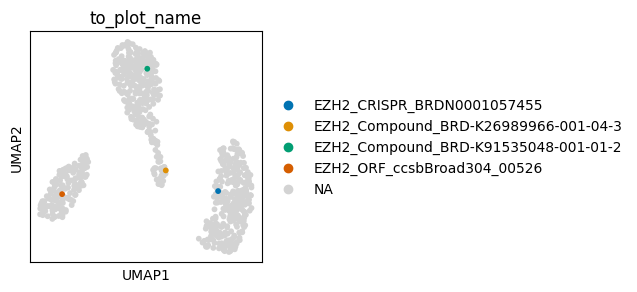

['F10_CRISPR_BRDN0001481654', 'F10_CRISPR_BRDN0001483506', 'F10_Compound_BRD-K29322660-001-01-9', 'F10_Compound_BRD-K78126613-001-27-7', 'F10_ORF_ccsbBroad304_06188']


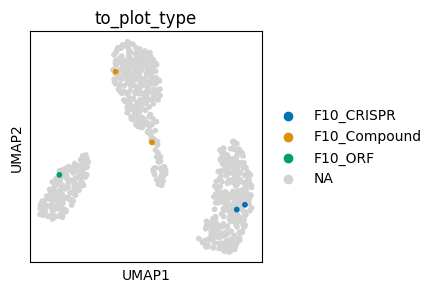

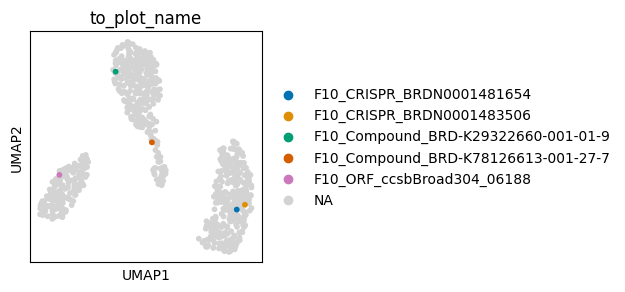

['FFAR2_CRISPR_BRDN0001487543', 'FFAR2_CRISPR_BRDN0001487636', 'FFAR2_Compound_BRD-A54139254-001-09-2', 'FFAR2_Compound_BRD-K05878375-236-05-7', 'FFAR2_ORF_ccsbBroad304_00681']


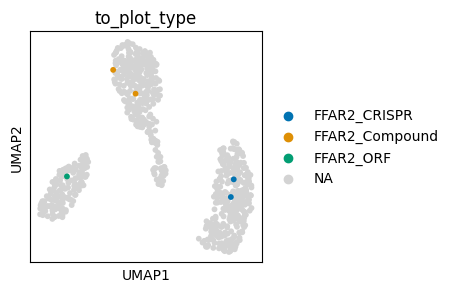

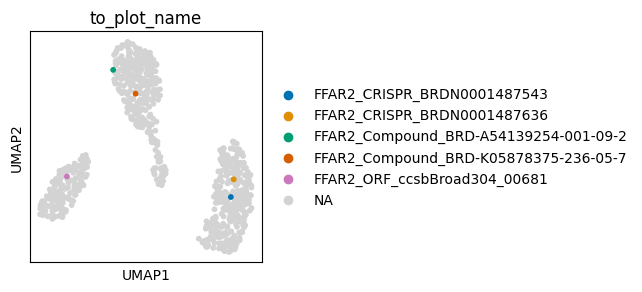

['FFAR4_CRISPR_BRDN0001483355', 'FFAR4_CRISPR_BRDN0001486630', 'FFAR4_Compound_BRD-K24282351-001-01-4', 'FFAR4_Compound_BRD-K26514105-001-01-7', 'FFAR4_ORF_ccsbBroad304_05439']


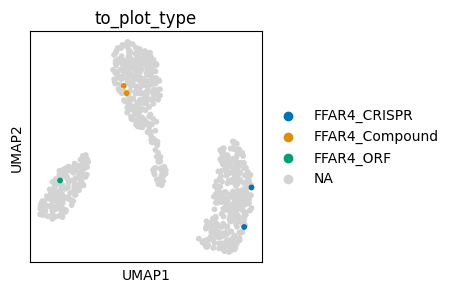

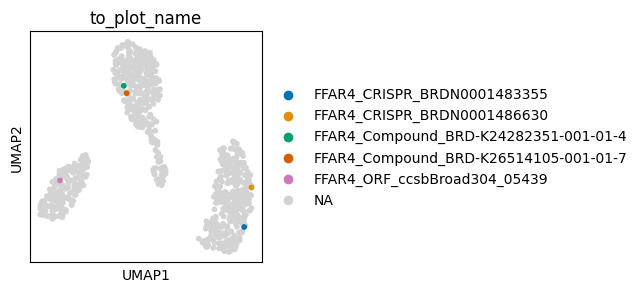

['FGF1_CRISPR_BRDN0001485228', 'FGF1_CRISPR_BRDN0001487761', 'FGF1_Compound_BRD-K29530284-001-06-2', 'FGF1_Compound_BRD-K74514084-003-09-2', 'FGF1_ORF_ccsbBroad304_00555']


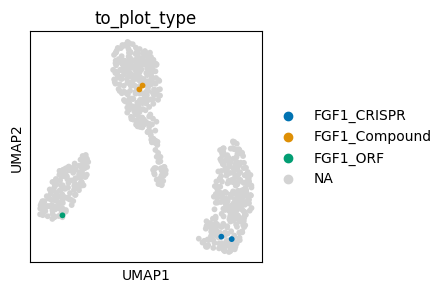

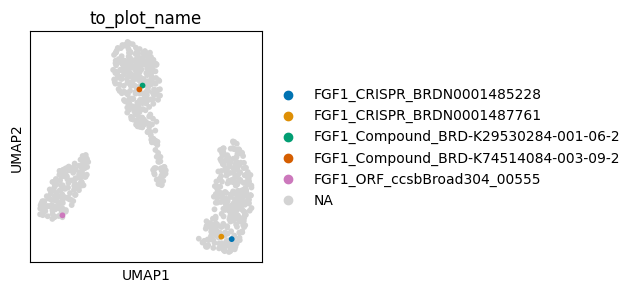

['FLT3_CRISPR_BRDN0001145324', 'FLT3_CRISPR_BRDN0001149376', 'FLT3_Compound_BRD-K90747162-001-01-4', 'FLT3_Compound_BRD-K91283740-003-01-6', 'FLT3_ORF_ccsbBroad304_14644']


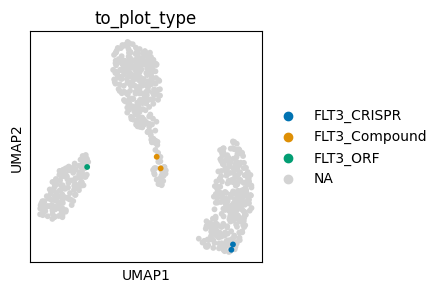

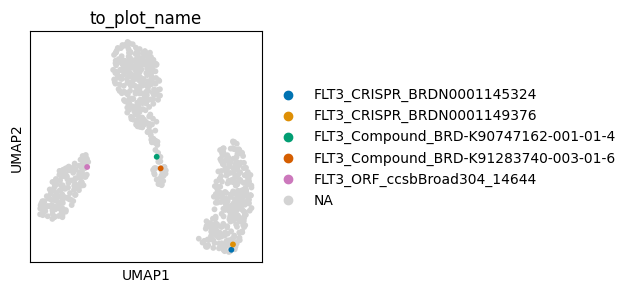

['FOXM1_CRISPR_BRDN0001480412', 'FOXM1_CRISPR_BRDN0001485150', 'FOXM1_Compound_BRD-A20697603-001-07-2', 'FOXM1_Compound_BRD-K58049875-001-03-9', 'FOXM1_ORF_ccsbBroad304_00576']


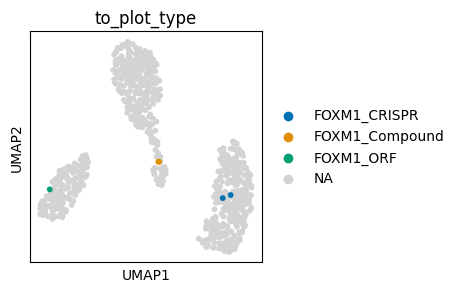

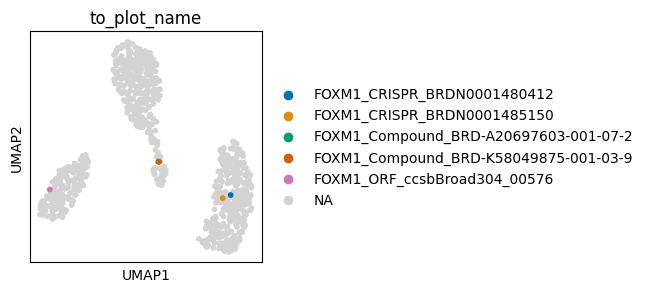

['FPR1_CRISPR_BRDN0000990355', 'FPR1_CRISPR_BRDN0000990412', 'FPR1_Compound_BRD-A36217750-001-16-3', 'FPR1_Compound_BRD-K13533483-001-16-2', 'FPR1_ORF_ccsbBroad304_06221']


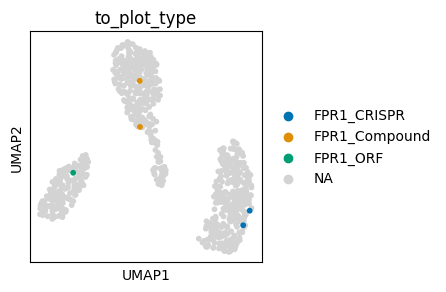

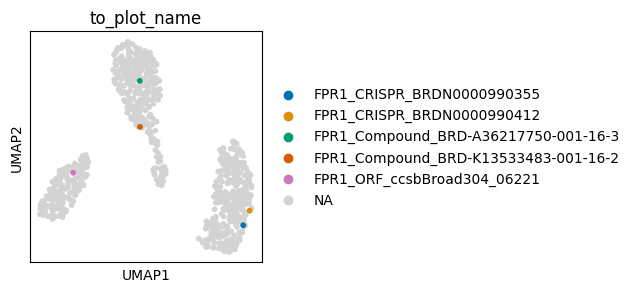

['GAA_CRISPR_BRDN0001486303', 'GAA_CRISPR_BRDN0001487440', 'GAA_Compound_BRD-A63310107-001-04-8', 'GAA_Compound_BRD-K20897876-001-11-8', 'GAA_ORF_ccsbBroad304_06237']


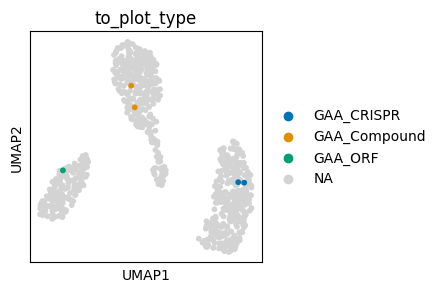

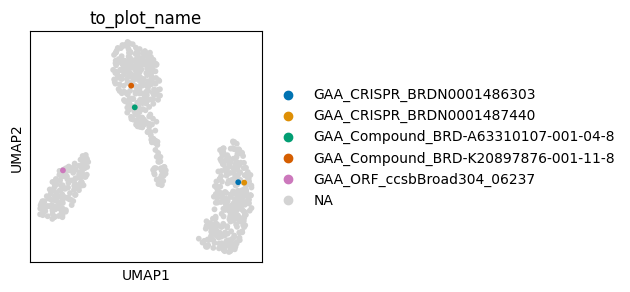

['GABRB2_CRISPR_BRDN0001482741', 'GABRB2_CRISPR_BRDN0001486784', 'GABRB2_Compound_BRD-K33882852-003-02-8', 'GABRB2_ORF_ccsbBroad304_00607']


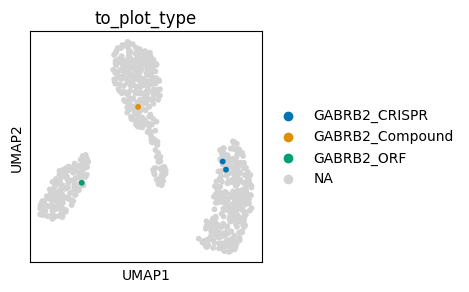

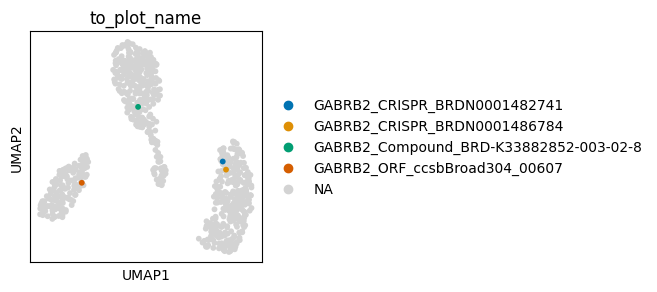

['GHSR_CRISPR_BRDN0001479972', 'GHSR_CRISPR_BRDN0001488469', 'GHSR_Compound_BRD-K02554563-001-01-6', 'GHSR_Compound_BRD-K44771174-066-01-0', 'GHSR_ORF_ccsbBroad304_06272']


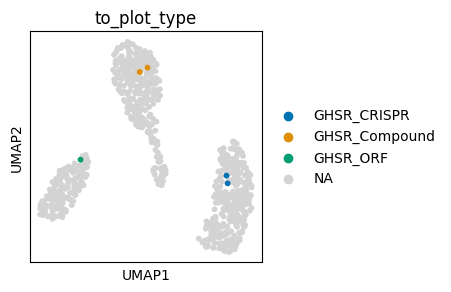

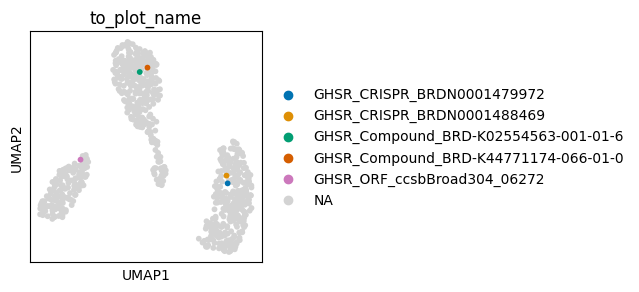

['GJB4_CRISPR_BRDN0001486377', 'GJB4_CRISPR_BRDN0001488358', 'GJB4_Compound_BRD-K09338665-001-08-9', 'GJB4_Compound_BRD-K44067360-001-29-5', 'GJB4_ORF_ccsbBroad304_04829']


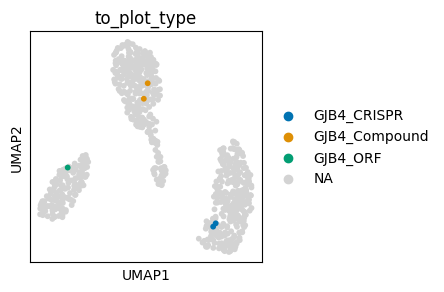

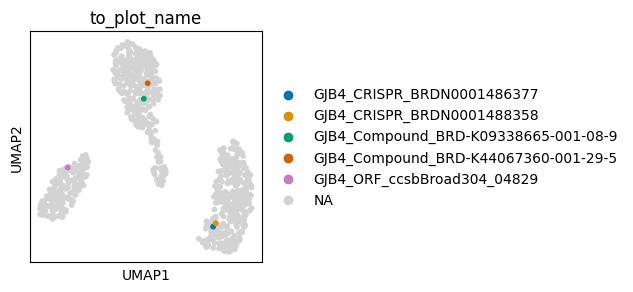

['GLRA3_CRISPR_BRDN0001485619', 'GLRA3_CRISPR_BRDN0001486172', 'GLRA3_Compound_BRD-A91822151-001-05-0', 'GLRA3_Compound_BRD-K36461289-001-05-8', 'GLRA3_ORF_ccsbBroad304_07194']


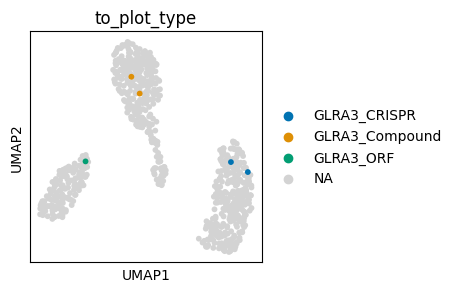

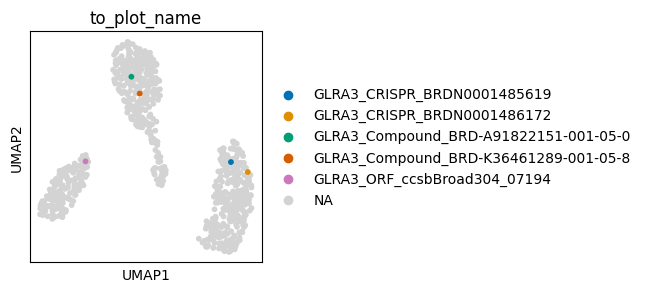

['GPR55_CRISPR_BRDN0001482725', 'GPR55_CRISPR_BRDN0001483314', 'GPR55_Compound_BRD-K27539181-001-08-5', 'GPR55_Compound_BRD-K42352790-001-05-3', 'GPR55_ORF_ccsbBroad304_02128']


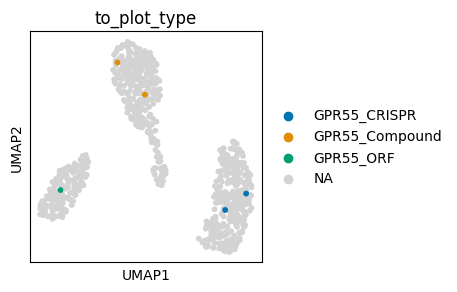

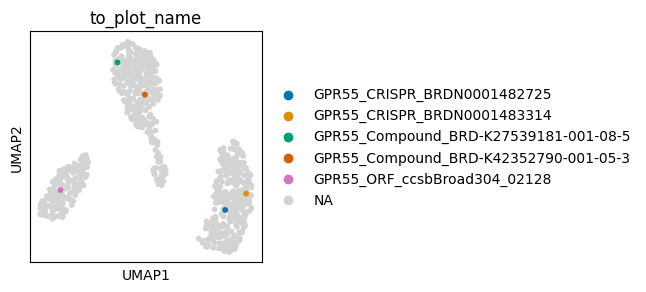

['GRIN2A_CRISPR_BRDN0001481599', 'GRIN2A_CRISPR_BRDN0001483549', 'GRIN2A_Compound_BRD-K09787262-001-02-7', 'GRIN2A_Compound_BRD-K11796549-001-05-2', 'GRIN2A_ORF_ccsbBroad304_00691']


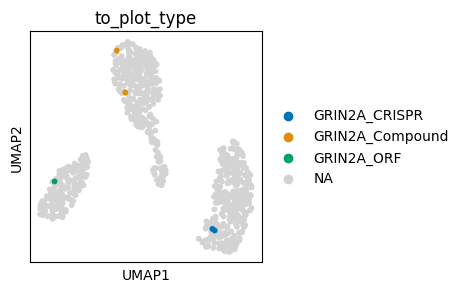

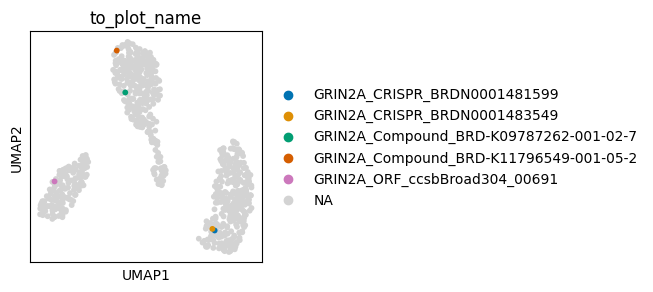

['HBB_CRISPR_BRDN0001480931', 'HBB_CRISPR_BRDN0001481787', 'HBB_Compound_BRD-K29791386-001-01-8', 'HBB_Compound_BRD-K37355418-236-01-6', 'HBB_ORF_ccsbBroad304_06353']


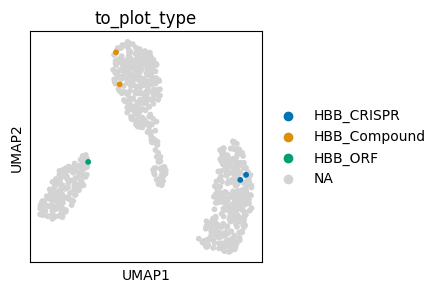

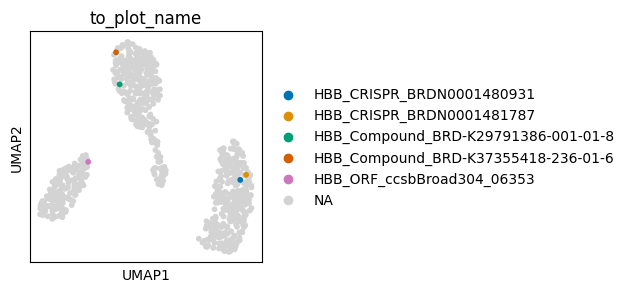

['HCK_CRISPR_BRDN0000585461', 'HCK_CRISPR_BRDN0001147690', 'HCK_Compound_BRD-K47598052-001-14-1', 'HCK_Compound_BRD-K81801188-001-02-8', 'HCK_ORF_ccsbBroad304_00733']


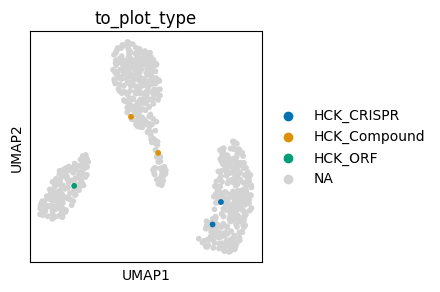

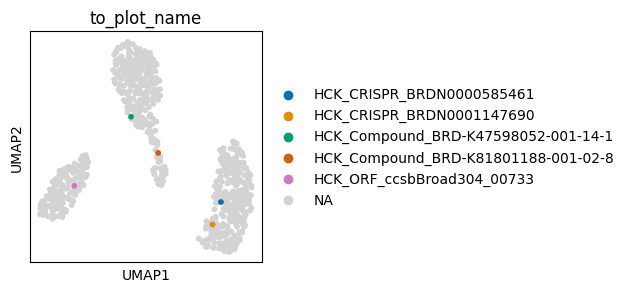

['HDAC3_CRISPR_BRDN0000582721', 'HDAC3_CRISPR_BRDN0000733096', 'HDAC3_Compound_BRD-K61397605-001-01-8', 'HDAC3_Compound_BRD-K61688984-001-02-9', 'HDAC3_ORF_ccsbBroad304_07311']


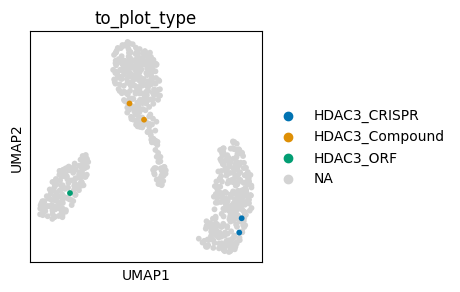

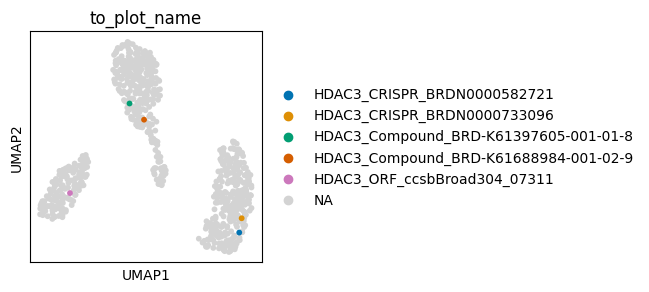

['HDAC6_CRISPR_BRDN0000582784', 'HDAC6_CRISPR_BRDN0001057535', 'HDAC6_Compound_BRD-K11558771-001-13-9', 'HDAC6_Compound_BRD-K36660044-001-24-2', 'HDAC6_ORF_ccsbBroad304_11445']


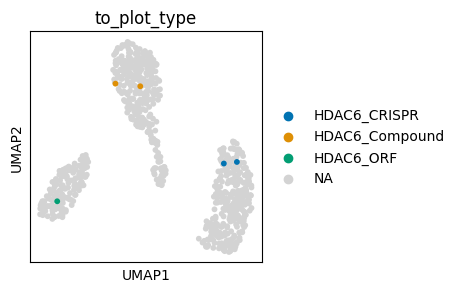

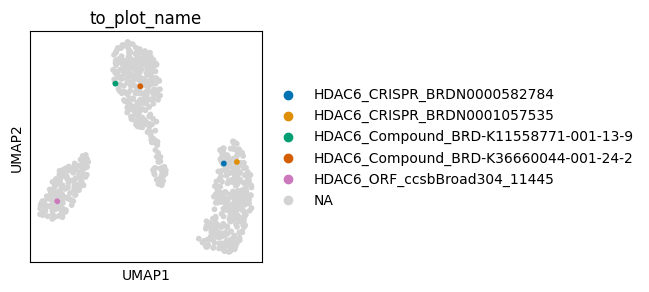

['HIF1A_CRISPR_BRDN0001480888', 'HIF1A_CRISPR_BRDN0001482977', 'HIF1A_Compound_BRD-K44432556-001-05-5', 'HIF1A_Compound_BRD-K70463136-001-01-5', 'HIF1A_ORF_ccsbBroad304_06365']


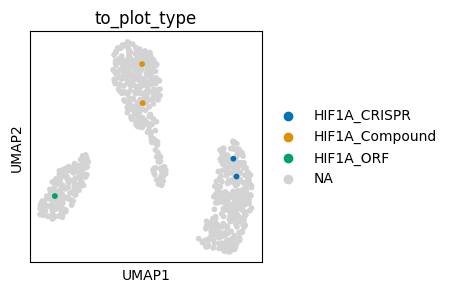

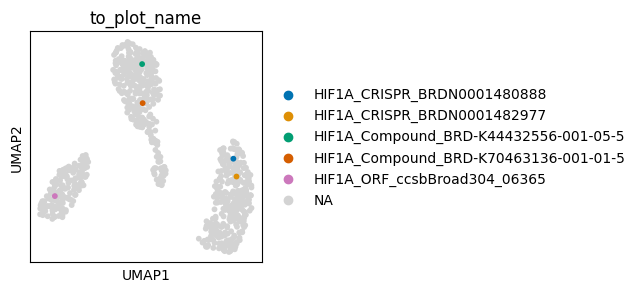

['HPGDS_CRISPR_BRDN0001485605', 'HPGDS_CRISPR_BRDN0001488605', 'HPGDS_Compound_BRD-K17849083-001-32-9', 'HPGDS_Compound_BRD-K57708067-001-01-3', 'HPGDS_ORF_ccsbBroad304_03026']


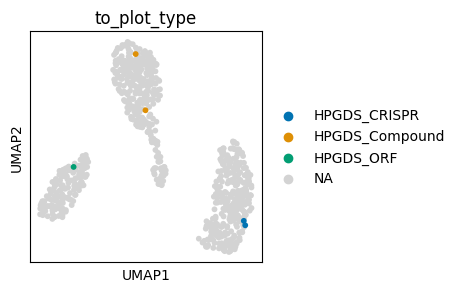

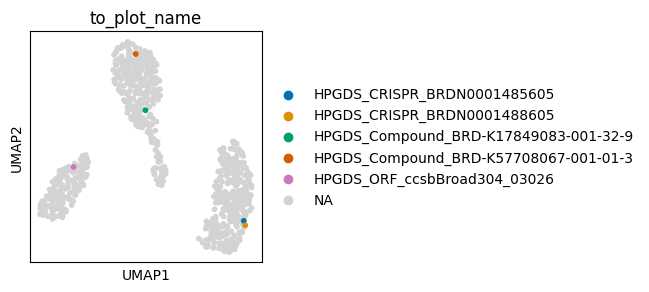

['HRH4_CRISPR_BRDN0001485022', 'HRH4_CRISPR_BRDN0001486748', 'HRH4_Compound_BRD-K70821460-300-02-4', 'HRH4_Compound_BRD-K75390981-300-04-9', 'HRH4_ORF_ccsbBroad304_03876']


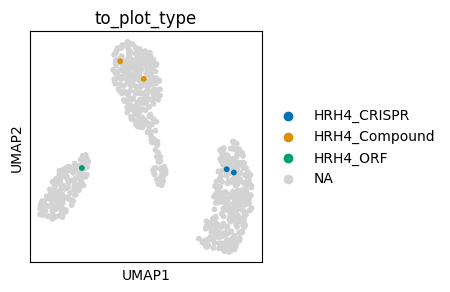

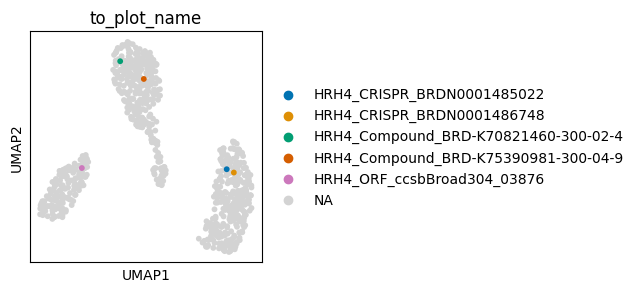

['HSD11B1_CRISPR_BRDN0001484276', 'HSD11B1_CRISPR_BRDN0001488463', 'HSD11B1_Compound_BRD-K18289362-001-02-2', 'HSD11B1_Compound_BRD-K80970344-201-08-6', 'HSD11B1_ORF_ccsbBroad304_06403']


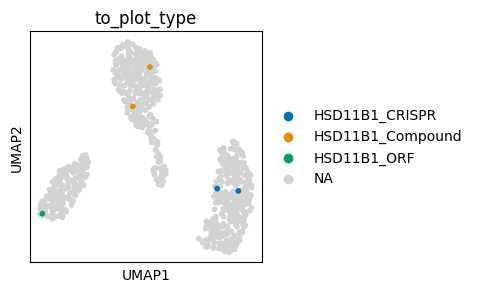

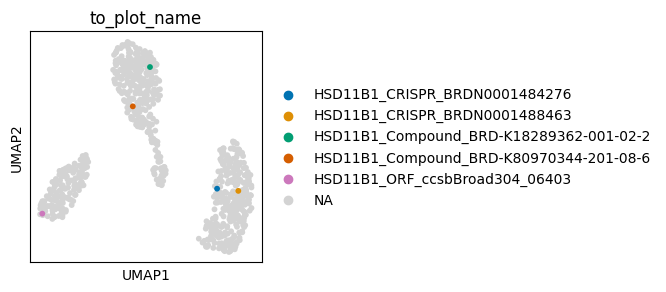

['HSP90AA1_CRISPR_BRDN0001483257', 'HSP90AA1_CRISPR_BRDN0001488886', 'HSP90AA1_Compound_BRD-K38852836-001-04-9', 'HSP90AA1_ORF_ccsbBroad304_06412']


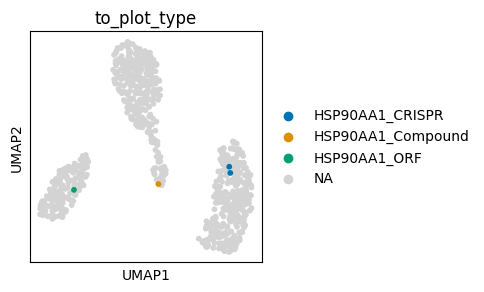

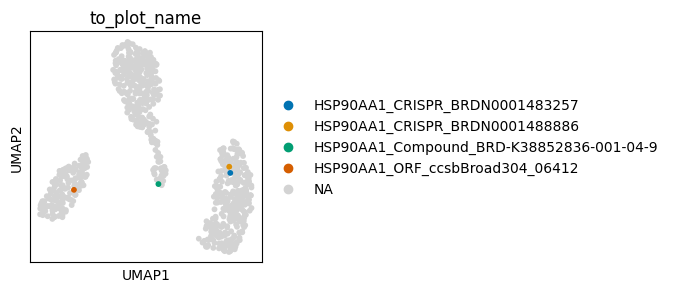

['HSP90AB1_CRISPR_BRDN0001484748', 'HSP90AB1_CRISPR_BRDN0001489575', 'HSP90AB1_Compound_BRD-K43570081-001-02-4', 'HSP90AB1_Compound_BRD-K67915505-001-01-2', 'HSP90AB1_ORF_ccsbBroad304_00799']


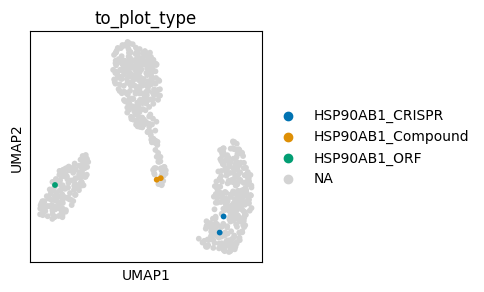

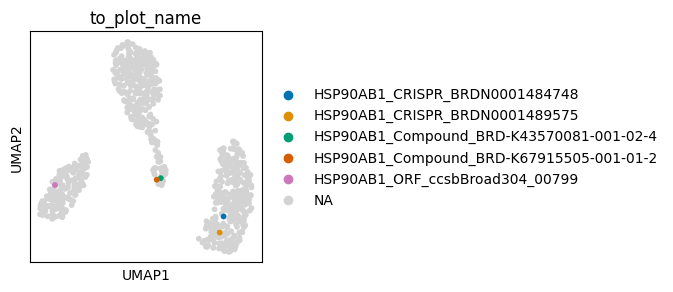

['HTR2C_CRISPR_BRDN0001479324', 'HTR2C_CRISPR_BRDN0001487609', 'HTR2C_Compound_BRD-A99888680-001-05-3', 'HTR2C_Compound_BRD-K70778732-003-27-5', 'HTR2C_ORF_ccsbBroad304_00805']


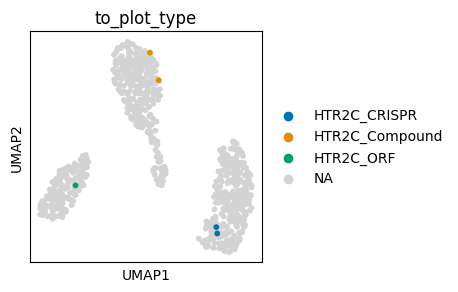

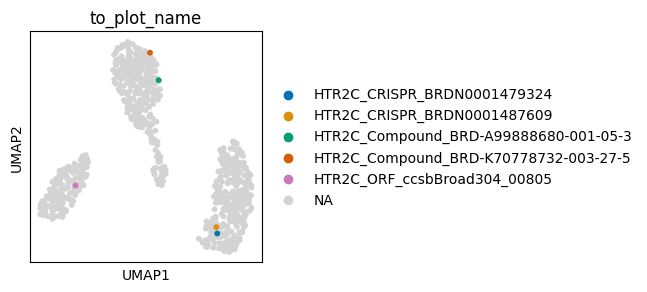

['HTR3A_CRISPR_BRDN0001480865', 'HTR3A_CRISPR_BRDN0001484377', 'HTR3A_Compound_BRD-K24616672-003-20-1', 'HTR3A_Compound_BRD-K70358946-001-17-3', 'HTR3A_ORF_ccsbBroad304_10895']


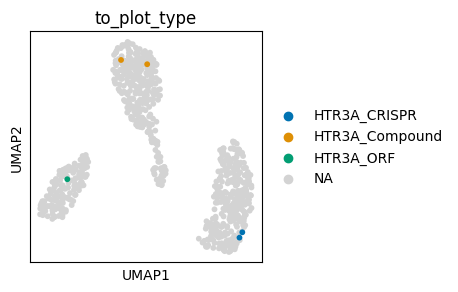

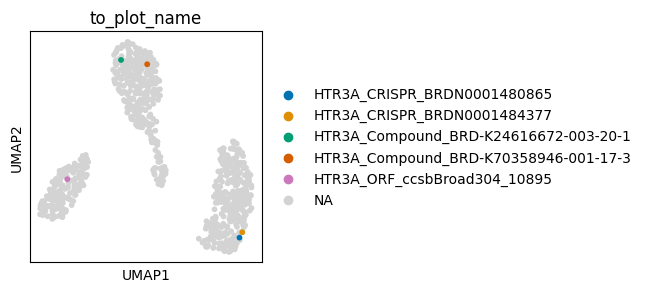

['ICAM1_CRISPR_BRDN0000734459', 'ICAM1_CRISPR_BRDN0000734502', 'ICAM1_Compound_BRD-K43236057-001-07-1', 'ICAM1_Compound_BRD-K77627880-001-04-0', 'ICAM1_ORF_ccsbBroad304_00811']


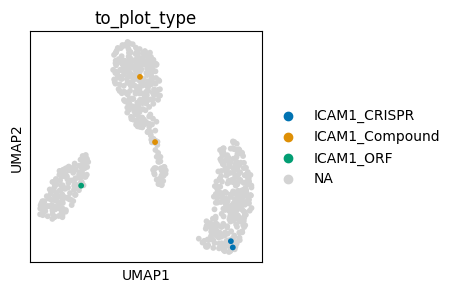

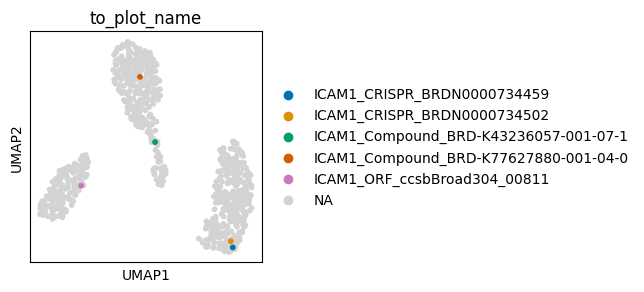

['IGF1R_CRISPR_BRDN0001065728', 'IGF1R_CRISPR_BRDN0001065819', 'IGF1R_Compound_BRD-K15179513-001-04-2', 'IGF1R_Compound_BRD-K24696047-001-02-3', 'IGF1R_ORF_ccsbBroad304_14671']


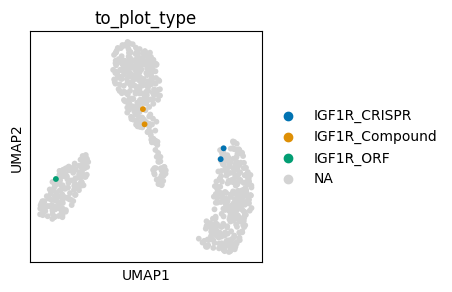

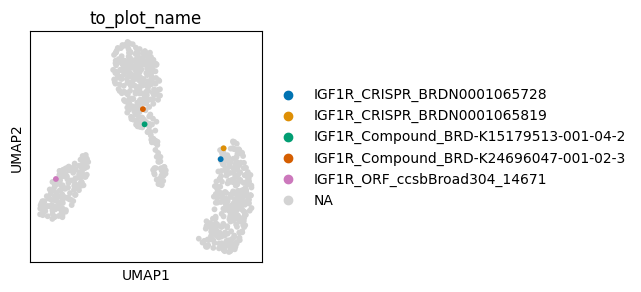

['IL1B_CRISPR_BRDN0001481083', 'IL1B_CRISPR_BRDN0001481686', 'IL1B_Compound_BRD-A69651145-003-11-4', 'IL1B_Compound_BRD-K69122748-001-10-1', 'IL1B_ORF_ccsbBroad304_00843']


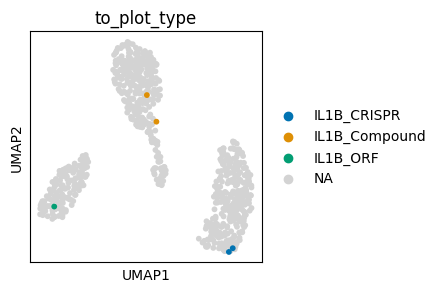

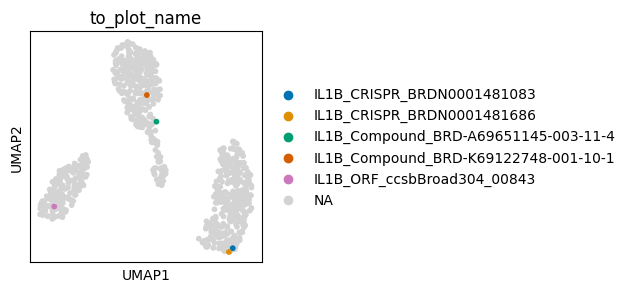

['IMPDH1_CRISPR_BRDN0001488805', 'IMPDH1_CRISPR_BRDN0001489452', 'IMPDH1_Compound_BRD-K49350383-001-13-7', 'IMPDH1_ORF_ccsbBroad304_06451']


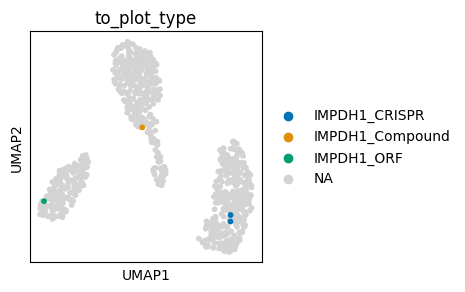

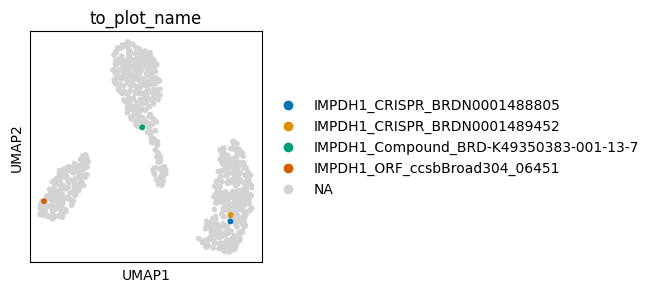

['ITGB2_CRISPR_BRDN0001489066', 'ITGB2_Compound_BRD-K20093108-001-02-3', 'ITGB2_Compound_BRD-K22134346-001-22-3', 'ITGB2_ORF_ccsbBroad304_06464']


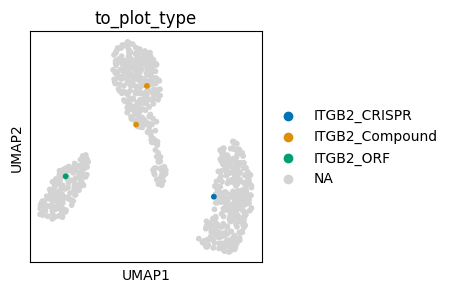

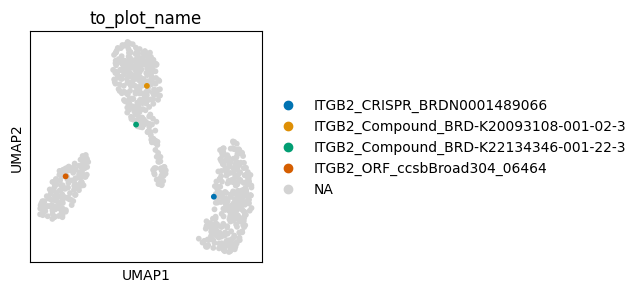

['JAK1_CRISPR_BRDN0001065674', 'JAK1_CRISPR_BRDN0001065858', 'JAK1_Compound_BRD-K16803204-001-01-6', 'JAK1_Compound_BRD-K53972329-001-01-3', 'JAK1_ORF_ccsbBroad304_14679']


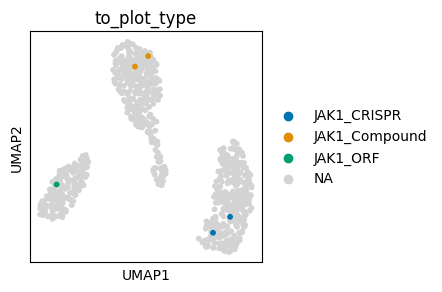

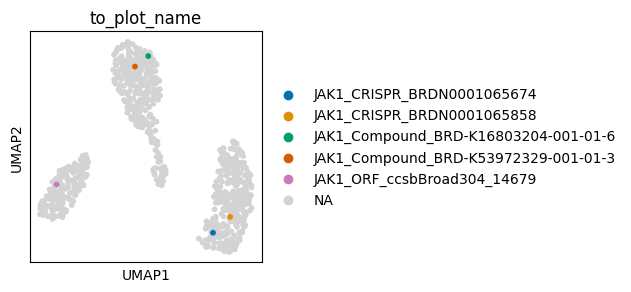

['KCNH7_CRISPR_BRDN0001485309', 'KCNH7_CRISPR_BRDN0001486718', 'KCNH7_Compound_BRD-K01825589-310-02-9', 'KCNH7_Compound_BRD-K22482860-001-20-6', 'KCNH7_ORF_ccsbBroad304_04505']


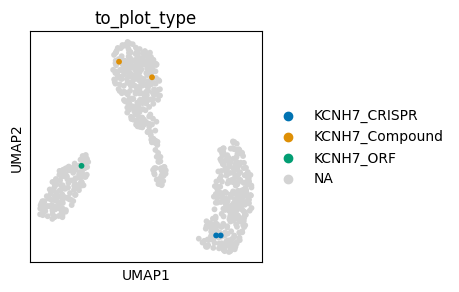

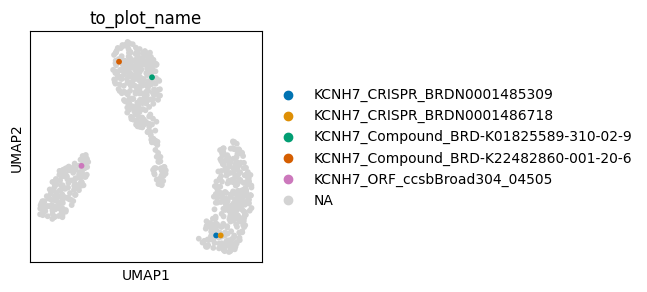

['KCNJ1_CRISPR_BRDN0001484642', 'KCNJ1_CRISPR_BRDN0001485538', 'KCNJ1_Compound_BRD-K52960356-001-13-0', 'KCNJ1_Compound_BRD-K72063794-003-01-0', 'KCNJ1_ORF_ccsbBroad304_00894']


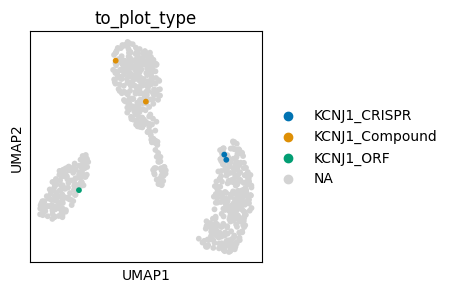

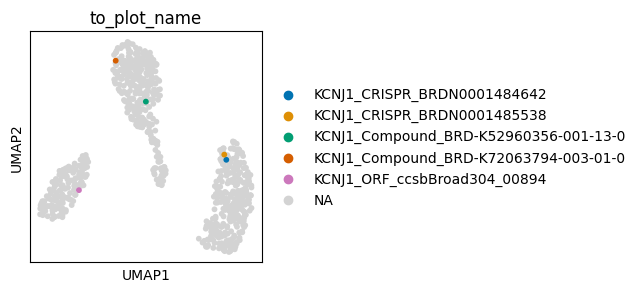

['KCNK1_CRISPR_BRDN0001480346', 'KCNK1_CRISPR_BRDN0001483666', 'KCNK1_Compound_BRD-A74391928-051-03-9', 'KCNK1_Compound_BRD-K59632282-052-03-1', 'KCNK1_ORF_ccsbBroad304_06483']


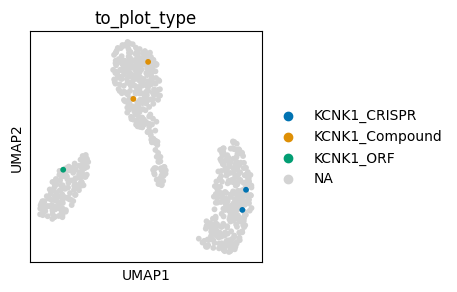

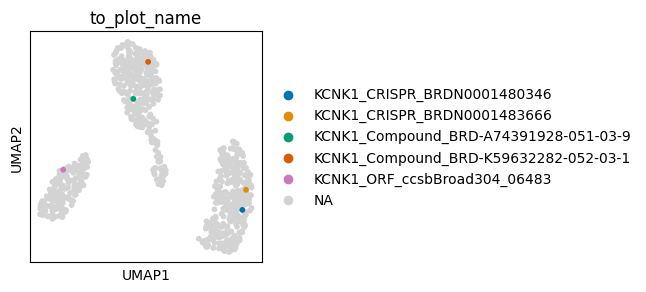

['KCNMA1_CRISPR_BRDN0001481237', 'KCNMA1_CRISPR_BRDN0001484752', 'KCNMA1_Compound_BRD-K56740996-001-02-1', 'KCNMA1_Compound_BRD-K94342292-001-01-3', 'KCNMA1_ORF_ccsbBroad304_10934']


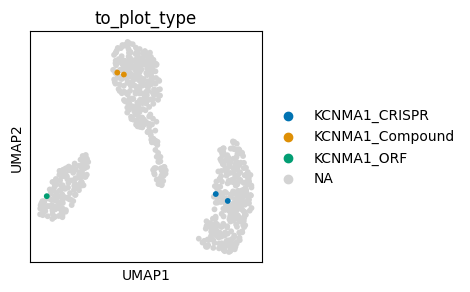

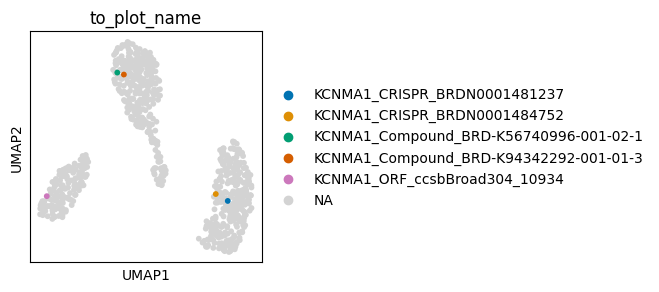

['KCNN1_CRISPR_BRDN0001485421', 'KCNN1_CRISPR_BRDN0001485843', 'KCNN1_Compound_BRD-A82396632-008-30-8', 'KCNN1_Compound_BRD-K70586315-001-02-4', 'KCNN1_ORF_ccsbBroad304_00900']


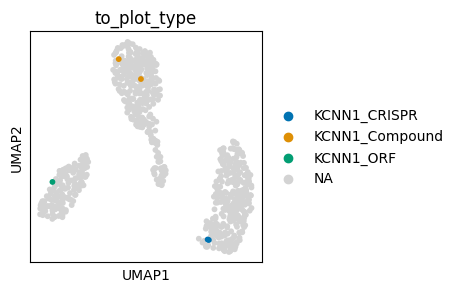

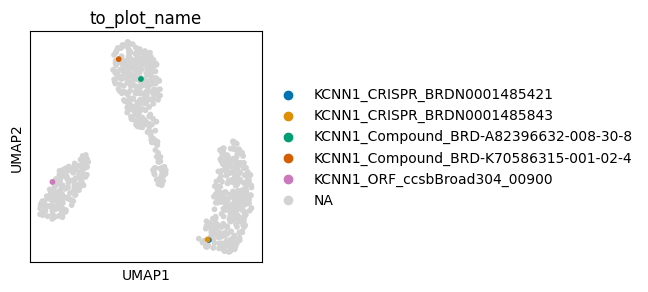

['KCNN4_CRISPR_BRDN0001481331', 'KCNN4_CRISPR_BRDN0001481651', 'KCNN4_Compound_BRD-K37602296-001-01-6', 'KCNN4_Compound_BRD-K48278478-001-01-2', 'KCNN4_ORF_ccsbBroad304_00902']


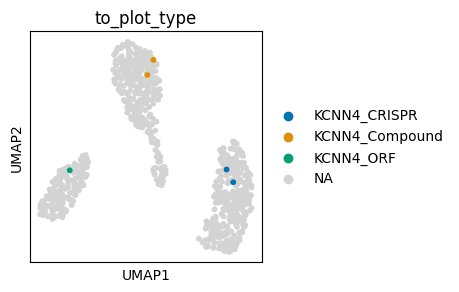

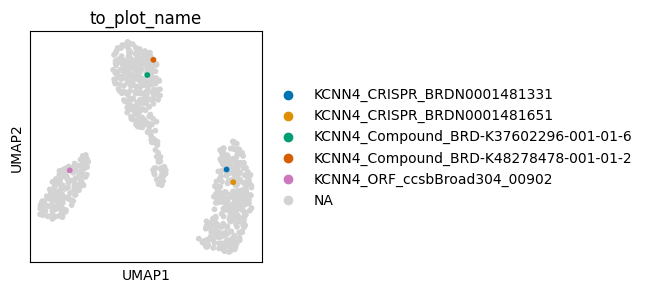

['KCNQ2_CRISPR_BRDN0001483003', 'KCNQ2_CRISPR_BRDN0001489498', 'KCNQ2_Compound_BRD-K50398167-236-22-7', 'KCNQ2_Compound_BRD-K50720187-051-03-1', 'KCNQ2_ORF_ccsbBroad304_00904']


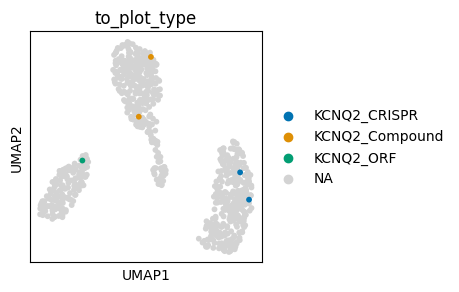

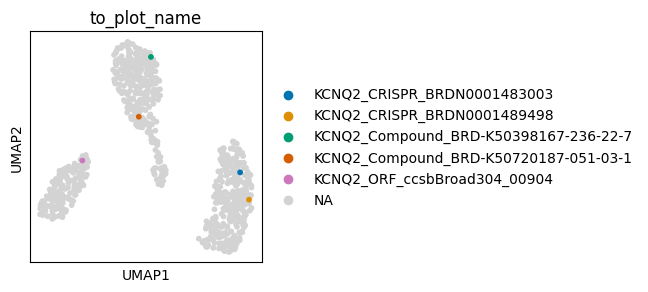

['KCTD16_CRISPR_BRDN0001484319', 'KCTD16_CRISPR_BRDN0001489555', 'KCTD16_Compound_BRD-A24122750-001-03-7', 'KCTD16_Compound_BRD-K01826724-003-07-9', 'KCTD16_ORF_ccsbBroad304_03827']


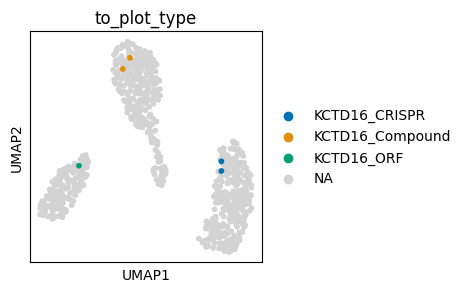

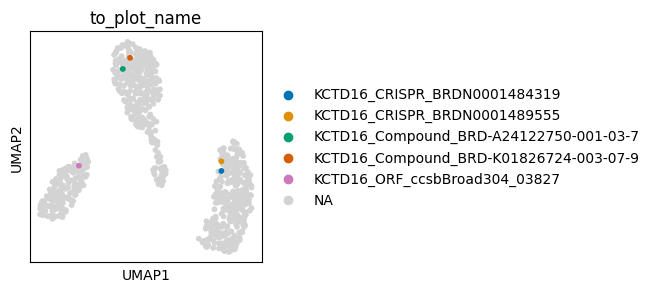

['KDR_CRISPR_BRDN0001144938', 'KDR_CRISPR_BRDN0001146819', 'KDR_Compound_BRD-K29895144-001-01-0', 'KDR_Compound_BRD-K99616396-316-05-3', 'KDR_ORF_ccsbBroad304_14684']


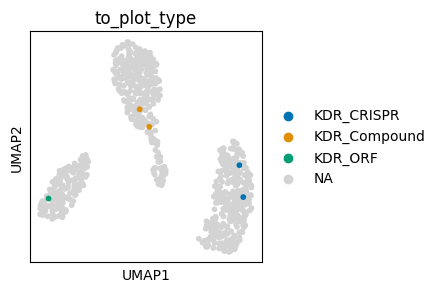

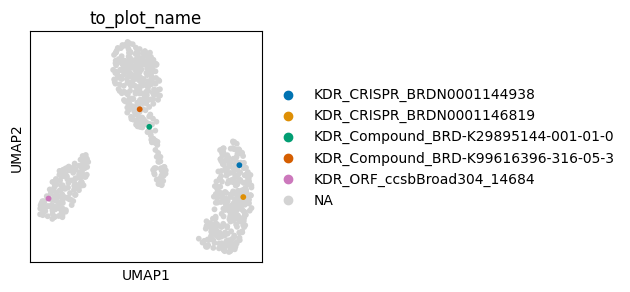

['KRAS_CRISPR_BRDN0000563627', 'KRAS_CRISPR_BRDN0001054815', 'KRAS_Compound_BRD-K41599323-001-02-3', 'KRAS_ORF_ccsbBroad304_16173']


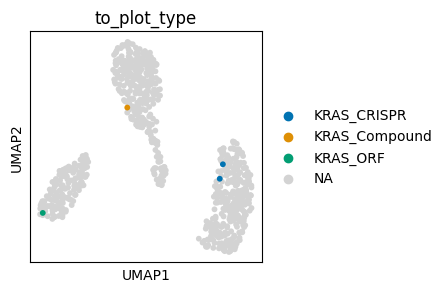

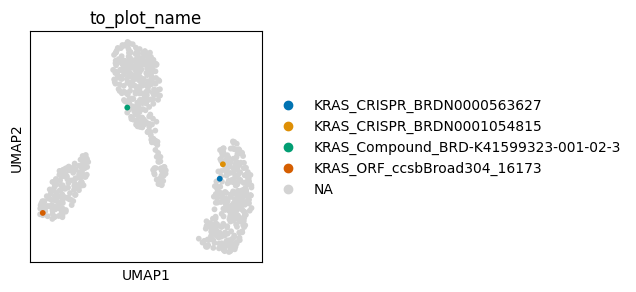

['LCK_CRISPR_BRDN0001145503', 'LCK_CRISPR_BRDN0001145758', 'LCK_Compound_BRD-K34581968-001-05-3', 'LCK_Compound_BRD-K50199947-001-03-4', 'LCK_ORF_ccsbBroad304_14688']


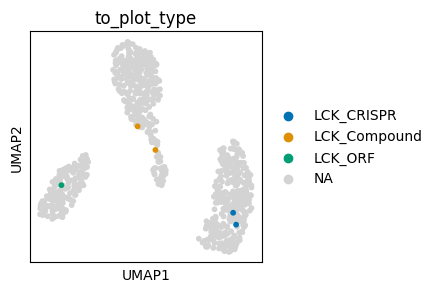

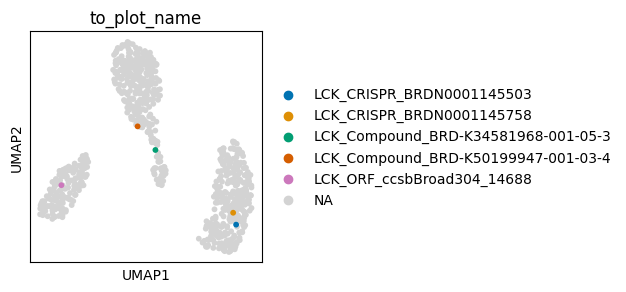

['LPAR1_CRISPR_BRDN0001483194', 'LPAR1_CRISPR_BRDN0001487712', 'LPAR1_Compound_BRD-A25569250-001-03-3', 'LPAR1_Compound_BRD-K26439554-001-01-3', 'LPAR1_ORF_ccsbBroad304_00477']


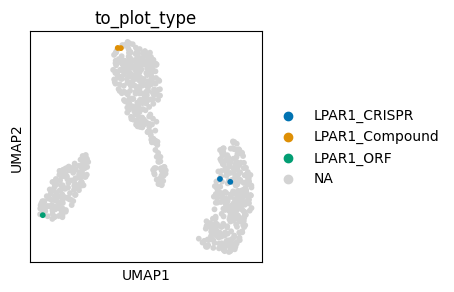

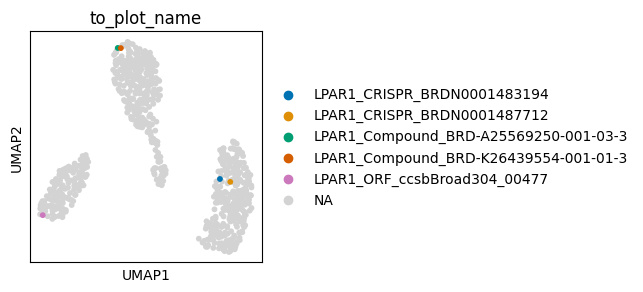

['LYN_CRISPR_BRDN0001145318', 'LYN_Compound_BRD-K44227013-001-08-0', 'LYN_Compound_BRD-K95785537-001-22-3', 'LYN_ORF_ccsbBroad304_00954']


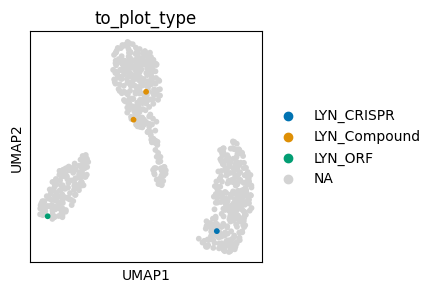

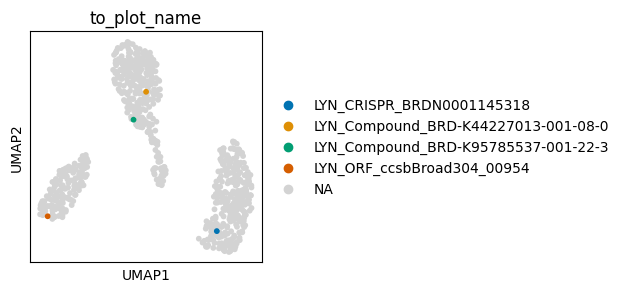

['MAPK14_CRISPR_BRDN0001148417', 'MAPK14_Compound_BRD-A37704979-001-12-3', 'MAPK14_Compound_BRD-K54330070-001-19-6', 'MAPK14_ORF_ccsbBroad304_00371']


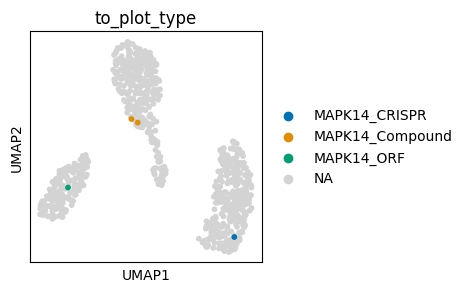

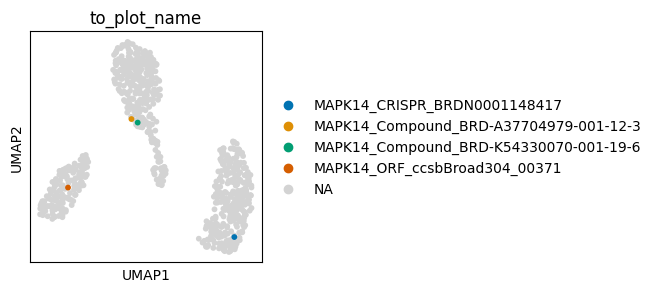

['MAPK8_CRISPR_BRDN0001065244', 'MAPK8_CRISPR_BRDN0001065508', 'MAPK8_Compound_BRD-K32730239-001-01-0', 'MAPK8_Compound_BRD-K45746021-003-01-9', 'MAPK8_ORF_ccsbBroad304_01287']


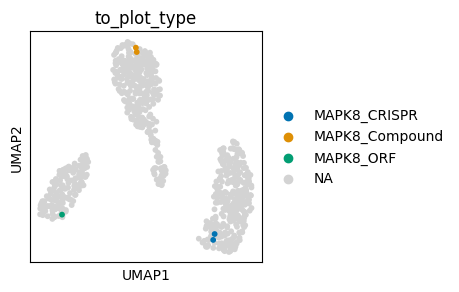

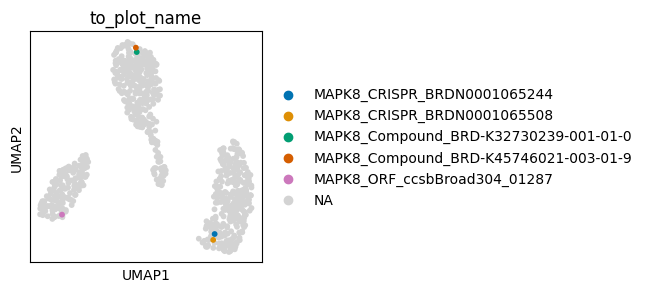

['MET_CRISPR_BRDN0000734703', 'MET_CRISPR_BRDN0001065558', 'MET_Compound_BRD-K19477839-001-07-6', 'MET_Compound_BRD-K73319509-001-08-0', 'MET_ORF_ccsbBroad304_14696']


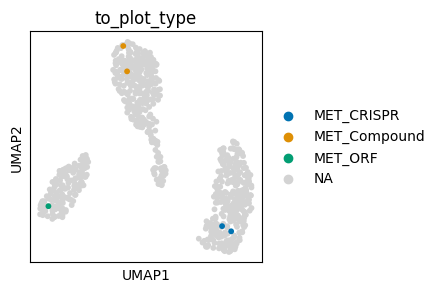

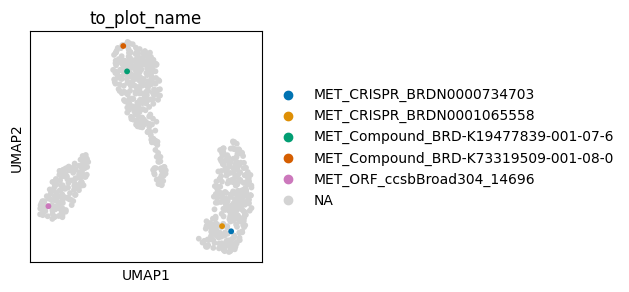

['MME_CRISPR_BRDN0001484783', 'MME_CRISPR_BRDN0001488696', 'MME_Compound_BRD-A08187463-001-12-9', 'MME_Compound_BRD-K91456750-001-01-9', 'MME_ORF_ccsbBroad304_01020']


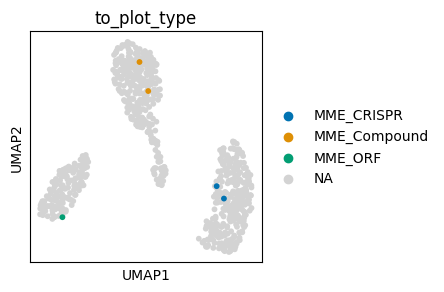

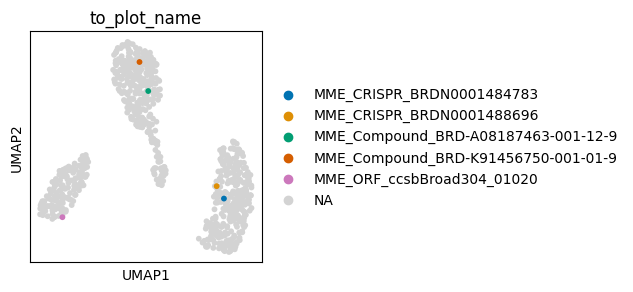

['MMP2_CRISPR_BRDN0001480861', 'MMP2_CRISPR_BRDN0001485794', 'MMP2_Compound_BRD-K51662849-001-05-4', 'MMP2_Compound_BRD-K82818427-001-04-8', 'MMP2_ORF_ccsbBroad304_06588']


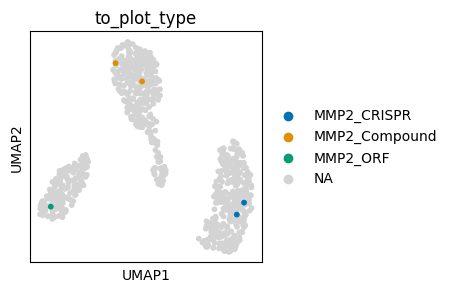

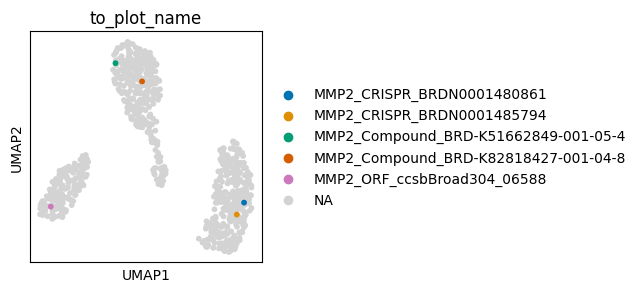

['NAMPT_CRISPR_BRDN0001481327', 'NAMPT_CRISPR_BRDN0001484730', 'NAMPT_Compound_BRD-K58550667-001-08-7', 'NAMPT_ORF_ccsbBroad304_07557']


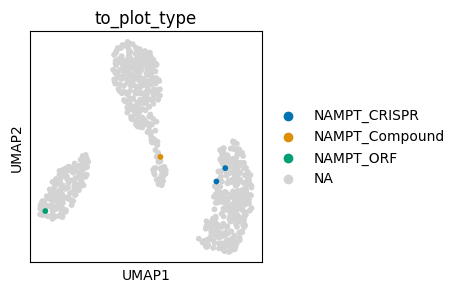

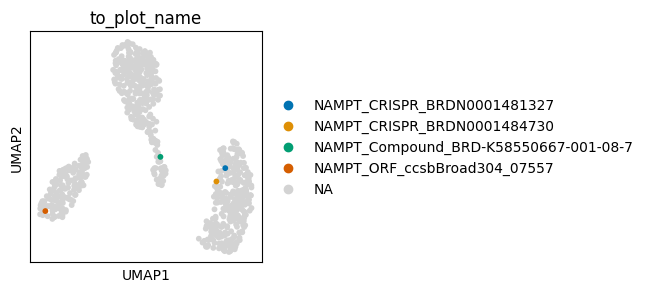

['NTRK1_CRISPR_BRDN0001148112', 'NTRK1_Compound_BRD-K19975102-001-01-2', 'NTRK1_Compound_BRD-K36574127-001-01-3', 'NTRK1_ORF_ccsbBroad304_14720']


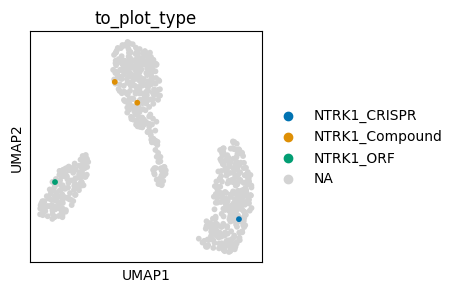

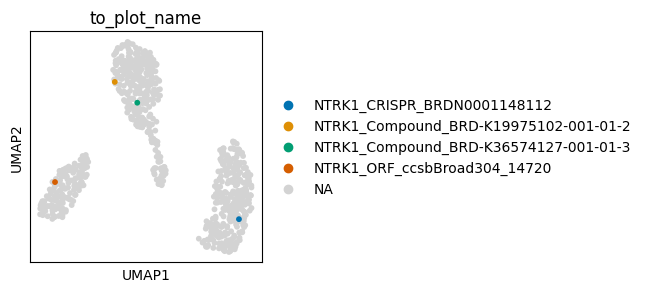

['OPRL1_CRISPR_BRDN0001488387', 'OPRL1_CRISPR_BRDN0001490272', 'OPRL1_Compound_BRD-K47049295-300-03-1', 'OPRL1_Compound_BRD-K73276278-305-01-1', 'OPRL1_ORF_ccsbBroad304_01121']


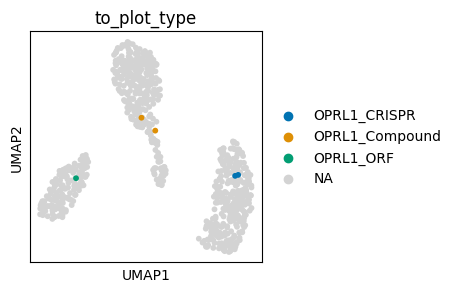

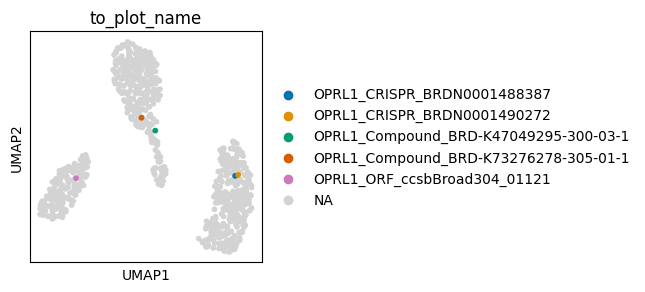

['OPRM1_CRISPR_BRDN0001487618', 'OPRM1_Compound_BRD-A72767275-003-01-6', 'OPRM1_Compound_BRD-K61250553-003-30-6', 'OPRM1_ORF_ccsbBroad304_01122']


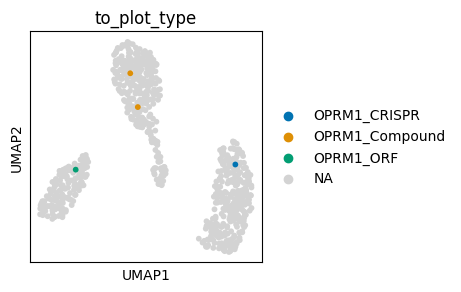

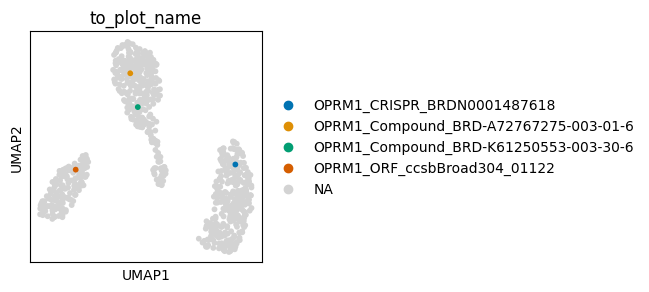

['P2RY12_CRISPR_BRDN0001481136', 'P2RY12_CRISPR_BRDN0001481609', 'P2RY12_Compound_BRD-A83029242-001-06-1', 'P2RY12_Compound_BRD-K77060810-001-01-5', 'P2RY12_ORF_ccsbBroad304_08873']


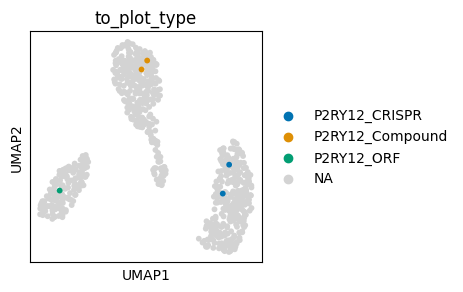

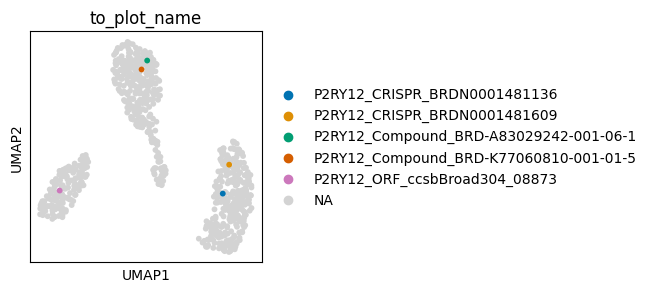

['PAK1_CRISPR_BRDN0001145958', 'PAK1_CRISPR_BRDN0001147867', 'PAK1_Compound_BRD-K19333160-001-01-3', 'PAK1_Compound_BRD-K28132190-001-02-0', 'PAK1_ORF_ccsbBroad304_01144']


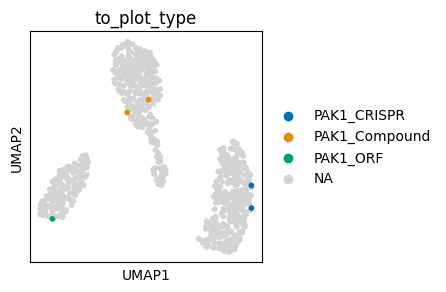

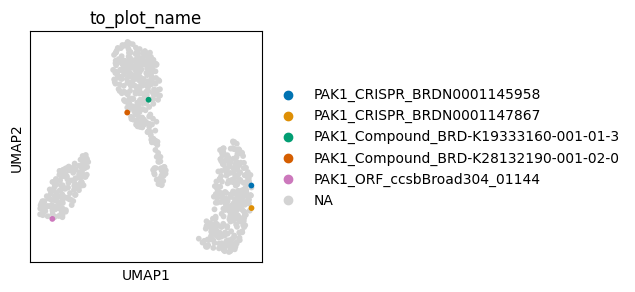

['PAK4_CRISPR_BRDN0001145608', 'PAK4_CRISPR_BRDN0001147629', 'PAK4_Compound_BRD-K37764012-001-03-3', 'PAK4_ORF_ccsbBroad304_02392']


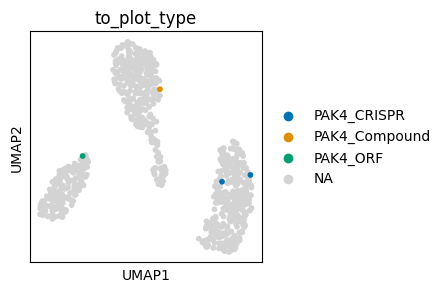

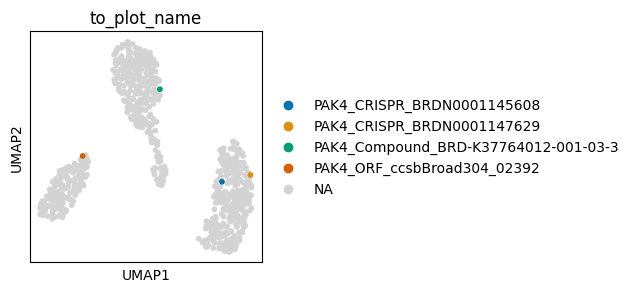

['PARP3_CRISPR_BRDN0001480092', 'PARP3_CRISPR_BRDN0001484654', 'PARP3_Compound_BRD-A63444178-001-01-5', 'PARP3_Compound_BRD-K24283677-001-01-9', 'PARP3_ORF_ccsbBroad304_07535']


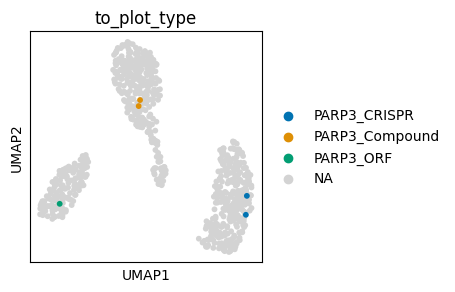

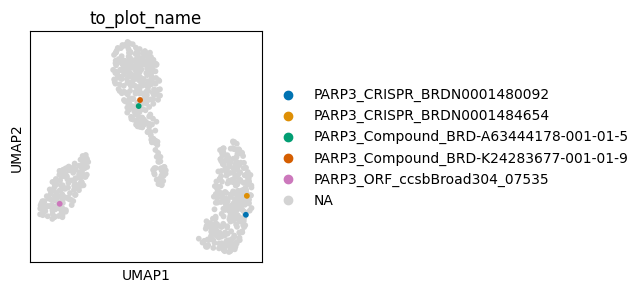

['PDE3A_CRISPR_BRDN0001054361', 'PDE3A_CRISPR_BRDN0001054403', 'PDE3A_Compound_BRD-A07207424-001-14-0', 'PDE3A_Compound_BRD-K67017579-001-28-1', 'PDE3A_ORF_ccsbBroad304_06701']


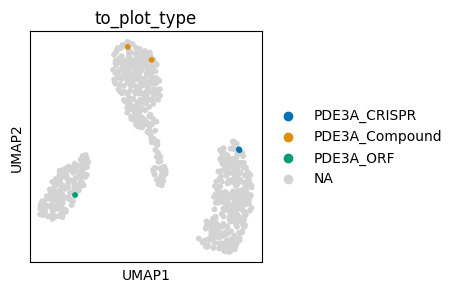

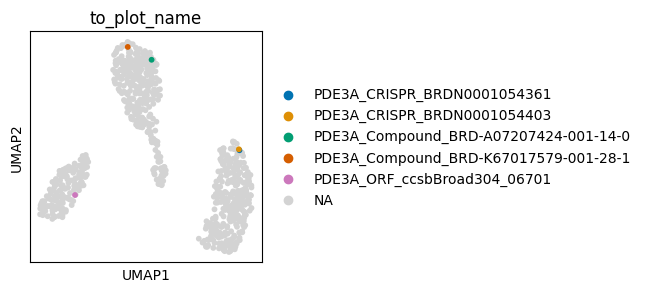

['PDE4D_CRISPR_BRDN0000563501', 'PDE4D_CRISPR_BRDN0000563722', 'PDE4D_Compound_BRD-K16444452-001-09-1', 'PDE4D_Compound_BRD-K16542329-001-16-8', 'PDE4D_ORF_ccsbBroad304_11023']


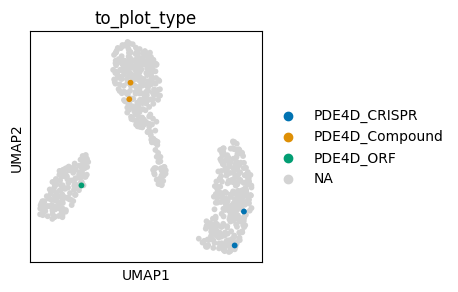

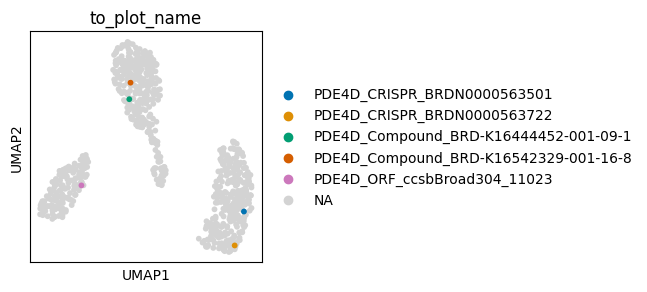

['PDE7A_CRISPR_BRDN0001480242', 'PDE7A_CRISPR_BRDN0001487280', 'PDE7A_Compound_BRD-A00827783-001-24-6', 'PDE7A_Compound_BRD-K84266862-001-03-2', 'PDE7A_ORF_ccsbBroad304_01161']


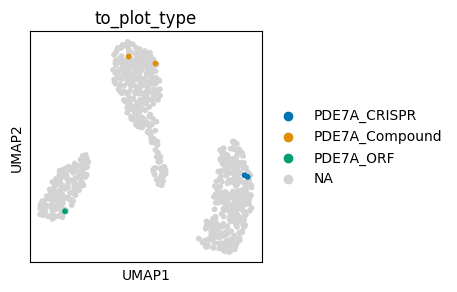

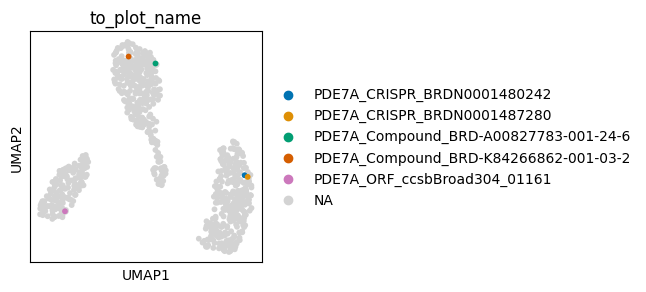

['PDPK1_CRISPR_BRDN0001145239', 'PDPK1_CRISPR_BRDN0001162582', 'PDPK1_Compound_BRD-K45293975-001-02-0', 'PDPK1_Compound_BRD-K90497590-001-05-9', 'PDPK1_ORF_ccsbBroad304_14741']


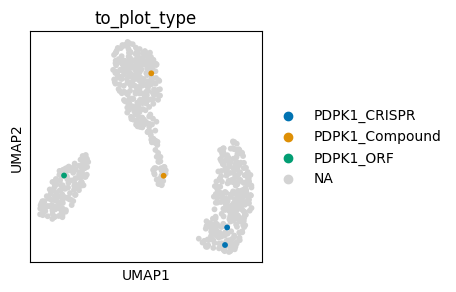

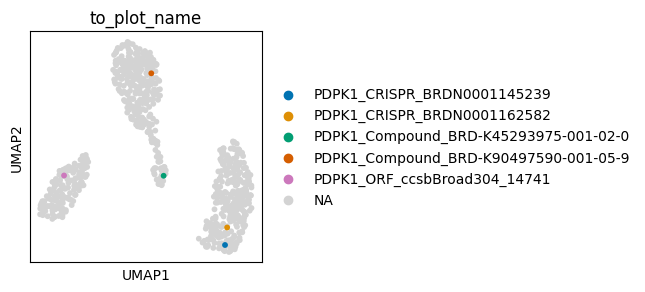

['PIK3CG_CRISPR_BRDN0001065152', 'PIK3CG_CRISPR_BRDN0001065162', 'PIK3CG_Compound_BRD-K42191735-001-08-7', 'PIK3CG_ORF_ccsbBroad304_14762']


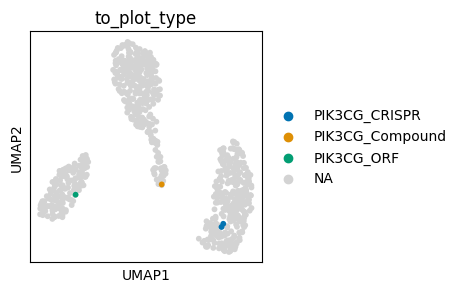

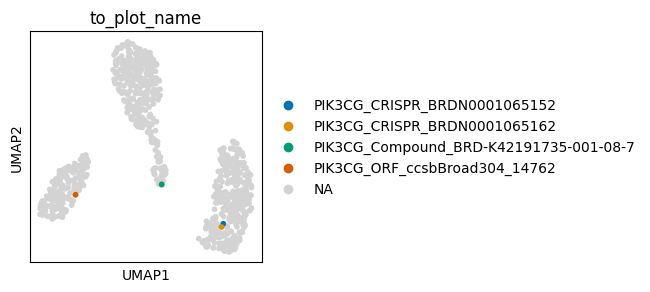

['PLA2G1B_CRISPR_BRDN0001487270', 'PLA2G1B_CRISPR_BRDN0001487520', 'PLA2G1B_Compound_BRD-K10670311-001-17-1', 'PLA2G1B_Compound_BRD-K21528677-001-04-4', 'PLA2G1B_ORF_ccsbBroad304_01213']


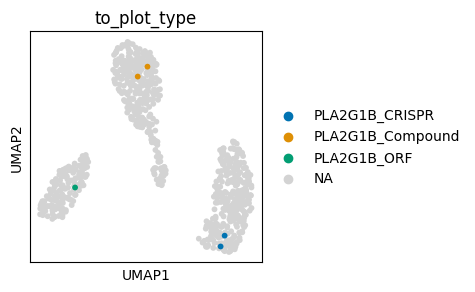

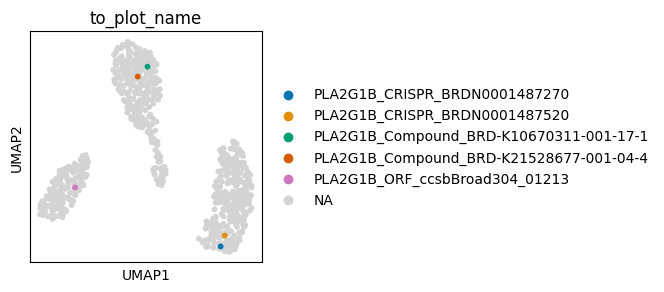

['PLD1_CRISPR_BRDN0001065841', 'PLD1_Compound_BRD-K04210847-001-21-9', 'PLD1_Compound_BRD-K50055394-001-03-6', 'PLD1_ORF_ccsbBroad304_01216']


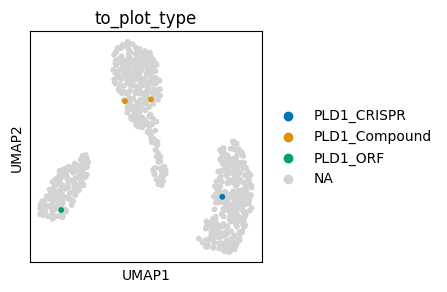

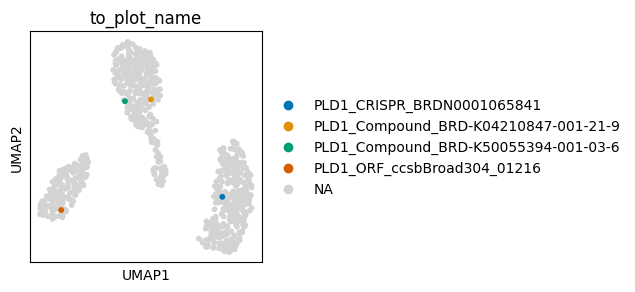

['PLK1_CRISPR_BRDN0001054037', 'PLK1_CRISPR_BRDN0001144995', 'PLK1_Compound_BRD-K64890080-001-02-1', 'PLK1_ORF_ccsbBroad304_14770']


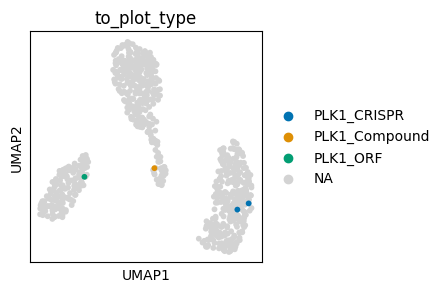

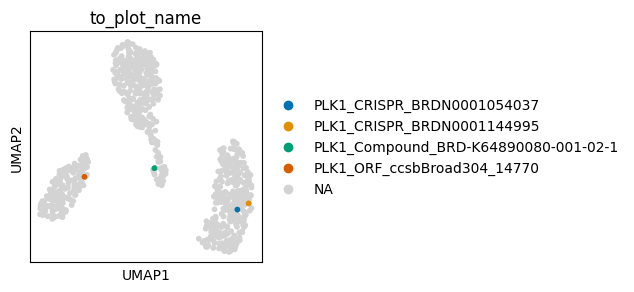

['PNLIP_CRISPR_BRDN0001480930', 'PNLIP_CRISPR_BRDN0001484506', 'PNLIP_Compound_BRD-K30177383-001-01-0', 'PNLIP_Compound_BRD-K94863486-001-02-2', 'PNLIP_ORF_ccsbBroad304_01230']


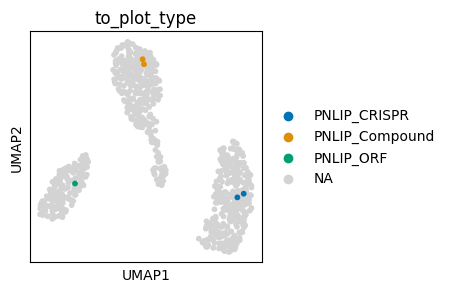

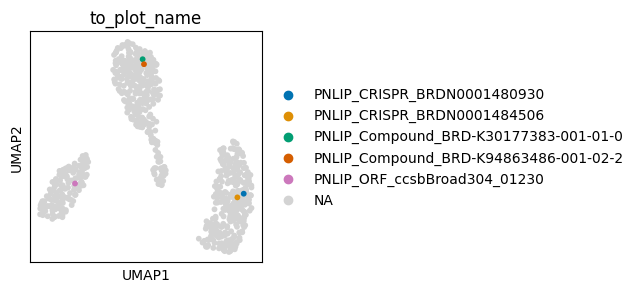

['PORCN_CRISPR_BRDN0001065257', 'PORCN_CRISPR_BRDN0001065258', 'PORCN_Compound_BRD-K16810791-001-01-0', 'PORCN_Compound_BRD-K53234107-001-01-6', 'PORCN_ORF_ccsbBroad304_03976']


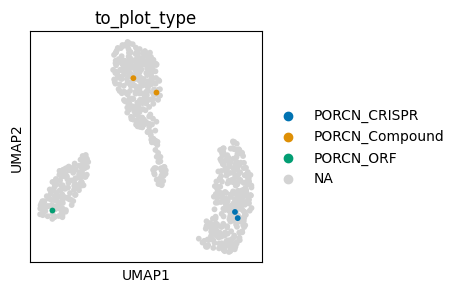

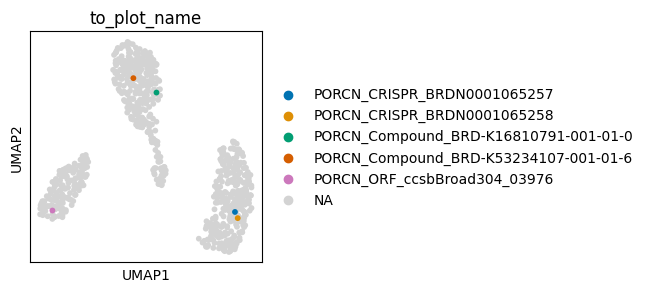

['PPARD_CRISPR_BRDN0001065000', 'PPARD_CRISPR_BRDN0001065187', 'PPARD_Compound_BRD-K03155172-001-03-0', 'PPARD_Compound_BRD-K75748943-300-01-3', 'PPARD_ORF_ccsbBroad304_06754']


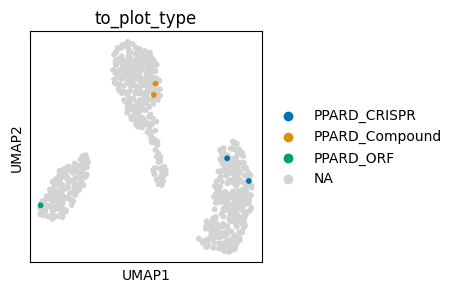

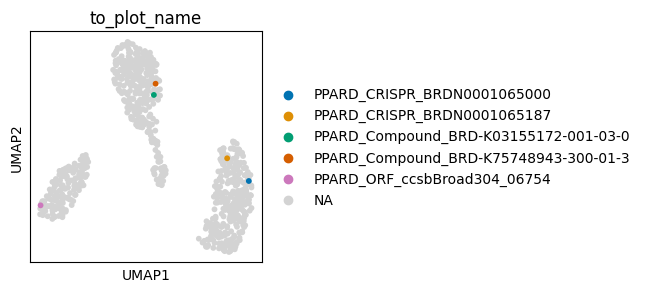

['PPAT_CRISPR_BRDN0001481315', 'PPAT_CRISPR_BRDN0001490325', 'PPAT_Compound_BRD-K32821942-001-22-1', 'PPAT_Compound_BRD-K83896451-001-06-7', 'PPAT_ORF_ccsbBroad304_06755']


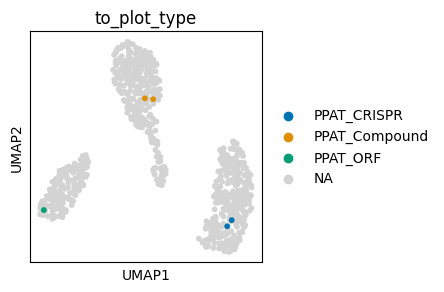

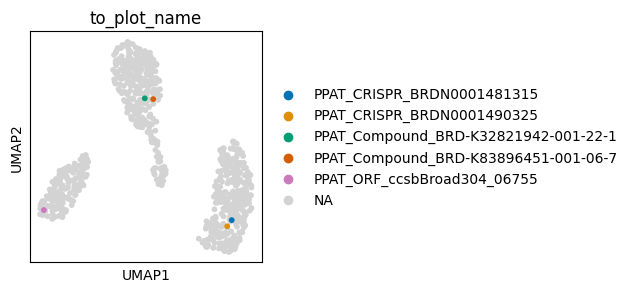

['PRKCB_CRISPR_BRDN0001144990', 'PRKCB_CRISPR_BRDN0001148507', 'PRKCB_Compound_BRD-K32292990-001-03-6', 'PRKCB_Compound_BRD-K97091514-001-11-4', 'PRKCB_ORF_ccsbBroad304_01282']


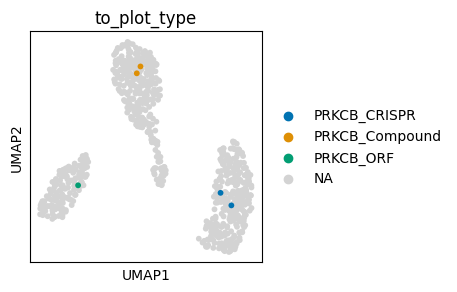

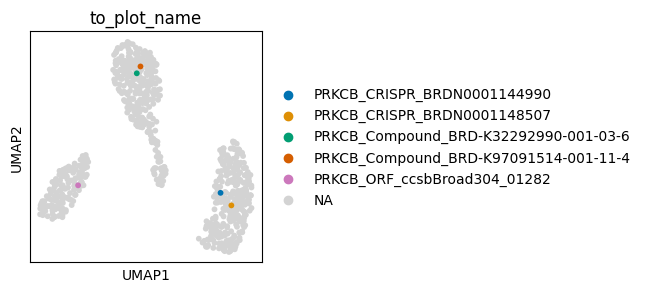

['PRKCE_CRISPR_BRDN0001483295', 'PRKCE_CRISPR_BRDN0001488321', 'PRKCE_Compound_BRD-K16761703-001-03-8', 'PRKCE_Compound_BRD-K93779381-001-01-9', 'PRKCE_ORF_ccsbBroad304_01283']


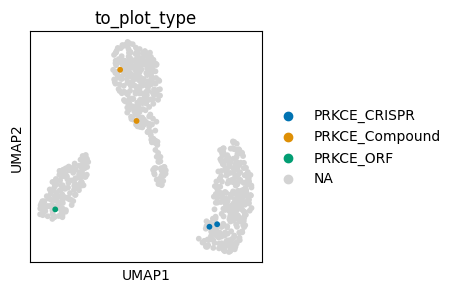

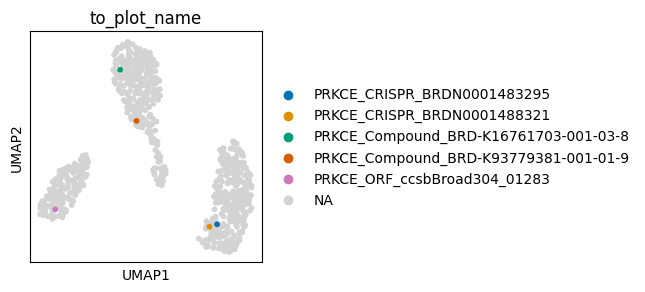

['PTGIR_CRISPR_BRDN0000732963', 'PTGIR_CRISPR_BRDN0000732970', 'PTGIR_Compound_BRD-A72351335-001-04-5', 'PTGIR_Compound_BRD-K77220725-003-01-5', 'PTGIR_ORF_ccsbBroad304_06811']


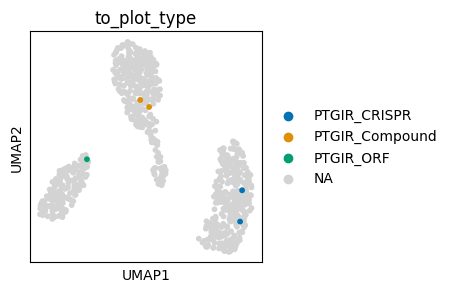

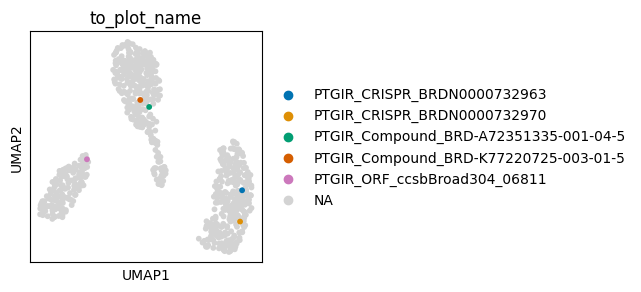

['PTGIS_CRISPR_BRDN0001487205', 'PTGIS_CRISPR_BRDN0001489053', 'PTGIS_Compound_BRD-K10843433-001-23-5', 'PTGIS_Compound_BRD-K64054020-001-02-7', 'PTGIS_ORF_ccsbBroad304_01334']


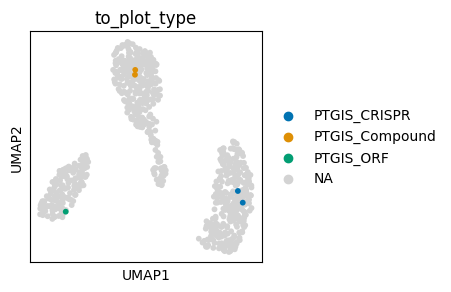

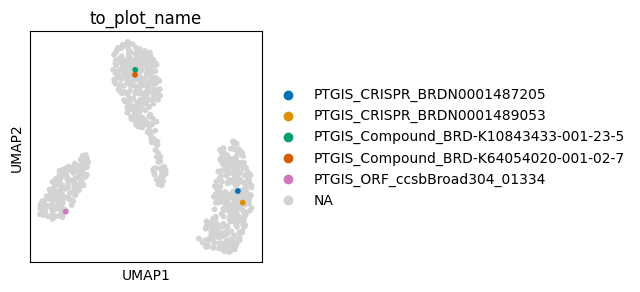

['PTK2B_CRISPR_BRDN0001052307', 'PTK2B_CRISPR_BRDN0001148298', 'PTK2B_Compound_BRD-K78692225-001-24-5', 'PTK2B_Compound_BRD-K93788137-001-04-1', 'PTK2B_ORF_ccsbBroad304_14635']


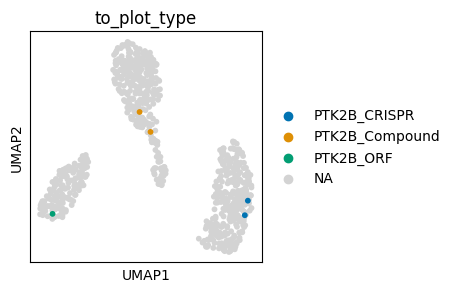

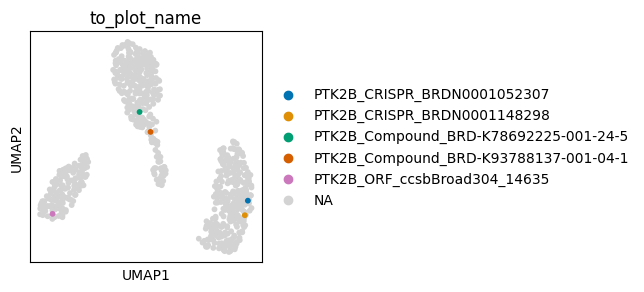

['PTPN2_CRISPR_BRDN0001488235', 'PTPN2_CRISPR_BRDN0001488751', 'PTPN2_Compound_BRD-A22713669-001-04-3', 'PTPN2_Compound_BRD-K68567222-001-01-2', 'PTPN2_ORF_ccsbBroad304_01340']


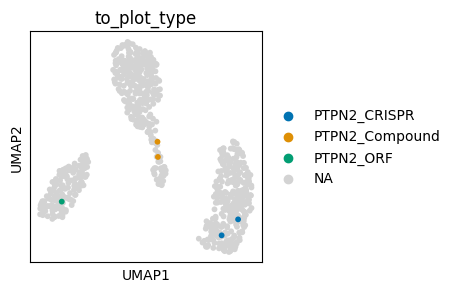

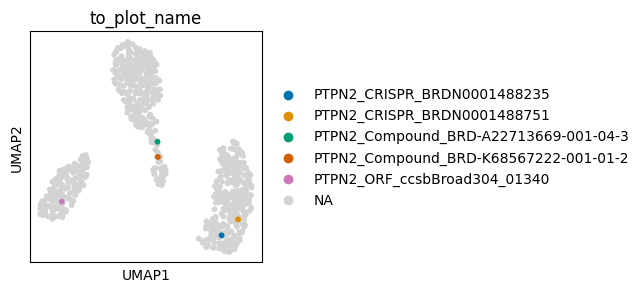

['RET_CRISPR_BRDN0001058011', 'RET_CRISPR_BRDN0001058343', 'RET_Compound_BRD-K07881437-001-03-8', 'RET_ORF_ccsbBroad304_14827']


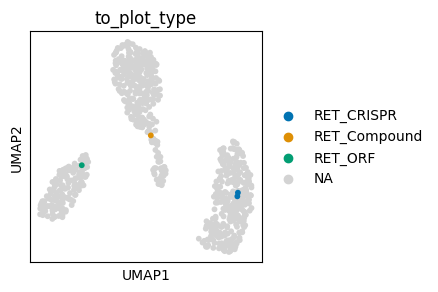

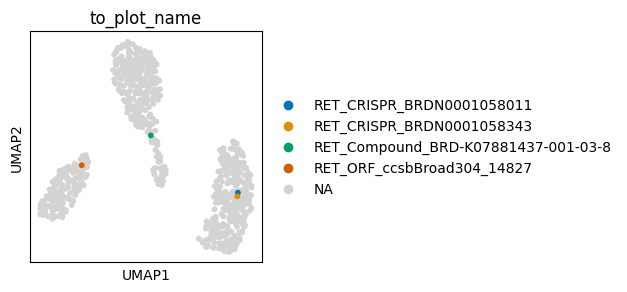

['RGS4_CRISPR_BRDN0001484786', 'RGS4_CRISPR_BRDN0001489262', 'RGS4_Compound_BRD-K08893438-001-06-4', 'RGS4_Compound_BRD-K26970495-001-02-7', 'RGS4_ORF_ccsbBroad304_01396']


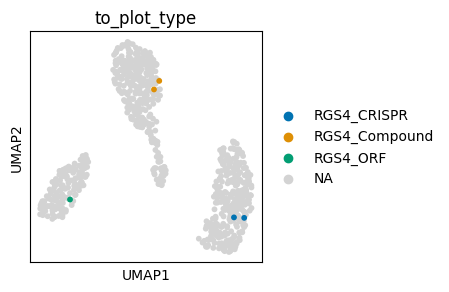

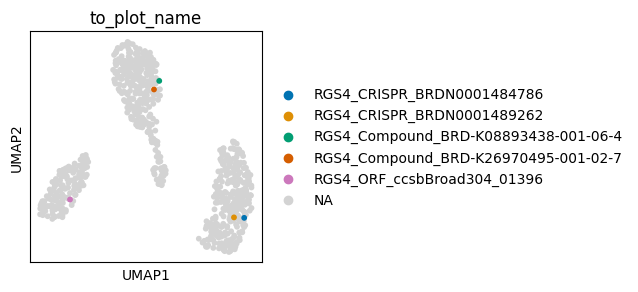

['RNASE1_CRISPR_BRDN0001478949', 'RNASE1_CRISPR_BRDN0001479698', 'RNASE1_Compound_BRD-K76037122-001-02-5', 'RNASE1_Compound_BRD-K76792669-001-08-1', 'RNASE1_ORF_ccsbBroad304_01404']


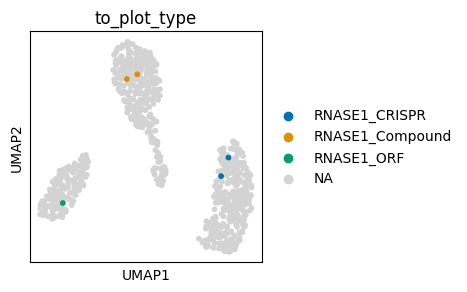

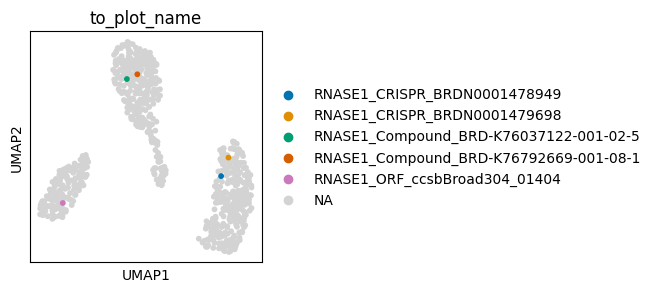

['RPL23A_CRISPR_BRDN0001481176', 'RPL23A_CRISPR_BRDN0001484348', 'RPL23A_Compound_BRD-K01824976-300-02-9', 'RPL23A_Compound_BRD-K91370081-001-25-1', 'RPL23A_ORF_ccsbBroad304_06884']


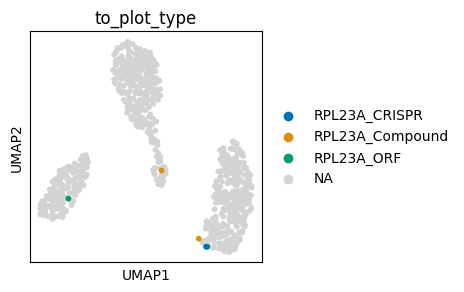

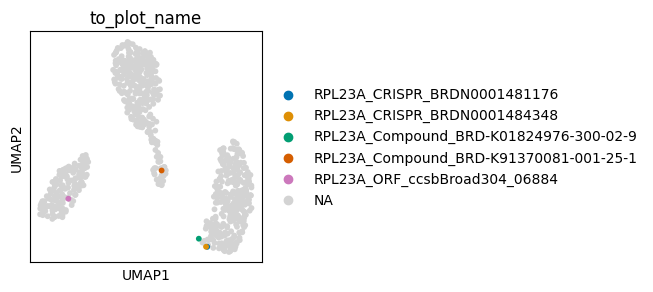

['RPL3_CRISPR_BRDN0001484416', 'RPL3_Compound_BRD-K36055864-001-20-0', 'RPL3_Compound_BRD-K76674262-001-03-3', 'RPL3_ORF_ccsbBroad304_06874']


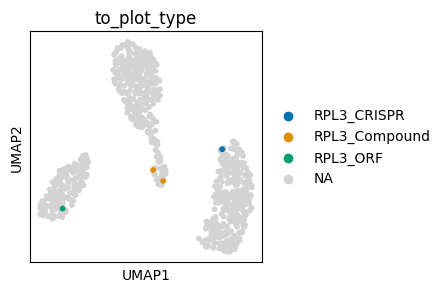

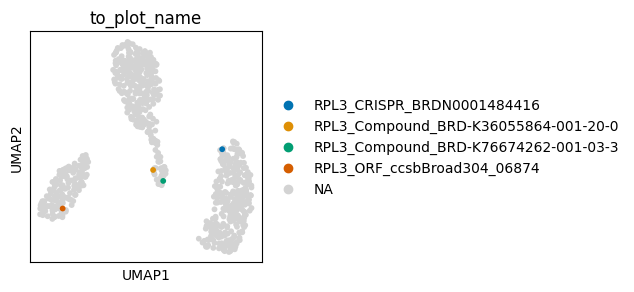

['S100B_CRISPR_BRDN0001480426', 'S100B_CRISPR_BRDN0001480465', 'S100B_Compound_BRD-K49223707-001-01-0', 'S100B_Compound_BRD-K67637637-003-11-8', 'S100B_ORF_ccsbBroad304_06908']


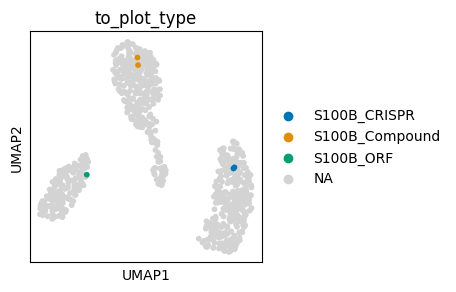

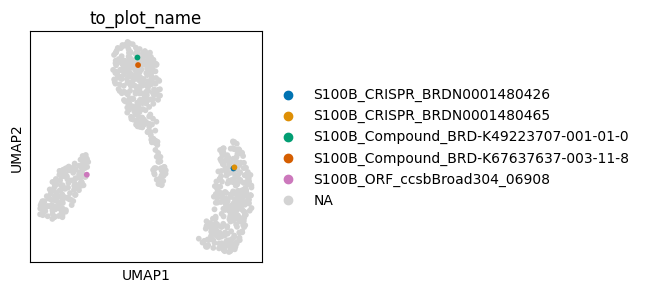

['S1PR1_CRISPR_BRDN0001487864', 'S1PR1_Compound_BRD-A43005764-003-01-5', 'S1PR1_Compound_BRD-K46625559-001-01-8', 'S1PR1_ORF_ccsbBroad304_00476']


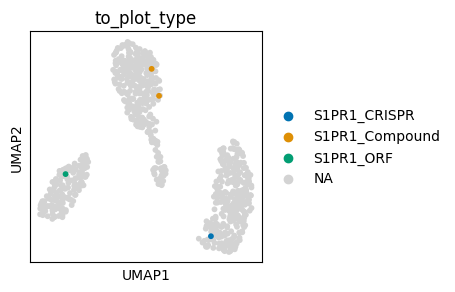

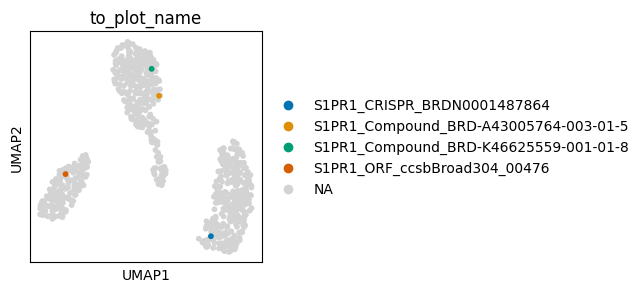

['S1PR2_CRISPR_BRDN0001482049', 'S1PR2_CRISPR_BRDN0001485038', 'S1PR2_Compound_BRD-K29151923-001-01-5', 'S1PR2_Compound_BRD-K43330982-001-02-3', 'S1PR2_ORF_ccsbBroad304_02129']


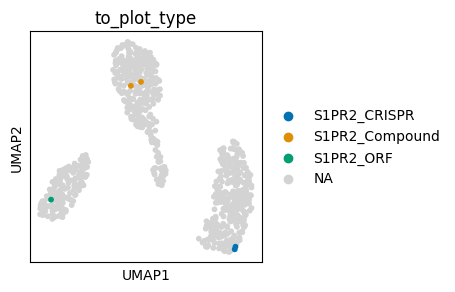

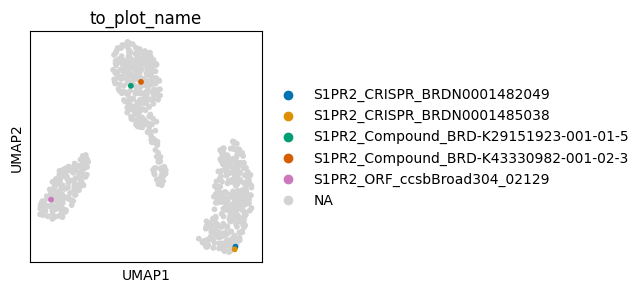

['S1PR4_CRISPR_BRDN0001480034', 'S1PR4_CRISPR_BRDN0001484463', 'S1PR4_Compound_BRD-K69877120-001-01-7', 'S1PR4_Compound_BRD-K80666802-003-01-0', 'S1PR4_ORF_ccsbBroad304_01991']


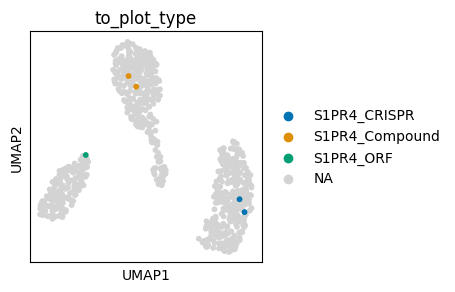

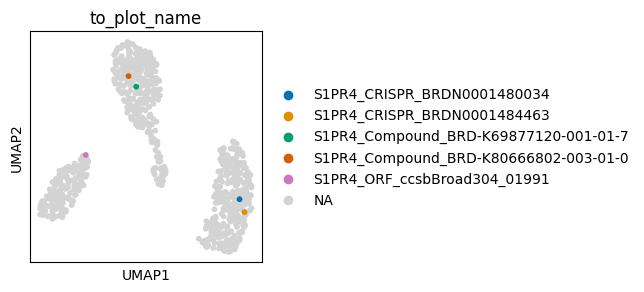

['SCNN1G_CRISPR_BRDN0001485163', 'SCNN1G_CRISPR_BRDN0001488543', 'SCNN1G_Compound_BRD-K87158025-003-08-7', 'SCNN1G_Compound_BRD-K92049597-001-20-8', 'SCNN1G_ORF_ccsbBroad304_01492']


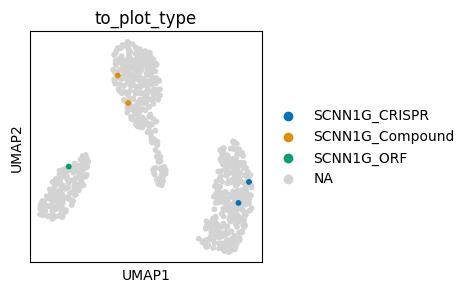

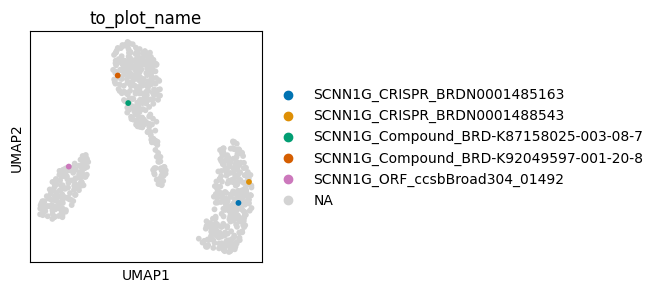

['SIRT2_CRISPR_BRDN0001056840', 'SIRT2_Compound_BRD-K09143580-001-01-0', 'SIRT2_Compound_BRD-K16472653-001-01-6', 'SIRT2_ORF_ccsbBroad304_02705']


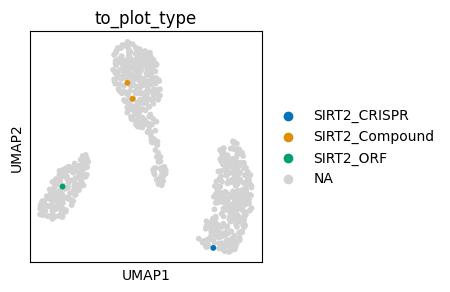

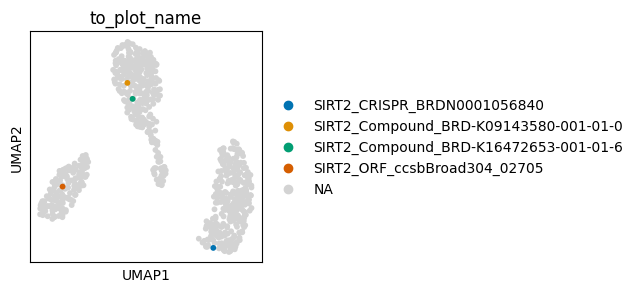

['SLC29A1_CRISPR_BRDN0001482450', 'SLC29A1_CRISPR_BRDN0001483817', 'SLC29A1_Compound_BRD-K48722258-300-11-0', 'SLC29A1_Compound_BRD-K60150510-001-15-6', 'SLC29A1_ORF_ccsbBroad304_00504']


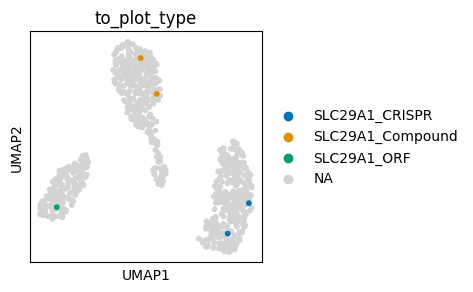

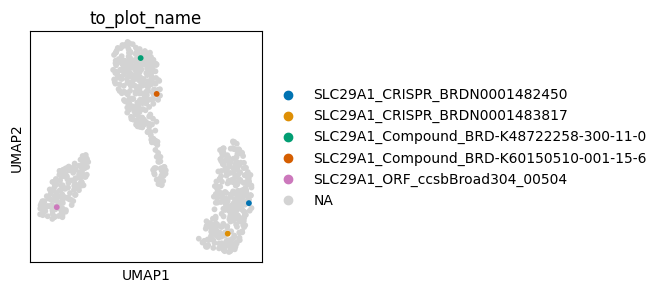

['SLC7A11_CRISPR_BRDN0001480510', 'SLC7A11_CRISPR_BRDN0001483086', 'SLC7A11_Compound_BRD-A15397381-001-02-5', 'SLC7A11_Compound_BRD-K59058747-001-19-1', 'SLC7A11_ORF_ccsbBroad304_02826']


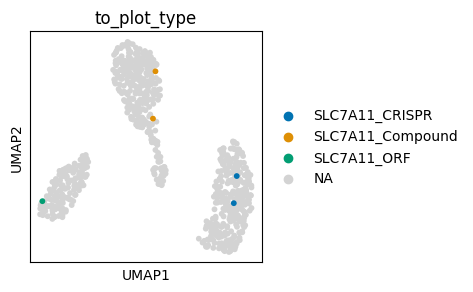

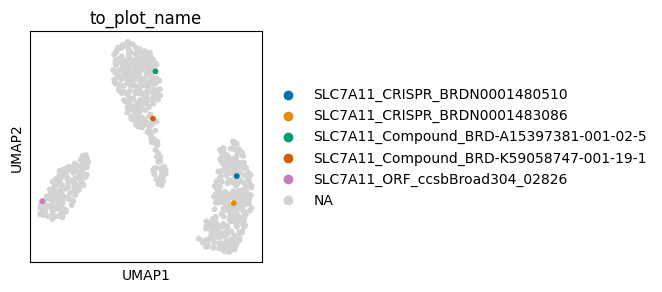

['SLCO2B1_CRISPR_BRDN0001485154', 'SLCO2B1_CRISPR_BRDN0001489686', 'SLCO2B1_Compound_BRD-K36927236-001-36-7', 'SLCO2B1_Compound_BRD-K38512030-001-01-7', 'SLCO2B1_ORF_ccsbBroad304_07795']


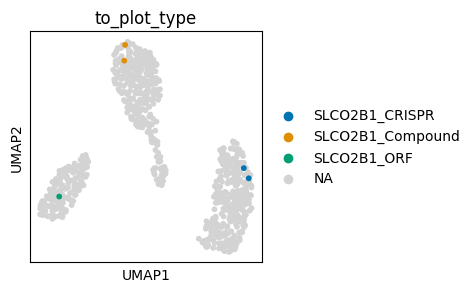

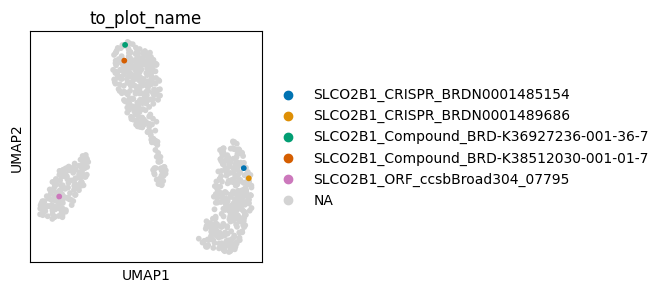

['SSTR2_CRISPR_BRDN0001480942', 'SSTR2_CRISPR_BRDN0001487345', 'SSTR2_Compound_BRD-A64173453-015-03-1', 'SSTR2_Compound_BRD-K14681867-001-01-6', 'SSTR2_ORF_ccsbBroad304_01602']


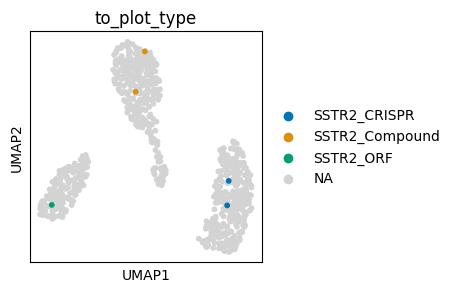

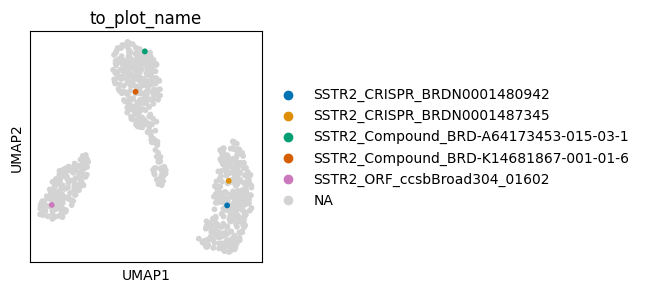

['TBXAS1_CRISPR_BRDN0001480267', 'TBXAS1_CRISPR_BRDN0001486813', 'TBXAS1_Compound_BRD-K01825660-322-01-9', 'TBXAS1_Compound_BRD-K53061490-003-13-9', 'TBXAS1_ORF_ccsbBroad304_01649']


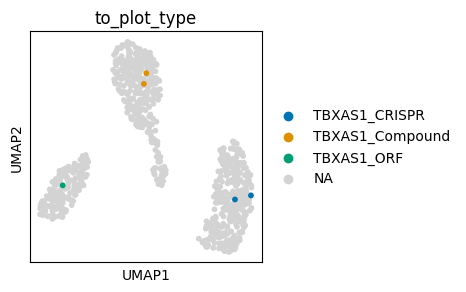

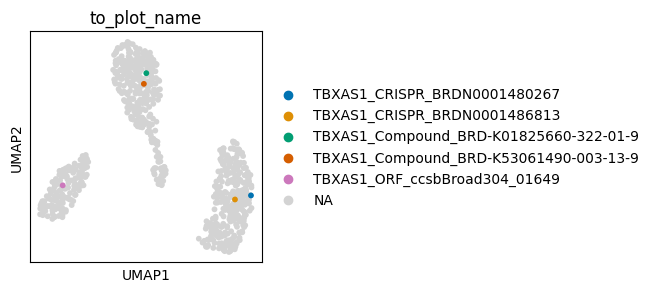

['TGFBR1_CRISPR_BRDN0000735603', 'TGFBR1_CRISPR_BRDN0000735610', 'TGFBR1_Compound_BRD-K40109029-001-02-9', 'TGFBR1_Compound_BRD-K47557313-001-02-7', 'TGFBR1_ORF_ccsbBroad304_01666']


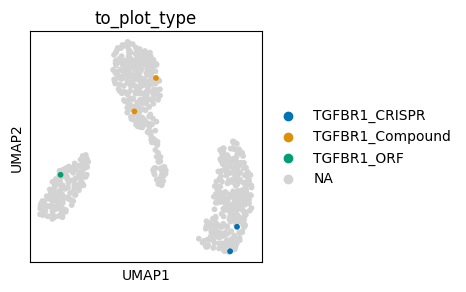

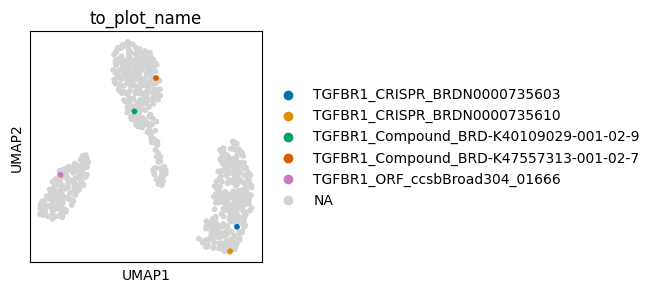

['TGM2_CRISPR_BRDN0001479616', 'TGM2_CRISPR_BRDN0001487881', 'TGM2_Compound_BRD-K38272302-001-02-7', 'TGM2_Compound_BRD-K51485109-001-01-4', 'TGM2_ORF_ccsbBroad304_07061']


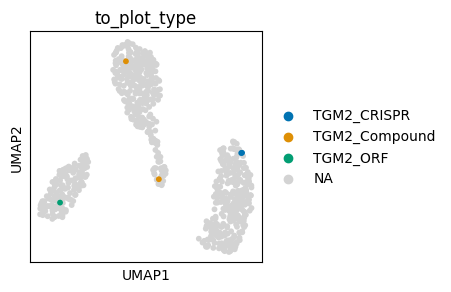

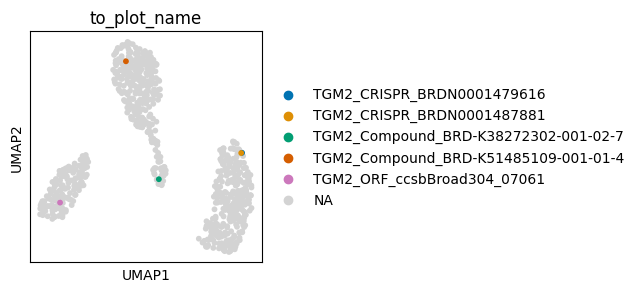

['TNF_CRISPR_BRDN0001486858', 'TNF_CRISPR_BRDN0001487201', 'TNF_Compound_BRD-K47738867-001-01-5', 'TNF_Compound_BRD-K81405859-300-01-4', 'TNF_ORF_ccsbBroad304_01684']


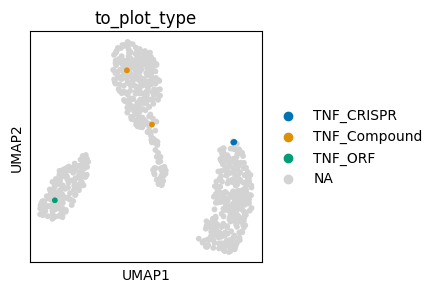

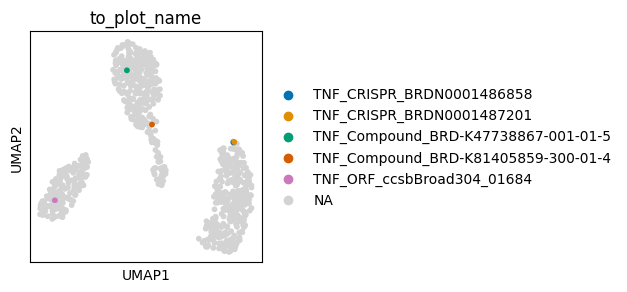

['TNNC1_CRISPR_BRDN0001480594', 'TNNC1_CRISPR_BRDN0001483958', 'TNNC1_Compound_BRD-A30815329-001-12-1', 'TNNC1_Compound_BRD-A91008255-003-24-8', 'TNNC1_ORF_ccsbBroad304_01690']


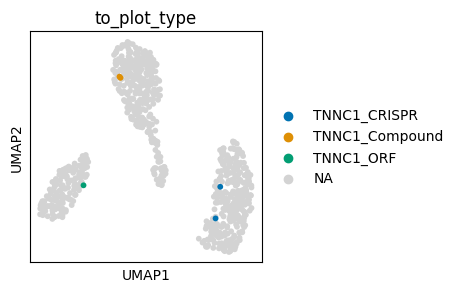

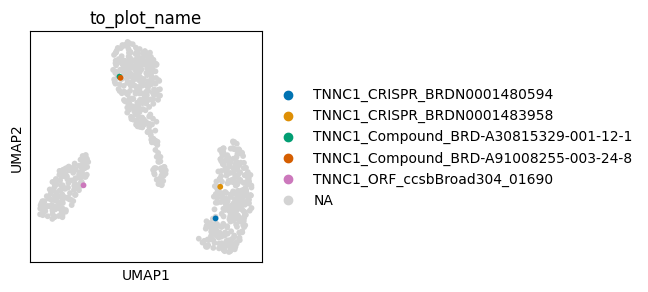

['TUBB_CRISPR_BRDN0001488241', 'TUBB_CRISPR_BRDN0001489809', 'TUBB_Compound_BRD-K23363278-001-02-1', 'TUBB_ORF_ccsbBroad304_05206']


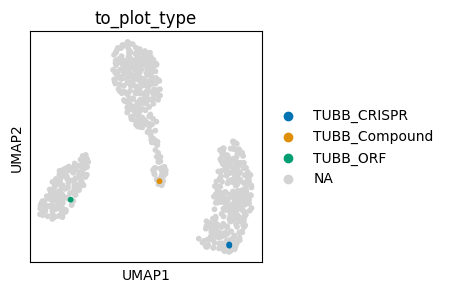

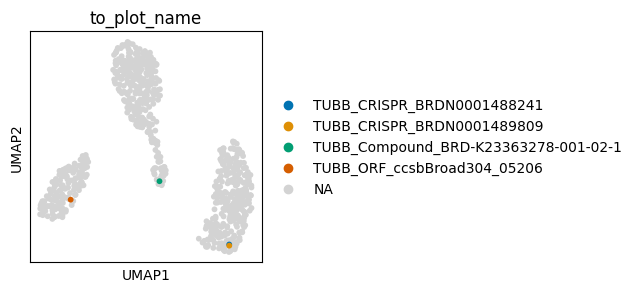

['TUBB3_CRISPR_BRDN0001481198', 'TUBB3_CRISPR_BRDN0001488082', 'TUBB3_Compound_BRD-K00259736-001-16-4', 'TUBB3_Compound_BRD-K68164687-001-01-6', 'TUBB3_ORF_ccsbBroad304_02415']


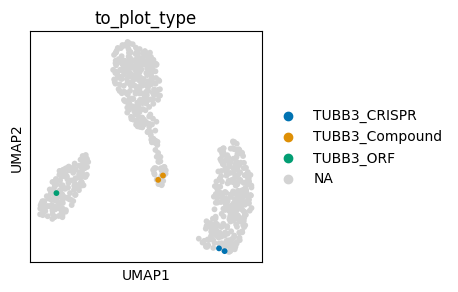

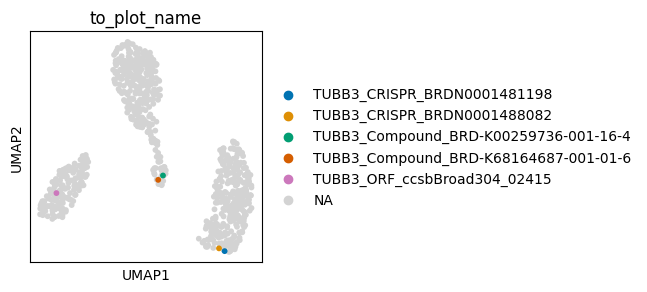

['TUBB4B_CRISPR_BRDN0001479766', 'TUBB4B_CRISPR_BRDN0001480275', 'TUBB4B_Compound_BRD-K03601870-001-01-2', 'TUBB4B_Compound_BRD-K52075715-001-06-7', 'TUBB4B_ORF_ccsbBroad304_02416']


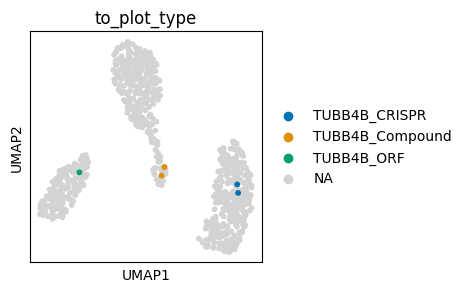

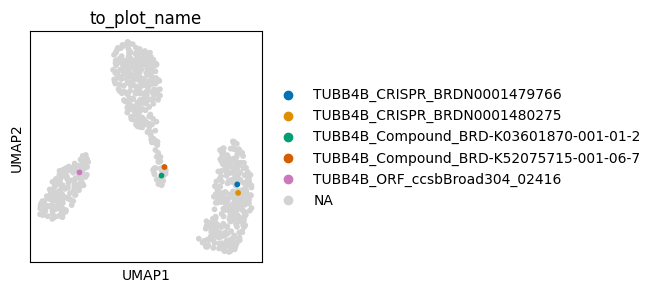

['UGT1A9_CRISPR_BRDN0001483238', 'UGT1A9_Compound_BRD-K19227686-001-18-6', 'UGT1A9_Compound_BRD-K98763141-001-30-8', 'UGT1A9_ORF_ccsbBroad304_03441']


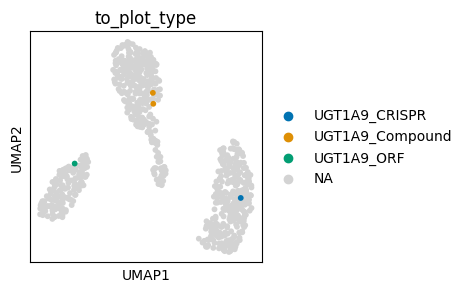

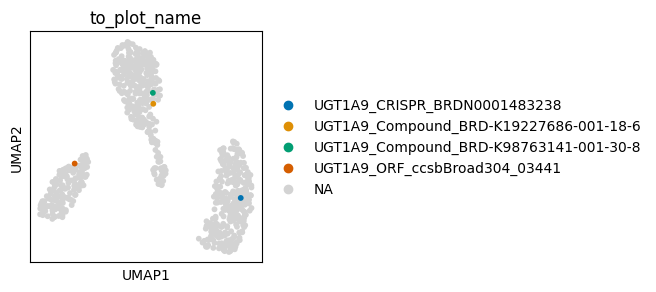

['USP1_CRISPR_BRDN0001484218', 'USP1_CRISPR_BRDN0001487607', 'USP1_Compound_BRD-K81197548-003-01-4', 'USP1_Compound_BRD-K93942811-001-01-3', 'USP1_ORF_ccsbBroad304_01760']


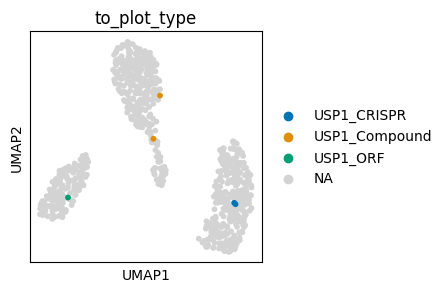

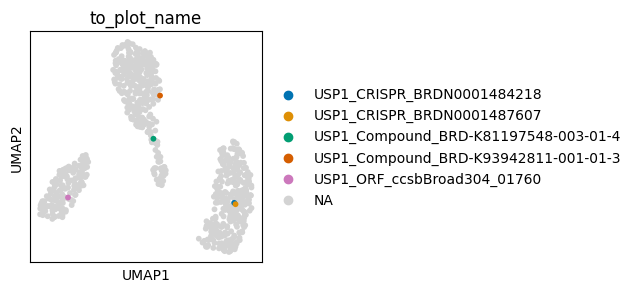

['VEGFA_CRISPR_BRDN0001065457', 'VEGFA_CRISPR_BRDN0001488344', 'VEGFA_Compound_BRD-K47978074-001-03-2', 'VEGFA_Compound_BRD-K57313110-001-06-8', 'VEGFA_ORF_ccsbBroad304_01768']


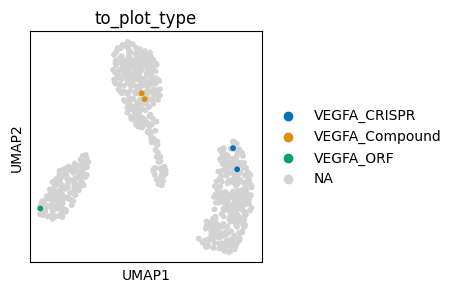

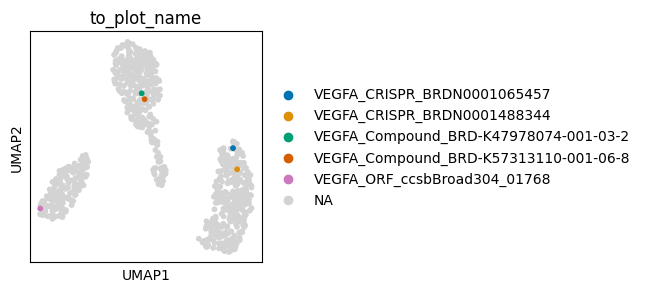

In [47]:
for gene_unique in unique_genes:
    to_plot_type = [f"{gene}_{pert_type}" if gene==gene_unique else None for (pert_type, gene) in zip(adata.obs.PERT_TYPE, adata.obs.GENE)]
    to_plot_name = [f"{gene}_{pert_type}_{pert_name}" if gene==gene_unique else None for (pert_type, gene, pert_name) in zip(adata.obs.PERT_TYPE, adata.obs.GENE, adata.obs.PERT_NAME)]
    adata.obs["to_plot_type"] = to_plot_type
    adata.obs["to_plot_name"] = to_plot_name
    adata.obs["to_plot_type"] = adata.obs["to_plot_type"].astype("category")
    adata.obs["to_plot_name"] = adata.obs["to_plot_name"].astype("category")

    print([i  for i in to_plot_name if i!= None ])
    sc.pl.umap(adata, color="to_plot_type", s=70, palette=sns.color_palette("colorblind"))
    sc.pl.umap(adata, color="to_plot_name", s=70, palette=sns.color_palette("colorblind"))

['RPL23A_CRISPR_BRDN0001481176', 'RPL23A_CRISPR_BRDN0001484348', 'RPL23A_Compound_BRD-K01824976-300-02-9', 'RPL23A_Compound_BRD-K91370081-001-25-1', 'RPL23A_ORF_ccsbBroad304_06884']


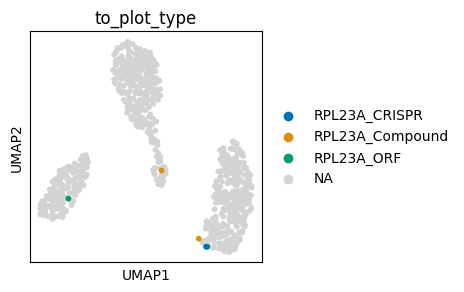

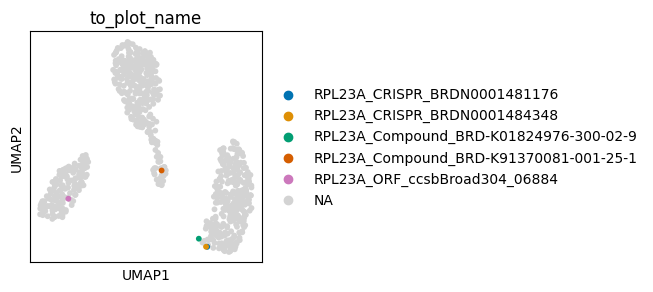

In [78]:
gene_unique="RPL23A"
to_plot_type = [f"{gene}_{pert_type}" if gene==gene_unique else None for (pert_type, gene) in zip(adata.obs.PERT_TYPE, adata.obs.GENE)]
to_plot_name = [f"{gene}_{pert_type}_{pert_name}" if gene==gene_unique else None for (pert_type, gene, pert_name) in zip(adata.obs.PERT_TYPE, adata.obs.GENE, adata.obs.PERT_NAME)]
adata.obs["to_plot_type"] = to_plot_type
adata.obs["to_plot_name"] = to_plot_name
adata.obs["to_plot_type"] = adata.obs["to_plot_type"].astype("category")
adata.obs["to_plot_name"] = adata.obs["to_plot_name"].astype("category")

print([i  for i in to_plot_name if i!= None ])
sc.pl.umap(adata, color="to_plot_type", s=70, palette=sns.color_palette("colorblind"))
sc.pl.umap(adata, color="to_plot_name", s=70, palette=sns.color_palette("colorblind"))

Leave out CRISPR:
* BRDN0001145239 - PDKP1
* BRDN0001144958 - BTK
* BRDN0001054037 - PLK1
* BRDN0001145503 - LCK
* BRDN0001481569 - CYP3A4
* BRDN0000733514 - BRD4
* BRDN0001145324 - FLT3
* BRDN0001481176 - RPL23A
* BRDN0001065244 - MAPK8

Leave out DRUGS:
* BRD-K34581968-001-05-3 - PDPK1
* BRD-K90747162-001-01-4 - FLT3
* BRD-K01824976-300-02-9 - RPL23A
* BRD-A22713669-001-04-3 - PTPN2
* BRD-K76674262-001-03-3 - RPL3
* BRD-A10188456-001-04-9 - ANXA1
* BRD-K09295674-001-09-8 - CA14
* BRD-K18131774-001-18-4 - CA5A
* BRD-K14560436-001-01-4 - CDK9
* BRD-K43570081-001-02-4 -  HSP90AB1
* BRD-A99888680-001-05-3 - HTR2C
* BRD-K54330070-001-19-6 - MAPK14
* BRD-K40109029-001-02-9 - TGFBR1
* BRD-K00259736-001-16-4 - TUBB3
* BRD-K29151923-001-01-5 - S1PR4